In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import scipy
import scipy.stats
from scipy import signal
import h5py
import pandas as pd
import cv2
import skimage.feature
from sklearn.decomposition import PCA
import sklearn
import sklearn.decomposition
from sklearn.neighbors import KernelDensity

from utils import behavioral_segmentation
from utils import LFP_Processor
from utils.utils import construct_DEG_csv, to_percentile 

plt.rcParams['figure.figsize'] = (16, 9)

ModuleNotFoundError: No module named 'utils'

In [ ]:
# Papermill parameters 
# This cell has the parameters tag (View -> Cell Toolbar -> Tags)
# These variables can be overriden via command-line at runtime

lfp_file = '/LFP-Behavior/data/processed/aligned_hippo_lfp_50hz.npy' # time-aligned LFP data
lfp_fs = 50 # sampling frequency of time-aligned LFP data

xMM_file = '/LFP-Behavior/data/processed/aligned_xMM_sub10hz.npy' # time-aligned xMM data
xMM_fs = 10 # sampling frequency of time-aligned xMM data

yMM_file = '/LFP-Behavior/data/processed/aligned_yMM_sub10hz.npy' # time-aligned yMM data
yMM_fs = 10 # sampling frequency of time-aligned yMM data

sect_file = '/LFP-Behavior/data/processed/aligned_sect_sub10hz.npy' # time-aligned yMM data
sect_fs = 10 # sampling frequency of time-aligned yMM data

# Load LFP Data

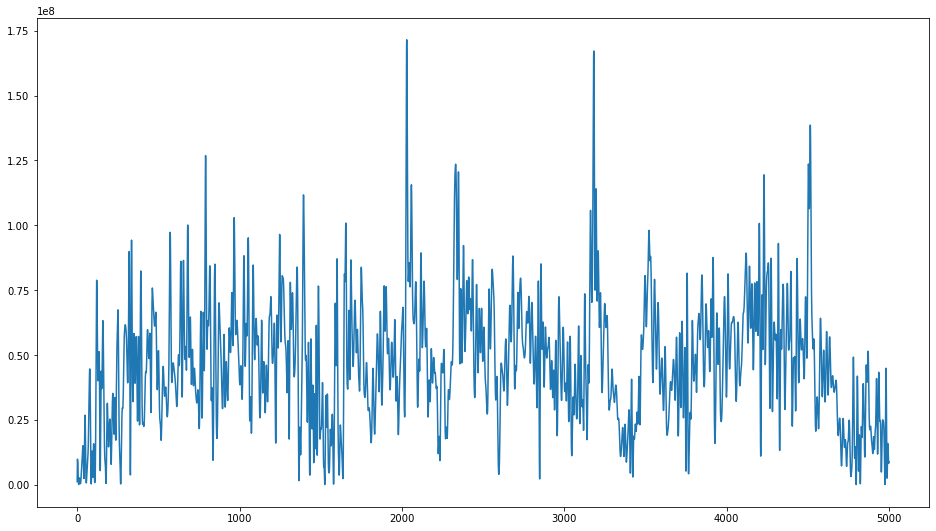

(56962,)


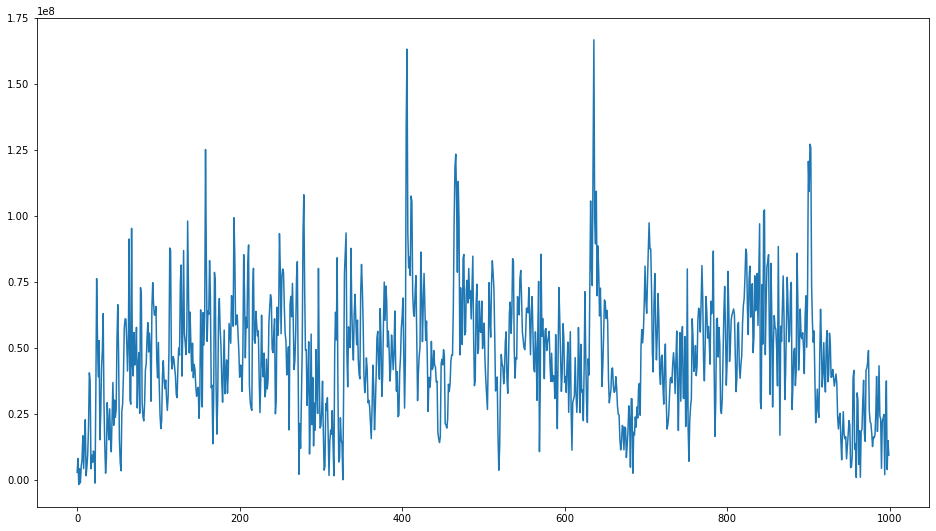

Pearson corr: 0.9475733010635902


In [4]:
# Demodulated LFP Theta Band
theta_50hz = LFP_Processor.demodulate(lfp = np.load(lfp_file), low=5, high=11, fs=lfp_fs, verbose = 0)
theta_power_50hz = np.square(np.abs(theta_50hz))

plt.plot(theta_power_50hz[:5000])
plt.show()

#theta_10hz = scipy.signal.decimate(theta_modulation_50hz, q=5.1, ftype='fir', zero_phase=True)
theta_sub10hz = scipy.signal.resample(theta_power_50hz, int(len(theta_power_50hz)/(50/(1526/152.7))) )[:57000]
print(theta_sub10hz.shape)

plt.plot(theta_sub10hz[:1000])
plt.show()

corr, _ = scipy.stats.pearsonr(theta_power_50hz[:5000][::5], theta_sub10hz[:1000])
print("Pearson corr:", corr)
assert corr > 0.9

35
11


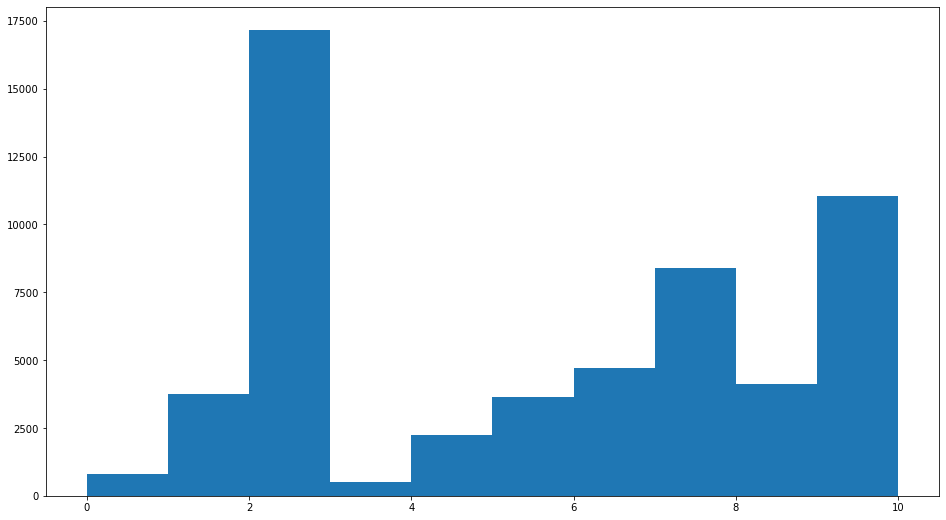

In [5]:
sect_10hz = np.load(sect_file)
plt.hist(sect_10hz, bins=np.arange(11))
segments = behavioral_segmentation.extract_segments(sect_10hz, [7, 8, 9])
segments = [seg for seg in segments if seg[2] == 9.0]

# This segment is too short to be used
i = np.argmin([segments[i][1] - segments[i][0] for i in range(len(segments))])
print(i)
segments = np.delete(segments, i, axis=0)

trimmed_segments = np.load('data/datasets/stationary_rat/trimmed_segments.npy')
print(np.min([trimmed_segments[i][1] - trimmed_segments[i][0] for i in range(len(trimmed_segments))]))

trimmed_indices = np.load('data/datasets/stationary_rat/trimmed_indices.npy')
trimmed_indices = np.delete(trimmed_indices, i , axis=0)

In [6]:
for i in range(len(segments)):
    assert segments[i][0] + trimmed_indices[i][0] == trimmed_segments[i][0]
    assert segments[i][1] + trimmed_indices[i][1] == trimmed_segments[i][1]

The history saving thread hit an unexpected error (OperationalError('disk I/O error')).History will not be written to the database.


# Load F_wave Data

In [7]:
with h5py.File('data/raw/f_waves.mat', 'r') as f:
    print(f.keys())
    
    ports = np.array(f['lapID'])[2,:]
    index = np.array(f['lapID'])[3,:]
    index = index.astype(np.uint32)
    f_amp = np.array(f['aMean'][2])
    spike_sum = np.array(f['spSum'][0])
    spike_port = np.array(f['spPort'][2])
    pc1 = np.array(f['pc1'][0])

<KeysViewHDF5 ['aMean', 'aXval', 'lapID', 'pc1', 'spPort', 'spSum']>


In [8]:
import h5py

with h5py.File('data/gautam_pca.mat', 'r') as f:
    print(f.keys())
    gautam_pc1 = list(f['va'])
    gautam_pc1 = np.array(gautam_pc1)[0]
    
g_pc1 = np.abs(gautam_pc1.view('complex'))

<KeysViewHDF5 ['va']>


Text(0.5, 1.0, 'Snapshot LFP (correct processing)')

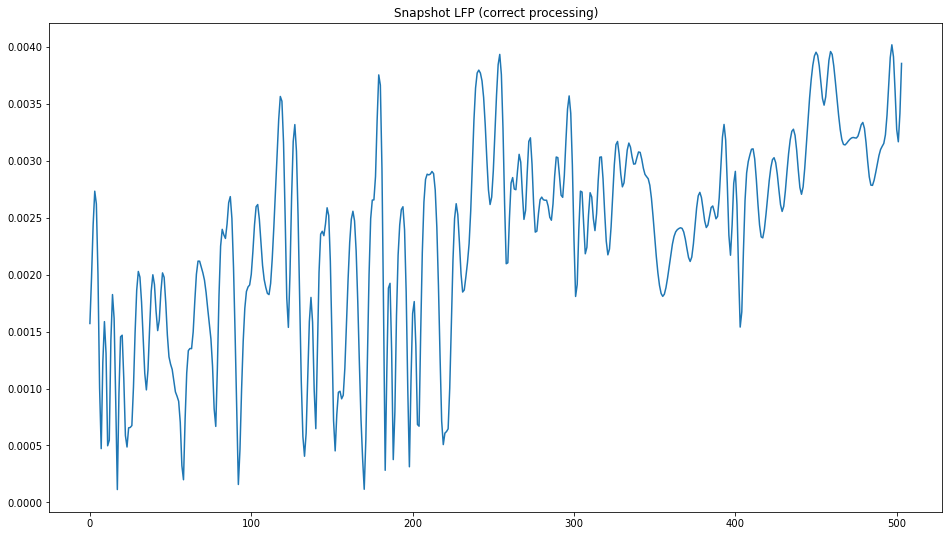

In [9]:
plt.plot(np.abs(g_pc1[int(116*2.5)+5165:5669+int(116*2.5)]))
plt.title("Snapshot LFP (correct processing)")

Text(0.5, 1.0, 'Processed LFP')

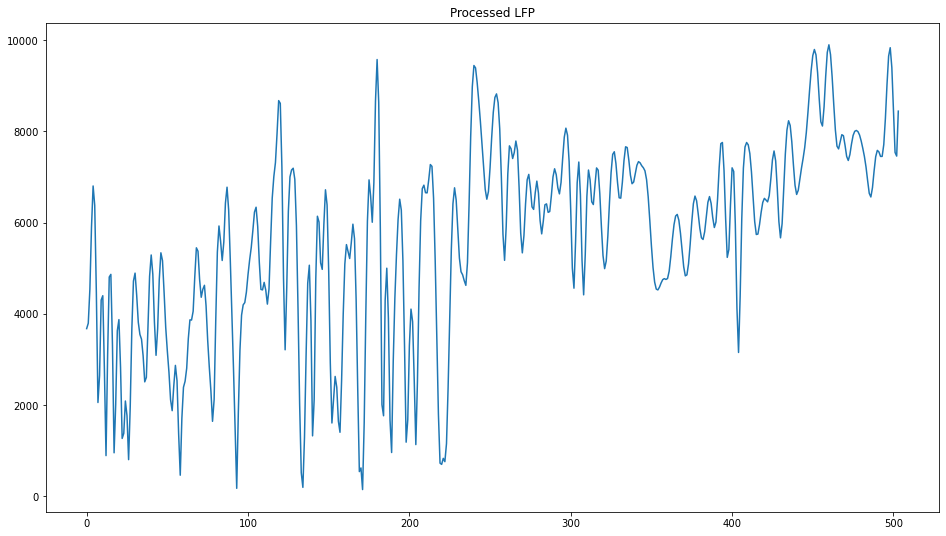

In [10]:
plt.plot(np.abs(theta_50hz[::2][5165:5669]))
plt.title("Processed LFP")

In [11]:
theta_25hz = scipy.signal.resample(np.sqrt(theta_power_50hz), len(theta_power_50hz)//2)

In [12]:
i = 10
print(theta_25hz[int(index[i])]/np.max(theta_25hz))
print(pc1[i]/np.max(pc1))

0.3174951960592894
0.20883513209497118


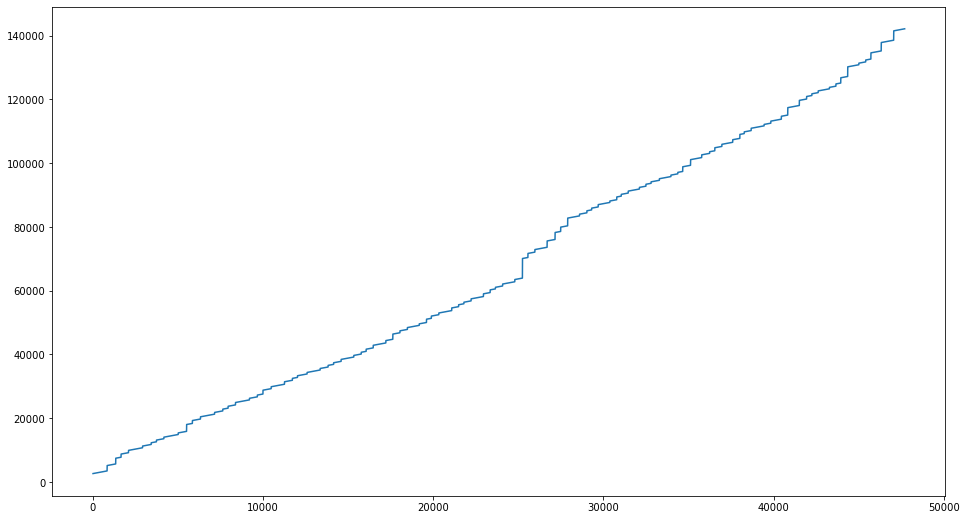

In [13]:
plt.plot(index)

In [14]:
index[826:1331]

array([5165, 5166, 5167, 5168, 5169, 5170, 5171, 5172, 5173, 5174, 5175,
       5176, 5177, 5178, 5179, 5180, 5181, 5182, 5183, 5184, 5185, 5186,
       5187, 5188, 5189, 5190, 5191, 5192, 5193, 5194, 5195, 5196, 5197,
       5198, 5199, 5200, 5201, 5202, 5203, 5204, 5205, 5206, 5207, 5208,
       5209, 5210, 5211, 5212, 5213, 5214, 5215, 5216, 5217, 5218, 5219,
       5220, 5221, 5222, 5223, 5224, 5225, 5226, 5227, 5228, 5229, 5230,
       5231, 5232, 5233, 5234, 5235, 5236, 5237, 5238, 5239, 5240, 5241,
       5242, 5243, 5244, 5245, 5246, 5247, 5248, 5249, 5250, 5251, 5252,
       5253, 5254, 5255, 5256, 5257, 5258, 5259, 5260, 5261, 5262, 5263,
       5264, 5265, 5266, 5267, 5268, 5269, 5270, 5271, 5272, 5273, 5274,
       5275, 5276, 5277, 5278, 5279, 5280, 5281, 5282, 5283, 5284, 5285,
       5286, 5287, 5288, 5289, 5290, 5291, 5292, 5293, 5294, 5295, 5296,
       5297, 5298, 5299, 5300, 5301, 5302, 5303, 5304, 5305, 5306, 5307,
       5308, 5309, 5310, 5311, 5312, 5313, 5314, 53

In [15]:
def arg_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def get_index(i, index_25hz):
    """
    i
        time shifted, sub 10hz index
    index_25hz
        index array for F-waves data at 25hz, non-shifted
    data
        data array corresponding to index_25hz
    """
    j = int((i+116)*(25/(1526/152.7))) # 25hz, unshifted index, rounded
    print('unshifted, 25hz index', j) 
    
    k = arg_nearest(index_25hz, j) # Nearest matching 25hz f-wave index
    print('matching f-wave index', k)
    
    return k

In [16]:
index[825:]

array([  3478,   5165,   5166, ..., 142134, 142135, 142136], dtype=uint32)

In [17]:
len([seg for seg in segments if seg[1]-seg[0]>60])

49

In [18]:
segments_subset = [seg for seg in segments if seg[1]-seg[0]>60][:-1]

In [19]:
seg = segments[1]
s, e, sect = seg
print(s,e)
lfp_new = []
lfp_old = []
for i in range(s,e):
    lfp_new += [pc1[get_index(i, index)]]
    lfp_old += [theta_sub10hz[i]]

1940 2160
unshifted, 25hz index 5143
matching f-wave index 826
unshifted, 25hz index 5145
matching f-wave index 826
unshifted, 25hz index 5148
matching f-wave index 826
unshifted, 25hz index 5150
matching f-wave index 826
unshifted, 25hz index 5153
matching f-wave index 826
unshifted, 25hz index 5155
matching f-wave index 826
unshifted, 25hz index 5158
matching f-wave index 826
unshifted, 25hz index 5160
matching f-wave index 826
unshifted, 25hz index 5163
matching f-wave index 826
unshifted, 25hz index 5165
matching f-wave index 826
unshifted, 25hz index 5168
matching f-wave index 829
unshifted, 25hz index 5170
matching f-wave index 831
unshifted, 25hz index 5173
matching f-wave index 834
unshifted, 25hz index 5175
matching f-wave index 836
unshifted, 25hz index 5178
matching f-wave index 839
unshifted, 25hz index 5180
matching f-wave index 841
unshifted, 25hz index 5183
matching f-wave index 844
unshifted, 25hz index 5185
matching f-wave index 846
unshifted, 25hz index 5188
matching 

SpearmanrResult(correlation=0.7062326469140341, pvalue=1.53411469411647e-34)

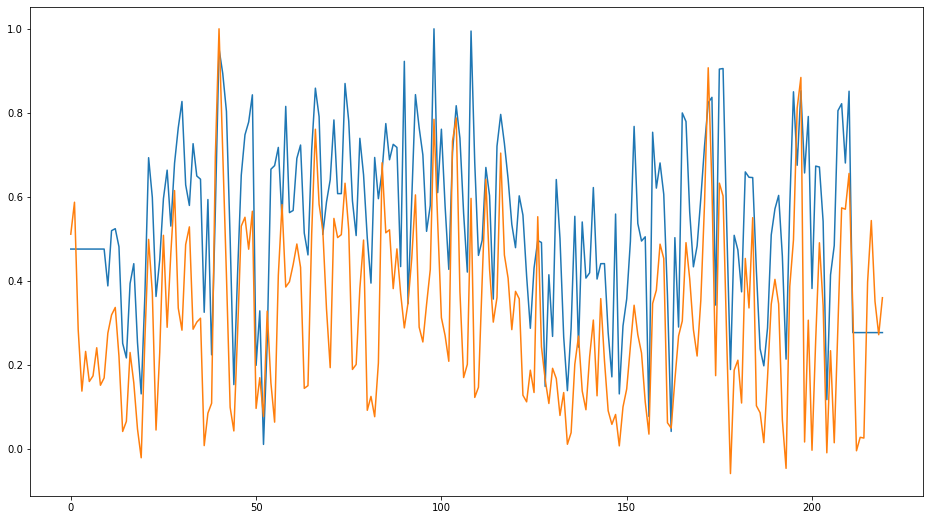

In [20]:
plt.plot(lfp_new/np.max(lfp_new))
plt.plot(lfp_old/np.max(lfp_old))
scipy.stats.spearmanr(lfp_new,lfp_old)

In [21]:
lfp_new_sub10hz = scipy.signal.resample(lfp_new, int(len(lfp_new)/(25/(1526/152.7))))

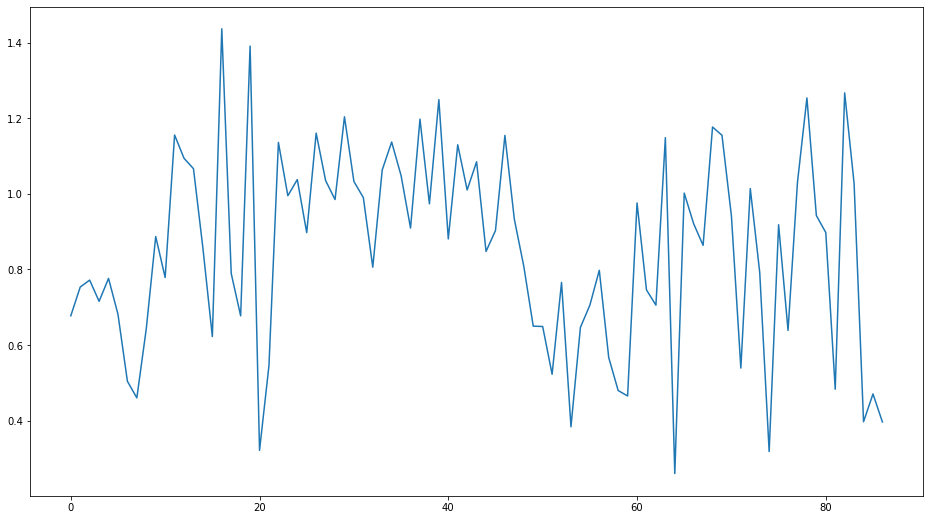

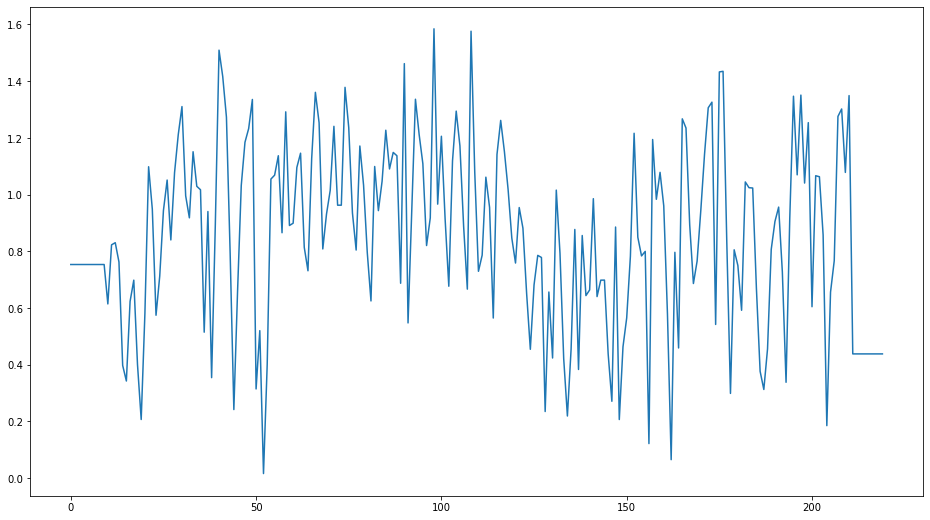

In [22]:
plt.plot(lfp_new_sub10hz[:100])
plt.show()
plt.plot(lfp_new[:250])

# Utils

In [23]:
def extract_frames(vid_index, segments):
    vid_folder = '{}_{}_{}'.format(*segments[vid_index])
    vid_path = 'data/datasets/stationary_rat/videos/{}/{}/'.format(vid_folder, vid_folder)

    s, e, sect = trimmed_segments[vid_index]
    s, e, sect = segments[vid_index]
    print(vid_path)
    frames = []
    for i in range(s, e):
        img = cv2.imread(vid_path + str(i) + '.jpg')
        #gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        #gray = cv2.normalize(gray, None, 0, 1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        blur = cv2.GaussianBlur(img, (3,3), 1)
        _, thresh = cv2.threshold(blur, 150, 255, cv2.THRESH_BINARY)
        #ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
        frames.append(thresh.flatten())

    frames = np.array(frames)
    mean = np.mean(frames, axis=0)
    #frames = frames - mean
    
    return frames

# Wavelet Decomposition

In [24]:
def cwt_transform(mode, verbose = False):
    w = 7
    t, dt = np.linspace(0, (len(mode)-1)/10, len(mode), retstep=True)
    freq = np.linspace(1, 5, 5)
    widths = w*10 / (2*freq*np.pi)
    
    cwtm = scipy.signal.cwt(mode, signal.morlet2, widths, w=w)
    
    if(verbose):
        plt.pcolormesh(t, freq , np.abs(cwtm), cmap='viridis', shading='gouraud')
        #plt.colorbar()
        plt.title('Postural Mode Spectrogram')
        plt.xlabel('Time')
        plt.ylabel('Freq')
        plt.show()
    
    return np.abs(cwtm)

def craft_training_data(modes, segments):
    X = []
    segment_indices = np.cumsum([0] + [s[1] - s[0] for s in segments])
    print(segment_indices)
    
    for mode in modes:
        spectrogram = []
        for i in range(len(segment_indices)-1):
            s, e = segment_indices[i], segment_indices[i+1]
            segment_spect = cwt_transform(mode[s:e], verbose=0)
            print(segment_spect.shape)
            spectrogram.append(np.array(segment_spect))
            print(len(spectrogram))
        print(np.hstack(spectrogram).shape)
        X.append(np.hstack(spectrogram))
        
    X = np.vstack(X).T
    return X

# T-SNE

In [25]:
from sklearn.manifold import TSNE

In [26]:
data_percentile = to_percentile(theta_sub10hz, segments)

In [27]:
# These points are the predictive cluster from DEG thresholded results

predictive_cluster = [12451, 12452, 12453, 12454, 12455, 12456, 12457, 12458, 12459,
       12462, 14114, 14115, 14116, 14117, 14118, 14119, 14120, 14121,
       14122, 14832, 14833, 14834, 14835, 14836, 14837, 14838, 14839,
       14840, 14841, 23653, 33458, 33459, 33460, 33461, 33462, 33463,
       33464, 33465, 33466, 40896, 40897, 40898, 40899, 40900, 40901,
       40902, 40903, 40904, 45732, 45733, 45734, 45735, 45736, 45737,
       45738, 45739, 45740, 50558, 50559, 50560, 50561, 50562, 50563,
       50564, 50565, 50566,  5137,  5138,  5139,  5140,  5141,  5142,
        5143,  5144,  5145,  5146, 51645, 51646, 51647, 51648, 51649,
       51650, 51653, 51654, 53679, 53680, 53681, 53682, 53683, 53684,
       53685, 53686, 53687, 53688, 53888, 53895, 53896, 54685, 54686,
       54687, 54688, 54689, 54690, 54691, 54692, 54693, 54694,   669,
         670,   671,   672,   673,   674,   675,   676,   677]

predictive_cluster = np.array(predictive_cluster)
predictive_cluster

array([12451, 12452, 12453, 12454, 12455, 12456, 12457, 12458, 12459,
       12462, 14114, 14115, 14116, 14117, 14118, 14119, 14120, 14121,
       14122, 14832, 14833, 14834, 14835, 14836, 14837, 14838, 14839,
       14840, 14841, 23653, 33458, 33459, 33460, 33461, 33462, 33463,
       33464, 33465, 33466, 40896, 40897, 40898, 40899, 40900, 40901,
       40902, 40903, 40904, 45732, 45733, 45734, 45735, 45736, 45737,
       45738, 45739, 45740, 50558, 50559, 50560, 50561, 50562, 50563,
       50564, 50565, 50566,  5137,  5138,  5139,  5140,  5141,  5142,
        5143,  5144,  5145,  5146, 51645, 51646, 51647, 51648, 51649,
       51650, 51653, 51654, 53679, 53680, 53681, 53682, 53683, 53684,
       53685, 53686, 53687, 53688, 53888, 53895, 53896, 54685, 54686,
       54687, 54688, 54689, 54690, 54691, 54692, 54693, 54694,   669,
         670,   671,   672,   673,   674,   675,   676,   677])

In [28]:
frames = []
theta_percentile = []
f_waves = []
sp_sum = []
sp_port = []
frame_num = []
for i in range(len(segments_subset)):
    s, e, sect = segments_subset[i]
    #print(s, e, sect)
    #print(i)
    frames.append(extract_frames(i, segments_subset))
    theta_percentile += list(data_percentile[s:e])
    for j in range(s,e):
        frame_num += [j]
        f_waves += [f_amp[get_index(j, index)]]
        sp_sum += [spike_sum[get_index(j, index)]]
        sp_port += [spike_port[get_index(j, index)]]
frames = np.array(frames)
frames = np.concatenate(frames)

theta_percentile = np.array(theta_percentile)

frame_num = np.array(frame_num)

frames.shape

data/datasets/stationary_rat/videos/1940_2160_9/1940_2160_9/
unshifted, 25hz index 5143
matching f-wave index 826
unshifted, 25hz index 5143
matching f-wave index 826
unshifted, 25hz index 5143
matching f-wave index 826
unshifted, 25hz index 5145
matching f-wave index 826
unshifted, 25hz index 5145
matching f-wave index 826
unshifted, 25hz index 5145
matching f-wave index 826
unshifted, 25hz index 5148
matching f-wave index 826
unshifted, 25hz index 5148
matching f-wave index 826
unshifted, 25hz index 5148
matching f-wave index 826
unshifted, 25hz index 5150
matching f-wave index 826
unshifted, 25hz index 5150
matching f-wave index 826
unshifted, 25hz index 5150
matching f-wave index 826
unshifted, 25hz index 5153
matching f-wave index 826
unshifted, 25hz index 5153
matching f-wave index 826
unshifted, 25hz index 5153
matching f-wave index 826
unshifted, 25hz index 5155
matching f-wave index 826
unshifted, 25hz index 5155
matching f-wave index 826
unshifted, 25hz index 5155
matching f-

matching f-wave index 1132
unshifted, 25hz index 5473
matching f-wave index 1134
unshifted, 25hz index 5473
matching f-wave index 1134
unshifted, 25hz index 5473
matching f-wave index 1134
unshifted, 25hz index 5476
matching f-wave index 1137
unshifted, 25hz index 5476
matching f-wave index 1137
unshifted, 25hz index 5476
matching f-wave index 1137
unshifted, 25hz index 5478
matching f-wave index 1139
unshifted, 25hz index 5478
matching f-wave index 1139
unshifted, 25hz index 5478
matching f-wave index 1139
unshifted, 25hz index 5481
matching f-wave index 1142
unshifted, 25hz index 5481
matching f-wave index 1142
unshifted, 25hz index 5481
matching f-wave index 1142
unshifted, 25hz index 5483
matching f-wave index 1144
unshifted, 25hz index 5483
matching f-wave index 1144
unshifted, 25hz index 5483
matching f-wave index 1144
unshifted, 25hz index 5486
matching f-wave index 1147
unshifted, 25hz index 5486
matching f-wave index 1147
unshifted, 25hz index 5486
matching f-wave index 1147
u

unshifted, 25hz index 8740
matching f-wave index 1646
unshifted, 25hz index 8740
matching f-wave index 1646
unshifted, 25hz index 8740
matching f-wave index 1646
unshifted, 25hz index 8743
matching f-wave index 1646
unshifted, 25hz index 8743
matching f-wave index 1646
unshifted, 25hz index 8743
matching f-wave index 1646
unshifted, 25hz index 8745
matching f-wave index 1646
unshifted, 25hz index 8745
matching f-wave index 1646
unshifted, 25hz index 8745
matching f-wave index 1646
unshifted, 25hz index 8748
matching f-wave index 1646
unshifted, 25hz index 8748
matching f-wave index 1646
unshifted, 25hz index 8748
matching f-wave index 1646
unshifted, 25hz index 8750
matching f-wave index 1646
unshifted, 25hz index 8750
matching f-wave index 1646
unshifted, 25hz index 8750
matching f-wave index 1646
unshifted, 25hz index 8753
matching f-wave index 1646
unshifted, 25hz index 8753
matching f-wave index 1646
unshifted, 25hz index 8753
matching f-wave index 1646
unshifted, 25hz index 8755
m

unshifted, 25hz index 8990
matching f-wave index 1870
unshifted, 25hz index 8990
matching f-wave index 1870
unshifted, 25hz index 8993
matching f-wave index 1873
unshifted, 25hz index 8993
matching f-wave index 1873
unshifted, 25hz index 8993
matching f-wave index 1873
unshifted, 25hz index 8995
matching f-wave index 1875
unshifted, 25hz index 8995
matching f-wave index 1875
unshifted, 25hz index 8995
matching f-wave index 1875
unshifted, 25hz index 8998
matching f-wave index 1878
unshifted, 25hz index 8998
matching f-wave index 1878
unshifted, 25hz index 8998
matching f-wave index 1878
unshifted, 25hz index 9000
matching f-wave index 1880
unshifted, 25hz index 9000
matching f-wave index 1880
unshifted, 25hz index 9000
matching f-wave index 1880
unshifted, 25hz index 9003
matching f-wave index 1883
unshifted, 25hz index 9003
matching f-wave index 1883
unshifted, 25hz index 9003
matching f-wave index 1883
unshifted, 25hz index 9005
matching f-wave index 1885
unshifted, 25hz index 9005
m

unshifted, 25hz index 11252
matching f-wave index 2909
unshifted, 25hz index 11252
matching f-wave index 2909
unshifted, 25hz index 11252
matching f-wave index 2909
unshifted, 25hz index 11254
matching f-wave index 2909
unshifted, 25hz index 11254
matching f-wave index 2909
unshifted, 25hz index 11254
matching f-wave index 2909
unshifted, 25hz index 11257
matching f-wave index 2909
unshifted, 25hz index 11257
matching f-wave index 2909
unshifted, 25hz index 11257
matching f-wave index 2909
unshifted, 25hz index 11259
matching f-wave index 2909
unshifted, 25hz index 11259
matching f-wave index 2909
unshifted, 25hz index 11259
matching f-wave index 2909
unshifted, 25hz index 11262
matching f-wave index 2909
unshifted, 25hz index 11262
matching f-wave index 2909
unshifted, 25hz index 11262
matching f-wave index 2909
unshifted, 25hz index 11264
matching f-wave index 2909
unshifted, 25hz index 11264
matching f-wave index 2909
unshifted, 25hz index 11264
matching f-wave index 2909
unshifted,

matching f-wave index 3220
unshifted, 25hz index 11585
matching f-wave index 3220
unshifted, 25hz index 11585
matching f-wave index 3220
unshifted, 25hz index 11587
matching f-wave index 3222
unshifted, 25hz index 11587
matching f-wave index 3222
unshifted, 25hz index 11587
matching f-wave index 3222
unshifted, 25hz index 11590
matching f-wave index 3225
unshifted, 25hz index 11590
matching f-wave index 3225
unshifted, 25hz index 11590
matching f-wave index 3225
unshifted, 25hz index 11592
matching f-wave index 3227
unshifted, 25hz index 11592
matching f-wave index 3227
unshifted, 25hz index 11592
matching f-wave index 3227
unshifted, 25hz index 11595
matching f-wave index 3230
unshifted, 25hz index 11595
matching f-wave index 3230
unshifted, 25hz index 11595
matching f-wave index 3230
unshifted, 25hz index 11597
matching f-wave index 3232
unshifted, 25hz index 11597
matching f-wave index 3232
unshifted, 25hz index 11597
matching f-wave index 3232
unshifted, 25hz index 11600
matching f

unshifted, 25hz index 13126
matching f-wave index 3726
unshifted, 25hz index 13126
matching f-wave index 3726
unshifted, 25hz index 13126
matching f-wave index 3726
unshifted, 25hz index 13128
matching f-wave index 3726
unshifted, 25hz index 13128
matching f-wave index 3726
unshifted, 25hz index 13128
matching f-wave index 3726
unshifted, 25hz index 13131
matching f-wave index 3726
unshifted, 25hz index 13131
matching f-wave index 3726
unshifted, 25hz index 13131
matching f-wave index 3726
unshifted, 25hz index 13133
matching f-wave index 3726
unshifted, 25hz index 13133
matching f-wave index 3726
unshifted, 25hz index 13133
matching f-wave index 3726
unshifted, 25hz index 13136
matching f-wave index 3726
unshifted, 25hz index 13136
matching f-wave index 3726
unshifted, 25hz index 13136
matching f-wave index 3726
unshifted, 25hz index 13138
matching f-wave index 3726
unshifted, 25hz index 13138
matching f-wave index 3726
unshifted, 25hz index 13138
matching f-wave index 3726
unshifted,

matching f-wave index 4059
unshifted, 25hz index 13481
matching f-wave index 4059
unshifted, 25hz index 13483
matching f-wave index 4061
unshifted, 25hz index 13483
matching f-wave index 4061
unshifted, 25hz index 13483
matching f-wave index 4061
unshifted, 25hz index 13486
matching f-wave index 4064
unshifted, 25hz index 13486
matching f-wave index 4064
unshifted, 25hz index 13486
matching f-wave index 4064
unshifted, 25hz index 13488
matching f-wave index 4066
unshifted, 25hz index 13488
matching f-wave index 4066
unshifted, 25hz index 13488
matching f-wave index 4066
unshifted, 25hz index 13491
matching f-wave index 4069
unshifted, 25hz index 13491
matching f-wave index 4069
unshifted, 25hz index 13491
matching f-wave index 4069
unshifted, 25hz index 13493
matching f-wave index 4071
unshifted, 25hz index 13493
matching f-wave index 4071
unshifted, 25hz index 13493
matching f-wave index 4071
unshifted, 25hz index 13496
matching f-wave index 4074
unshifted, 25hz index 13496
matching f

unshifted, 25hz index 15375
matching f-wave index 5004
unshifted, 25hz index 15375
matching f-wave index 5004
unshifted, 25hz index 15375
matching f-wave index 5004
unshifted, 25hz index 15377
matching f-wave index 5004
unshifted, 25hz index 15377
matching f-wave index 5004
unshifted, 25hz index 15377
matching f-wave index 5004
unshifted, 25hz index 15380
matching f-wave index 5004
unshifted, 25hz index 15380
matching f-wave index 5004
unshifted, 25hz index 15380
matching f-wave index 5004
unshifted, 25hz index 15382
matching f-wave index 5004
unshifted, 25hz index 15382
matching f-wave index 5004
unshifted, 25hz index 15382
matching f-wave index 5004
unshifted, 25hz index 15385
matching f-wave index 5004
unshifted, 25hz index 15385
matching f-wave index 5004
unshifted, 25hz index 15385
matching f-wave index 5004
unshifted, 25hz index 15387
matching f-wave index 5004
unshifted, 25hz index 15387
matching f-wave index 5004
unshifted, 25hz index 15387
matching f-wave index 5004
unshifted,

matching f-wave index 5365
unshifted, 25hz index 15760
matching f-wave index 5368
unshifted, 25hz index 15760
matching f-wave index 5368
unshifted, 25hz index 15760
matching f-wave index 5368
unshifted, 25hz index 15762
matching f-wave index 5370
unshifted, 25hz index 15762
matching f-wave index 5370
unshifted, 25hz index 15762
matching f-wave index 5370
unshifted, 25hz index 15765
matching f-wave index 5373
unshifted, 25hz index 15765
matching f-wave index 5373
unshifted, 25hz index 15765
matching f-wave index 5373
unshifted, 25hz index 15767
matching f-wave index 5375
unshifted, 25hz index 15767
matching f-wave index 5375
unshifted, 25hz index 15767
matching f-wave index 5375
unshifted, 25hz index 15770
matching f-wave index 5378
unshifted, 25hz index 15770
matching f-wave index 5378
unshifted, 25hz index 15770
matching f-wave index 5378
unshifted, 25hz index 15772
matching f-wave index 5380
unshifted, 25hz index 15772
matching f-wave index 5380
unshifted, 25hz index 15772
matching f

unshifted, 25hz index 19260
matching f-wave index 5838
unshifted, 25hz index 19260
matching f-wave index 5838
unshifted, 25hz index 19260
matching f-wave index 5838
unshifted, 25hz index 19262
matching f-wave index 5838
unshifted, 25hz index 19262
matching f-wave index 5838
unshifted, 25hz index 19262
matching f-wave index 5838
unshifted, 25hz index 19265
matching f-wave index 5838
unshifted, 25hz index 19265
matching f-wave index 5838
unshifted, 25hz index 19265
matching f-wave index 5838
unshifted, 25hz index 19267
matching f-wave index 5838
unshifted, 25hz index 19267
matching f-wave index 5838
unshifted, 25hz index 19267
matching f-wave index 5838
unshifted, 25hz index 19270
matching f-wave index 5838
unshifted, 25hz index 19270
matching f-wave index 5838
unshifted, 25hz index 19270
matching f-wave index 5838
unshifted, 25hz index 19272
matching f-wave index 5838
unshifted, 25hz index 19272
matching f-wave index 5838
unshifted, 25hz index 19272
matching f-wave index 5838
unshifted,

matching f-wave index 6162
unshifted, 25hz index 19605
matching f-wave index 6162
unshifted, 25hz index 19607
matching f-wave index 6164
unshifted, 25hz index 19607
matching f-wave index 6164
unshifted, 25hz index 19607
matching f-wave index 6164
unshifted, 25hz index 19610
matching f-wave index 6167
unshifted, 25hz index 19610
matching f-wave index 6167
unshifted, 25hz index 19610
matching f-wave index 6167
unshifted, 25hz index 19612
matching f-wave index 6169
unshifted, 25hz index 19612
matching f-wave index 6169
unshifted, 25hz index 19612
matching f-wave index 6169
unshifted, 25hz index 19615
matching f-wave index 6172
unshifted, 25hz index 19615
matching f-wave index 6172
unshifted, 25hz index 19615
matching f-wave index 6172
unshifted, 25hz index 19617
matching f-wave index 6174
unshifted, 25hz index 19617
matching f-wave index 6174
unshifted, 25hz index 19617
matching f-wave index 6174
unshifted, 25hz index 19620
matching f-wave index 6177
unshifted, 25hz index 19620
matching f

unshifted, 25hz index 21799
matching f-wave index 7142
unshifted, 25hz index 21799
matching f-wave index 7142
unshifted, 25hz index 21799
matching f-wave index 7142
unshifted, 25hz index 21801
matching f-wave index 7142
unshifted, 25hz index 21801
matching f-wave index 7142
unshifted, 25hz index 21801
matching f-wave index 7142
unshifted, 25hz index 21804
matching f-wave index 7142
unshifted, 25hz index 21804
matching f-wave index 7142
unshifted, 25hz index 21804
matching f-wave index 7142
unshifted, 25hz index 21806
matching f-wave index 7142
unshifted, 25hz index 21806
matching f-wave index 7142
unshifted, 25hz index 21806
matching f-wave index 7142
unshifted, 25hz index 21809
matching f-wave index 7142
unshifted, 25hz index 21809
matching f-wave index 7142
unshifted, 25hz index 21809
matching f-wave index 7142
unshifted, 25hz index 21811
matching f-wave index 7142
unshifted, 25hz index 21811
matching f-wave index 7142
unshifted, 25hz index 21811
matching f-wave index 7142
unshifted,

unshifted, 25hz index 22034
matching f-wave index 7355
unshifted, 25hz index 22034
matching f-wave index 7355
unshifted, 25hz index 22036
matching f-wave index 7357
unshifted, 25hz index 22036
matching f-wave index 7357
unshifted, 25hz index 22036
matching f-wave index 7357
unshifted, 25hz index 22039
matching f-wave index 7360
unshifted, 25hz index 22039
matching f-wave index 7360
unshifted, 25hz index 22039
matching f-wave index 7360
unshifted, 25hz index 22041
matching f-wave index 7362
unshifted, 25hz index 22041
matching f-wave index 7362
unshifted, 25hz index 22041
matching f-wave index 7362
unshifted, 25hz index 22044
matching f-wave index 7365
unshifted, 25hz index 22044
matching f-wave index 7365
unshifted, 25hz index 22044
matching f-wave index 7365
unshifted, 25hz index 22046
matching f-wave index 7367
unshifted, 25hz index 22046
matching f-wave index 7367
unshifted, 25hz index 22046
matching f-wave index 7367
unshifted, 25hz index 22049
matching f-wave index 7370
unshifted,

unshifted, 25hz index 23733
matching f-wave index 7937
unshifted, 25hz index 23733
matching f-wave index 7937
unshifted, 25hz index 23733
matching f-wave index 7937
unshifted, 25hz index 23735
matching f-wave index 7937
unshifted, 25hz index 23735
matching f-wave index 7937
unshifted, 25hz index 23735
matching f-wave index 7937
unshifted, 25hz index 23738
matching f-wave index 7937
unshifted, 25hz index 23738
matching f-wave index 7937
unshifted, 25hz index 23738
matching f-wave index 7937
unshifted, 25hz index 23740
matching f-wave index 7937
unshifted, 25hz index 23740
matching f-wave index 7937
unshifted, 25hz index 23740
matching f-wave index 7937
unshifted, 25hz index 23743
matching f-wave index 7937
unshifted, 25hz index 23743
matching f-wave index 7937
unshifted, 25hz index 23743
matching f-wave index 7937
unshifted, 25hz index 23745
matching f-wave index 7937
unshifted, 25hz index 23745
matching f-wave index 7937
unshifted, 25hz index 23745
matching f-wave index 7937
unshifted,

matching f-wave index 8147
unshifted, 25hz index 23965
matching f-wave index 8147
unshifted, 25hz index 23965
matching f-wave index 8147
unshifted, 25hz index 23968
matching f-wave index 8150
unshifted, 25hz index 23968
matching f-wave index 8150
unshifted, 25hz index 23968
matching f-wave index 8150
unshifted, 25hz index 23970
matching f-wave index 8152
unshifted, 25hz index 23970
matching f-wave index 8152
unshifted, 25hz index 23970
matching f-wave index 8152
unshifted, 25hz index 23973
matching f-wave index 8155
unshifted, 25hz index 23973
matching f-wave index 8155
unshifted, 25hz index 23973
matching f-wave index 8155
unshifted, 25hz index 23975
matching f-wave index 8157
unshifted, 25hz index 23975
matching f-wave index 8157
unshifted, 25hz index 23975
matching f-wave index 8157
unshifted, 25hz index 23978
matching f-wave index 8160
unshifted, 25hz index 23978
matching f-wave index 8160
unshifted, 25hz index 23978
matching f-wave index 8160
unshifted, 25hz index 23980
matching f

unshifted, 25hz index 26229
matching f-wave index 9191
unshifted, 25hz index 26229
matching f-wave index 9191
unshifted, 25hz index 26229
matching f-wave index 9191
unshifted, 25hz index 26232
matching f-wave index 9191
unshifted, 25hz index 26232
matching f-wave index 9191
unshifted, 25hz index 26232
matching f-wave index 9191
unshifted, 25hz index 26234
matching f-wave index 9191
unshifted, 25hz index 26234
matching f-wave index 9191
unshifted, 25hz index 26234
matching f-wave index 9191
unshifted, 25hz index 26237
matching f-wave index 9191
unshifted, 25hz index 26237
matching f-wave index 9191
unshifted, 25hz index 26237
matching f-wave index 9191
unshifted, 25hz index 26239
matching f-wave index 9191
unshifted, 25hz index 26239
matching f-wave index 9191
unshifted, 25hz index 26239
matching f-wave index 9191
unshifted, 25hz index 26242
matching f-wave index 9191
unshifted, 25hz index 26242
matching f-wave index 9191
unshifted, 25hz index 26242
matching f-wave index 9191
unshifted,

matching f-wave index 9424
unshifted, 25hz index 26484
matching f-wave index 9424
unshifted, 25hz index 26484
matching f-wave index 9424
unshifted, 25hz index 26487
matching f-wave index 9427
unshifted, 25hz index 26487
matching f-wave index 9427
unshifted, 25hz index 26487
matching f-wave index 9427
unshifted, 25hz index 26489
matching f-wave index 9429
unshifted, 25hz index 26489
matching f-wave index 9429
unshifted, 25hz index 26489
matching f-wave index 9429
unshifted, 25hz index 26492
matching f-wave index 9432
unshifted, 25hz index 26492
matching f-wave index 9432
unshifted, 25hz index 26492
matching f-wave index 9432
unshifted, 25hz index 26494
matching f-wave index 9434
unshifted, 25hz index 26494
matching f-wave index 9434
unshifted, 25hz index 26494
matching f-wave index 9434
unshifted, 25hz index 26497
matching f-wave index 9437
unshifted, 25hz index 26497
matching f-wave index 9437
unshifted, 25hz index 26497
matching f-wave index 9437
unshifted, 25hz index 26499
matching f

unshifted, 25hz index 28773
matching f-wave index 9986
unshifted, 25hz index 28773
matching f-wave index 9986
unshifted, 25hz index 28773
matching f-wave index 9986
unshifted, 25hz index 28776
matching f-wave index 9986
unshifted, 25hz index 28776
matching f-wave index 9986
unshifted, 25hz index 28776
matching f-wave index 9986
unshifted, 25hz index 28778
matching f-wave index 9986
unshifted, 25hz index 28778
matching f-wave index 9986
unshifted, 25hz index 28778
matching f-wave index 9986
unshifted, 25hz index 28781
matching f-wave index 9986
unshifted, 25hz index 28781
matching f-wave index 9986
unshifted, 25hz index 28781
matching f-wave index 9986
unshifted, 25hz index 28783
matching f-wave index 9986
unshifted, 25hz index 28783
matching f-wave index 9986
unshifted, 25hz index 28783
matching f-wave index 9986
unshifted, 25hz index 28786
matching f-wave index 9986
unshifted, 25hz index 28786
matching f-wave index 9986
unshifted, 25hz index 28786
matching f-wave index 9986
unshifted,

matching f-wave index 10321
unshifted, 25hz index 29131
matching f-wave index 10321
unshifted, 25hz index 29134
matching f-wave index 10324
unshifted, 25hz index 29134
matching f-wave index 10324
unshifted, 25hz index 29134
matching f-wave index 10324
unshifted, 25hz index 29136
matching f-wave index 10326
unshifted, 25hz index 29136
matching f-wave index 10326
unshifted, 25hz index 29136
matching f-wave index 10326
unshifted, 25hz index 29139
matching f-wave index 10329
unshifted, 25hz index 29139
matching f-wave index 10329
unshifted, 25hz index 29139
matching f-wave index 10329
unshifted, 25hz index 29141
matching f-wave index 10331
unshifted, 25hz index 29141
matching f-wave index 10331
unshifted, 25hz index 29141
matching f-wave index 10331
unshifted, 25hz index 29144
matching f-wave index 10334
unshifted, 25hz index 29144
matching f-wave index 10334
unshifted, 25hz index 29144
matching f-wave index 10334
unshifted, 25hz index 29146
matching f-wave index 10336
unshifted, 25hz inde

unshifted, 25hz index 31423
matching f-wave index 11251
unshifted, 25hz index 31423
matching f-wave index 11251
unshifted, 25hz index 31423
matching f-wave index 11251
unshifted, 25hz index 31425
matching f-wave index 11251
unshifted, 25hz index 31425
matching f-wave index 11251
unshifted, 25hz index 31425
matching f-wave index 11251
unshifted, 25hz index 31428
matching f-wave index 11251
unshifted, 25hz index 31428
matching f-wave index 11251
unshifted, 25hz index 31428
matching f-wave index 11251
unshifted, 25hz index 31430
matching f-wave index 11251
unshifted, 25hz index 31430
matching f-wave index 11251
unshifted, 25hz index 31430
matching f-wave index 11251
unshifted, 25hz index 31433
matching f-wave index 11251
unshifted, 25hz index 31433
matching f-wave index 11251
unshifted, 25hz index 31433
matching f-wave index 11251
unshifted, 25hz index 31435
matching f-wave index 11251
unshifted, 25hz index 31435
matching f-wave index 11251
unshifted, 25hz index 31435
matching f-wave inde

matching f-wave index 11612
unshifted, 25hz index 31805
matching f-wave index 11612
unshifted, 25hz index 31808
matching f-wave index 11615
unshifted, 25hz index 31808
matching f-wave index 11615
unshifted, 25hz index 31808
matching f-wave index 11615
unshifted, 25hz index 31810
matching f-wave index 11617
unshifted, 25hz index 31810
matching f-wave index 11617
unshifted, 25hz index 31810
matching f-wave index 11617
unshifted, 25hz index 31813
matching f-wave index 11620
unshifted, 25hz index 31813
matching f-wave index 11620
unshifted, 25hz index 31813
matching f-wave index 11620
unshifted, 25hz index 31815
matching f-wave index 11622
unshifted, 25hz index 31815
matching f-wave index 11622
unshifted, 25hz index 31815
matching f-wave index 11622
unshifted, 25hz index 31818
matching f-wave index 11625
unshifted, 25hz index 31818
matching f-wave index 11625
unshifted, 25hz index 31818
matching f-wave index 11625
unshifted, 25hz index 31820
matching f-wave index 11627
unshifted, 25hz inde

unshifted, 25hz index 33299
matching f-wave index 12015
unshifted, 25hz index 33299
matching f-wave index 12015
unshifted, 25hz index 33299
matching f-wave index 12015
unshifted, 25hz index 33301
matching f-wave index 12015
unshifted, 25hz index 33301
matching f-wave index 12015
unshifted, 25hz index 33301
matching f-wave index 12015
unshifted, 25hz index 33304
matching f-wave index 12015
unshifted, 25hz index 33304
matching f-wave index 12015
unshifted, 25hz index 33304
matching f-wave index 12015
unshifted, 25hz index 33306
matching f-wave index 12015
unshifted, 25hz index 33306
matching f-wave index 12015
unshifted, 25hz index 33306
matching f-wave index 12015
unshifted, 25hz index 33309
matching f-wave index 12015
unshifted, 25hz index 33309
matching f-wave index 12015
unshifted, 25hz index 33309
matching f-wave index 12015
unshifted, 25hz index 33311
matching f-wave index 12015
unshifted, 25hz index 33311
matching f-wave index 12015
unshifted, 25hz index 33311
matching f-wave inde

matching f-wave index 12216
unshifted, 25hz index 33529
matching f-wave index 12219
unshifted, 25hz index 33529
matching f-wave index 12219
unshifted, 25hz index 33529
matching f-wave index 12219
unshifted, 25hz index 33531
matching f-wave index 12221
unshifted, 25hz index 33531
matching f-wave index 12221
unshifted, 25hz index 33531
matching f-wave index 12221
unshifted, 25hz index 33534
matching f-wave index 12224
unshifted, 25hz index 33534
matching f-wave index 12224
unshifted, 25hz index 33534
matching f-wave index 12224
unshifted, 25hz index 33536
matching f-wave index 12226
unshifted, 25hz index 33536
matching f-wave index 12226
unshifted, 25hz index 33536
matching f-wave index 12226
unshifted, 25hz index 33539
matching f-wave index 12229
unshifted, 25hz index 33539
matching f-wave index 12229
unshifted, 25hz index 33539
matching f-wave index 12229
unshifted, 25hz index 33541
matching f-wave index 12231
unshifted, 25hz index 33541
matching f-wave index 12231
unshifted, 25hz inde

unshifted, 25hz index 33834
matching f-wave index 12524
unshifted, 25hz index 33834
matching f-wave index 12524
unshifted, 25hz index 33837
matching f-wave index 12527
unshifted, 25hz index 33837
matching f-wave index 12527
unshifted, 25hz index 33837
matching f-wave index 12527
unshifted, 25hz index 33839
matching f-wave index 12529
unshifted, 25hz index 33839
matching f-wave index 12529
unshifted, 25hz index 33839
matching f-wave index 12529
unshifted, 25hz index 33842
matching f-wave index 12532
unshifted, 25hz index 33842
matching f-wave index 12532
unshifted, 25hz index 33842
matching f-wave index 12532
unshifted, 25hz index 33844
matching f-wave index 12534
unshifted, 25hz index 33844
matching f-wave index 12534
unshifted, 25hz index 33844
matching f-wave index 12534
unshifted, 25hz index 33847
matching f-wave index 12537
unshifted, 25hz index 33847
matching f-wave index 12537
unshifted, 25hz index 33847
matching f-wave index 12537
unshifted, 25hz index 33849
matching f-wave inde

matching f-wave index 13734
unshifted, 25hz index 35991
matching f-wave index 13734
unshifted, 25hz index 35991
matching f-wave index 13734
unshifted, 25hz index 35993
matching f-wave index 13736
unshifted, 25hz index 35993
matching f-wave index 13736
unshifted, 25hz index 35993
matching f-wave index 13736
unshifted, 25hz index 35996
matching f-wave index 13739
unshifted, 25hz index 35996
matching f-wave index 13739
unshifted, 25hz index 35996
matching f-wave index 13739
unshifted, 25hz index 35998
matching f-wave index 13741
unshifted, 25hz index 35998
matching f-wave index 13741
unshifted, 25hz index 35998
matching f-wave index 13741
unshifted, 25hz index 36001
matching f-wave index 13744
unshifted, 25hz index 36001
matching f-wave index 13744
unshifted, 25hz index 36001
matching f-wave index 13744
unshifted, 25hz index 36003
matching f-wave index 13746
unshifted, 25hz index 36003
matching f-wave index 13746
unshifted, 25hz index 36003
matching f-wave index 13746
unshifted, 25hz inde

matching f-wave index 14493
unshifted, 25hz index 37759
matching f-wave index 14495
unshifted, 25hz index 37759
matching f-wave index 14495
unshifted, 25hz index 37759
matching f-wave index 14495
unshifted, 25hz index 37762
matching f-wave index 14498
unshifted, 25hz index 37762
matching f-wave index 14498
unshifted, 25hz index 37762
matching f-wave index 14498
unshifted, 25hz index 37764
matching f-wave index 14500
unshifted, 25hz index 37764
matching f-wave index 14500
unshifted, 25hz index 37764
matching f-wave index 14500
unshifted, 25hz index 37767
matching f-wave index 14503
unshifted, 25hz index 37767
matching f-wave index 14503
unshifted, 25hz index 37767
matching f-wave index 14503
unshifted, 25hz index 37769
matching f-wave index 14505
unshifted, 25hz index 37769
matching f-wave index 14505
unshifted, 25hz index 37769
matching f-wave index 14505
unshifted, 25hz index 37772
matching f-wave index 14508
unshifted, 25hz index 37772
matching f-wave index 14508
unshifted, 25hz inde

matching f-wave index 15661
unshifted, 25hz index 40036
matching f-wave index 15661
unshifted, 25hz index 40036
matching f-wave index 15661
unshifted, 25hz index 40038
matching f-wave index 15663
unshifted, 25hz index 40038
matching f-wave index 15663
unshifted, 25hz index 40038
matching f-wave index 15663
unshifted, 25hz index 40041
matching f-wave index 15666
unshifted, 25hz index 40041
matching f-wave index 15666
unshifted, 25hz index 40041
matching f-wave index 15666
unshifted, 25hz index 40043
matching f-wave index 15668
unshifted, 25hz index 40043
matching f-wave index 15668
unshifted, 25hz index 40043
matching f-wave index 15668
unshifted, 25hz index 40046
matching f-wave index 15671
unshifted, 25hz index 40046
matching f-wave index 15671
unshifted, 25hz index 40046
matching f-wave index 15671
unshifted, 25hz index 40048
matching f-wave index 15673
unshifted, 25hz index 40048
matching f-wave index 15673
unshifted, 25hz index 40048
matching f-wave index 15673
unshifted, 25hz inde

unshifted, 25hz index 41632
matching f-wave index 16051
unshifted, 25hz index 41632
matching f-wave index 16051
unshifted, 25hz index 41632
matching f-wave index 16051
unshifted, 25hz index 41634
matching f-wave index 16051
unshifted, 25hz index 41634
matching f-wave index 16051
unshifted, 25hz index 41634
matching f-wave index 16051
unshifted, 25hz index 41637
matching f-wave index 16051
unshifted, 25hz index 41637
matching f-wave index 16051
unshifted, 25hz index 41637
matching f-wave index 16051
unshifted, 25hz index 41639
matching f-wave index 16051
unshifted, 25hz index 41639
matching f-wave index 16051
unshifted, 25hz index 41639
matching f-wave index 16051
unshifted, 25hz index 41642
matching f-wave index 16051
unshifted, 25hz index 41642
matching f-wave index 16051
unshifted, 25hz index 41642
matching f-wave index 16051
unshifted, 25hz index 41644
matching f-wave index 16051
unshifted, 25hz index 41644
matching f-wave index 16051
unshifted, 25hz index 41644
matching f-wave inde

matching f-wave index 16271
unshifted, 25hz index 41877
matching f-wave index 16274
unshifted, 25hz index 41877
matching f-wave index 16274
unshifted, 25hz index 41877
matching f-wave index 16274
unshifted, 25hz index 41879
matching f-wave index 16276
unshifted, 25hz index 41879
matching f-wave index 16276
unshifted, 25hz index 41879
matching f-wave index 16276
unshifted, 25hz index 41882
matching f-wave index 16279
unshifted, 25hz index 41882
matching f-wave index 16279
unshifted, 25hz index 41882
matching f-wave index 16279
unshifted, 25hz index 41884
matching f-wave index 16281
unshifted, 25hz index 41884
matching f-wave index 16281
unshifted, 25hz index 41884
matching f-wave index 16281
unshifted, 25hz index 41887
matching f-wave index 16284
unshifted, 25hz index 41887
matching f-wave index 16284
unshifted, 25hz index 41887
matching f-wave index 16284
unshifted, 25hz index 41889
matching f-wave index 16286
unshifted, 25hz index 41889
matching f-wave index 16286
unshifted, 25hz inde

unshifted, 25hz index 44334
matching f-wave index 17208
unshifted, 25hz index 44334
matching f-wave index 17208
unshifted, 25hz index 44334
matching f-wave index 17208
unshifted, 25hz index 44336
matching f-wave index 17208
unshifted, 25hz index 44336
matching f-wave index 17208
unshifted, 25hz index 44336
matching f-wave index 17208
unshifted, 25hz index 44339
matching f-wave index 17208
unshifted, 25hz index 44339
matching f-wave index 17208
unshifted, 25hz index 44339
matching f-wave index 17208
unshifted, 25hz index 44341
matching f-wave index 17208
unshifted, 25hz index 44341
matching f-wave index 17208
unshifted, 25hz index 44341
matching f-wave index 17208
unshifted, 25hz index 44344
matching f-wave index 17208
unshifted, 25hz index 44344
matching f-wave index 17208
unshifted, 25hz index 44344
matching f-wave index 17208
unshifted, 25hz index 44346
matching f-wave index 17208
unshifted, 25hz index 44346
matching f-wave index 17208
unshifted, 25hz index 44346
matching f-wave inde

matching f-wave index 17545
unshifted, 25hz index 44699
matching f-wave index 17548
unshifted, 25hz index 44699
matching f-wave index 17548
unshifted, 25hz index 44699
matching f-wave index 17548
unshifted, 25hz index 44701
matching f-wave index 17550
unshifted, 25hz index 44701
matching f-wave index 17550
unshifted, 25hz index 44701
matching f-wave index 17550
unshifted, 25hz index 44704
matching f-wave index 17553
unshifted, 25hz index 44704
matching f-wave index 17553
unshifted, 25hz index 44704
matching f-wave index 17553
unshifted, 25hz index 44706
matching f-wave index 17555
unshifted, 25hz index 44706
matching f-wave index 17555
unshifted, 25hz index 44706
matching f-wave index 17555
unshifted, 25hz index 44709
matching f-wave index 17558
unshifted, 25hz index 44709
matching f-wave index 17558
unshifted, 25hz index 44709
matching f-wave index 17558
unshifted, 25hz index 44711
matching f-wave index 17560
unshifted, 25hz index 44711
matching f-wave index 17560
unshifted, 25hz inde

matching f-wave index 18270
unshifted, 25hz index 47651
matching f-wave index 18270
unshifted, 25hz index 47651
matching f-wave index 18270
unshifted, 25hz index 47653
matching f-wave index 18272
unshifted, 25hz index 47653
matching f-wave index 18272
unshifted, 25hz index 47653
matching f-wave index 18272
unshifted, 25hz index 47656
matching f-wave index 18275
unshifted, 25hz index 47656
matching f-wave index 18275
unshifted, 25hz index 47656
matching f-wave index 18275
unshifted, 25hz index 47658
matching f-wave index 18277
unshifted, 25hz index 47658
matching f-wave index 18277
unshifted, 25hz index 47658
matching f-wave index 18277
unshifted, 25hz index 47661
matching f-wave index 18280
unshifted, 25hz index 47661
matching f-wave index 18280
unshifted, 25hz index 47661
matching f-wave index 18280
unshifted, 25hz index 47663
matching f-wave index 18282
unshifted, 25hz index 47663
matching f-wave index 18282
unshifted, 25hz index 47663
matching f-wave index 18282
unshifted, 25hz inde

unshifted, 25hz index 49584
matching f-wave index 19171
unshifted, 25hz index 49584
matching f-wave index 19171
unshifted, 25hz index 49584
matching f-wave index 19171
unshifted, 25hz index 49587
matching f-wave index 19171
unshifted, 25hz index 49587
matching f-wave index 19171
unshifted, 25hz index 49587
matching f-wave index 19171
unshifted, 25hz index 49589
matching f-wave index 19171
unshifted, 25hz index 49589
matching f-wave index 19171
unshifted, 25hz index 49589
matching f-wave index 19171
unshifted, 25hz index 49592
matching f-wave index 19171
unshifted, 25hz index 49592
matching f-wave index 19171
unshifted, 25hz index 49592
matching f-wave index 19171
unshifted, 25hz index 49594
matching f-wave index 19171
unshifted, 25hz index 49594
matching f-wave index 19171
unshifted, 25hz index 49594
matching f-wave index 19171
unshifted, 25hz index 49597
matching f-wave index 19171
unshifted, 25hz index 49597
matching f-wave index 19171
unshifted, 25hz index 49597
matching f-wave inde

matching f-wave index 19425
unshifted, 25hz index 49860
matching f-wave index 19425
unshifted, 25hz index 49860
matching f-wave index 19425
unshifted, 25hz index 49862
matching f-wave index 19427
unshifted, 25hz index 49862
matching f-wave index 19427
unshifted, 25hz index 49862
matching f-wave index 19427
unshifted, 25hz index 49865
matching f-wave index 19430
unshifted, 25hz index 49865
matching f-wave index 19430
unshifted, 25hz index 49865
matching f-wave index 19430
unshifted, 25hz index 49867
matching f-wave index 19432
unshifted, 25hz index 49867
matching f-wave index 19432
unshifted, 25hz index 49867
matching f-wave index 19432
unshifted, 25hz index 49870
matching f-wave index 19435
unshifted, 25hz index 49870
matching f-wave index 19435
unshifted, 25hz index 49870
matching f-wave index 19435
unshifted, 25hz index 49872
matching f-wave index 19437
unshifted, 25hz index 49872
matching f-wave index 19437
unshifted, 25hz index 49872
matching f-wave index 19437
unshifted, 25hz inde

unshifted, 25hz index 52019
matching f-wave index 19883
unshifted, 25hz index 52019
matching f-wave index 19883
unshifted, 25hz index 52019
matching f-wave index 19883
unshifted, 25hz index 52021
matching f-wave index 19883
unshifted, 25hz index 52021
matching f-wave index 19883
unshifted, 25hz index 52021
matching f-wave index 19883
unshifted, 25hz index 52024
matching f-wave index 19883
unshifted, 25hz index 52024
matching f-wave index 19883
unshifted, 25hz index 52024
matching f-wave index 19883
unshifted, 25hz index 52026
matching f-wave index 19883
unshifted, 25hz index 52026
matching f-wave index 19883
unshifted, 25hz index 52026
matching f-wave index 19883
unshifted, 25hz index 52029
matching f-wave index 19883
unshifted, 25hz index 52029
matching f-wave index 19883
unshifted, 25hz index 52029
matching f-wave index 19883
unshifted, 25hz index 52031
matching f-wave index 19883
unshifted, 25hz index 52031
matching f-wave index 19883
unshifted, 25hz index 52031
matching f-wave inde

matching f-wave index 20279
unshifted, 25hz index 52436
matching f-wave index 20279
unshifted, 25hz index 52436
matching f-wave index 20279
unshifted, 25hz index 52439
matching f-wave index 20282
unshifted, 25hz index 52439
matching f-wave index 20282
unshifted, 25hz index 52439
matching f-wave index 20282
unshifted, 25hz index 52441
matching f-wave index 20284
unshifted, 25hz index 52441
matching f-wave index 20284
unshifted, 25hz index 52441
matching f-wave index 20284
unshifted, 25hz index 52444
matching f-wave index 20287
unshifted, 25hz index 52444
matching f-wave index 20287
unshifted, 25hz index 52444
matching f-wave index 20287
unshifted, 25hz index 52446
matching f-wave index 20289
unshifted, 25hz index 52446
matching f-wave index 20289
unshifted, 25hz index 52446
matching f-wave index 20289
unshifted, 25hz index 52449
matching f-wave index 20292
unshifted, 25hz index 52449
matching f-wave index 20292
unshifted, 25hz index 52449
matching f-wave index 20292
unshifted, 25hz inde

matching f-wave index 21312
unshifted, 25hz index 54828
matching f-wave index 21315
unshifted, 25hz index 54828
matching f-wave index 21315
unshifted, 25hz index 54828
matching f-wave index 21315
unshifted, 25hz index 54830
matching f-wave index 21317
unshifted, 25hz index 54830
matching f-wave index 21317
unshifted, 25hz index 54830
matching f-wave index 21317
unshifted, 25hz index 54833
matching f-wave index 21320
unshifted, 25hz index 54833
matching f-wave index 21320
unshifted, 25hz index 54833
matching f-wave index 21320
unshifted, 25hz index 54835
matching f-wave index 21322
unshifted, 25hz index 54835
matching f-wave index 21322
unshifted, 25hz index 54835
matching f-wave index 21322
unshifted, 25hz index 54838
matching f-wave index 21325
unshifted, 25hz index 54838
matching f-wave index 21325
unshifted, 25hz index 54838
matching f-wave index 21325
unshifted, 25hz index 54840
matching f-wave index 21327
unshifted, 25hz index 54840
matching f-wave index 21327
unshifted, 25hz inde

unshifted, 25hz index 56361
matching f-wave index 21796
unshifted, 25hz index 56361
matching f-wave index 21796
unshifted, 25hz index 56361
matching f-wave index 21796
unshifted, 25hz index 56364
matching f-wave index 21796
unshifted, 25hz index 56364
matching f-wave index 21796
unshifted, 25hz index 56364
matching f-wave index 21796
unshifted, 25hz index 56366
matching f-wave index 21796
unshifted, 25hz index 56366
matching f-wave index 21796
unshifted, 25hz index 56366
matching f-wave index 21796
unshifted, 25hz index 56369
matching f-wave index 21796
unshifted, 25hz index 56369
matching f-wave index 21796
unshifted, 25hz index 56369
matching f-wave index 21796
unshifted, 25hz index 56371
matching f-wave index 21796
unshifted, 25hz index 56371
matching f-wave index 21796
unshifted, 25hz index 56371
matching f-wave index 21796
unshifted, 25hz index 56374
matching f-wave index 21796
unshifted, 25hz index 56374
matching f-wave index 21796
unshifted, 25hz index 56374
matching f-wave inde

unshifted, 25hz index 58996
matching f-wave index 22944
unshifted, 25hz index 58996
matching f-wave index 22944
unshifted, 25hz index 58996
matching f-wave index 22944
unshifted, 25hz index 58998
matching f-wave index 22944
unshifted, 25hz index 58998
matching f-wave index 22944
unshifted, 25hz index 58998
matching f-wave index 22944
unshifted, 25hz index 59001
matching f-wave index 22944
unshifted, 25hz index 59001
matching f-wave index 22944
unshifted, 25hz index 59001
matching f-wave index 22944
unshifted, 25hz index 59003
matching f-wave index 22944
unshifted, 25hz index 59003
matching f-wave index 22944
unshifted, 25hz index 59003
matching f-wave index 22944
unshifted, 25hz index 59006
matching f-wave index 22944
unshifted, 25hz index 59006
matching f-wave index 22944
unshifted, 25hz index 59006
matching f-wave index 22944
unshifted, 25hz index 59008
matching f-wave index 22944
unshifted, 25hz index 59008
matching f-wave index 22944
unshifted, 25hz index 59008
matching f-wave inde

matching f-wave index 23318
unshifted, 25hz index 59396
matching f-wave index 23321
unshifted, 25hz index 59396
matching f-wave index 23321
unshifted, 25hz index 59396
matching f-wave index 23321
unshifted, 25hz index 59398
matching f-wave index 23323
unshifted, 25hz index 59398
matching f-wave index 23323
unshifted, 25hz index 59398
matching f-wave index 23323
unshifted, 25hz index 59401
matching f-wave index 23326
unshifted, 25hz index 59401
matching f-wave index 23326
unshifted, 25hz index 59401
matching f-wave index 23326
unshifted, 25hz index 59403
matching f-wave index 23328
unshifted, 25hz index 59403
matching f-wave index 23328
unshifted, 25hz index 59403
matching f-wave index 23328
unshifted, 25hz index 59406
matching f-wave index 23331
unshifted, 25hz index 59406
matching f-wave index 23331
unshifted, 25hz index 59406
matching f-wave index 23331
unshifted, 25hz index 59408
matching f-wave index 23333
unshifted, 25hz index 59408
matching f-wave index 23333
unshifted, 25hz inde

matching f-wave index 23995
unshifted, 25hz index 61405
matching f-wave index 23995
unshifted, 25hz index 61407
matching f-wave index 23997
unshifted, 25hz index 61407
matching f-wave index 23997
unshifted, 25hz index 61407
matching f-wave index 23997
unshifted, 25hz index 61410
matching f-wave index 24000
unshifted, 25hz index 61410
matching f-wave index 24000
unshifted, 25hz index 61410
matching f-wave index 24000
unshifted, 25hz index 61412
matching f-wave index 24002
unshifted, 25hz index 61412
matching f-wave index 24002
unshifted, 25hz index 61412
matching f-wave index 24002
unshifted, 25hz index 61415
matching f-wave index 24005
unshifted, 25hz index 61415
matching f-wave index 24005
unshifted, 25hz index 61415
matching f-wave index 24005
unshifted, 25hz index 61417
matching f-wave index 24007
unshifted, 25hz index 61417
matching f-wave index 24007
unshifted, 25hz index 61417
matching f-wave index 24007
unshifted, 25hz index 61420
matching f-wave index 24010
unshifted, 25hz inde

matching f-wave index 25194
unshifted, 25hz index 63909
matching f-wave index 25194
unshifted, 25hz index 63909
matching f-wave index 25194
unshifted, 25hz index 63911
matching f-wave index 25196
unshifted, 25hz index 63911
matching f-wave index 25196
unshifted, 25hz index 63911
matching f-wave index 25196
unshifted, 25hz index 63914
matching f-wave index 25199
unshifted, 25hz index 63914
matching f-wave index 25199
unshifted, 25hz index 63914
matching f-wave index 25199
unshifted, 25hz index 63916
matching f-wave index 25201
unshifted, 25hz index 63916
matching f-wave index 25201
unshifted, 25hz index 63916
matching f-wave index 25201
unshifted, 25hz index 63919
matching f-wave index 25204
unshifted, 25hz index 63919
matching f-wave index 25204
unshifted, 25hz index 63919
matching f-wave index 25204
unshifted, 25hz index 63921
matching f-wave index 25206
unshifted, 25hz index 63921
matching f-wave index 25206
unshifted, 25hz index 63921
matching f-wave index 25206
unshifted, 25hz inde

matching f-wave index 25967
unshifted, 25hz index 72102
matching f-wave index 25967
unshifted, 25hz index 72104
matching f-wave index 25967
unshifted, 25hz index 72104
matching f-wave index 25967
unshifted, 25hz index 72104
matching f-wave index 25967
unshifted, 25hz index 72107
matching f-wave index 25967
unshifted, 25hz index 72107
matching f-wave index 25967
unshifted, 25hz index 72107
matching f-wave index 25967
unshifted, 25hz index 72109
matching f-wave index 25967
unshifted, 25hz index 72109
matching f-wave index 25967
unshifted, 25hz index 72109
matching f-wave index 25967
unshifted, 25hz index 72112
matching f-wave index 25967
unshifted, 25hz index 72112
matching f-wave index 25967
unshifted, 25hz index 72112
matching f-wave index 25967
unshifted, 25hz index 72114
matching f-wave index 25967
unshifted, 25hz index 72114
matching f-wave index 25967
unshifted, 25hz index 72114
matching f-wave index 25967
unshifted, 25hz index 72117
matching f-wave index 25967
unshifted, 25hz inde

matching f-wave index 27047
unshifted, 25hz index 75959
matching f-wave index 27047
unshifted, 25hz index 75959
matching f-wave index 27047
unshifted, 25hz index 75962
matching f-wave index 27050
unshifted, 25hz index 75962
matching f-wave index 27050
unshifted, 25hz index 75962
matching f-wave index 27050
unshifted, 25hz index 75964
matching f-wave index 27052
unshifted, 25hz index 75964
matching f-wave index 27052
unshifted, 25hz index 75964
matching f-wave index 27052
unshifted, 25hz index 75967
matching f-wave index 27055
unshifted, 25hz index 75967
matching f-wave index 27055
unshifted, 25hz index 75967
matching f-wave index 27055
unshifted, 25hz index 75969
matching f-wave index 27057
unshifted, 25hz index 75969
matching f-wave index 27057
unshifted, 25hz index 75969
matching f-wave index 27057
unshifted, 25hz index 75972
matching f-wave index 27060
unshifted, 25hz index 75972
matching f-wave index 27060
unshifted, 25hz index 75972
matching f-wave index 27060
unshifted, 25hz inde

unshifted, 25hz index 79912
matching f-wave index 27484
unshifted, 25hz index 79912
matching f-wave index 27484
unshifted, 25hz index 79912
matching f-wave index 27484
unshifted, 25hz index 79914
matching f-wave index 27484
unshifted, 25hz index 79914
matching f-wave index 27484
unshifted, 25hz index 79914
matching f-wave index 27484
unshifted, 25hz index 79917
matching f-wave index 27484
unshifted, 25hz index 79917
matching f-wave index 27484
unshifted, 25hz index 79917
matching f-wave index 27484
unshifted, 25hz index 79919
matching f-wave index 27484
unshifted, 25hz index 79919
matching f-wave index 27484
unshifted, 25hz index 79919
matching f-wave index 27484
unshifted, 25hz index 79922
matching f-wave index 27484
unshifted, 25hz index 79922
matching f-wave index 27484
unshifted, 25hz index 79922
matching f-wave index 27484
unshifted, 25hz index 79924
matching f-wave index 27484
unshifted, 25hz index 79924
matching f-wave index 27484
unshifted, 25hz index 79924
matching f-wave inde

unshifted, 25hz index 80282
matching f-wave index 27831
unshifted, 25hz index 80282
matching f-wave index 27831
unshifted, 25hz index 80285
matching f-wave index 27834
unshifted, 25hz index 80285
matching f-wave index 27834
unshifted, 25hz index 80285
matching f-wave index 27834
unshifted, 25hz index 80287
matching f-wave index 27836
unshifted, 25hz index 80287
matching f-wave index 27836
unshifted, 25hz index 80287
matching f-wave index 27836
unshifted, 25hz index 80290
matching f-wave index 27839
unshifted, 25hz index 80290
matching f-wave index 27839
unshifted, 25hz index 80290
matching f-wave index 27839
unshifted, 25hz index 80292
matching f-wave index 27841
unshifted, 25hz index 80292
matching f-wave index 27841
unshifted, 25hz index 80292
matching f-wave index 27841
unshifted, 25hz index 80295
matching f-wave index 27844
unshifted, 25hz index 80295
matching f-wave index 27844
unshifted, 25hz index 80295
matching f-wave index 27844
unshifted, 25hz index 80297
matching f-wave inde

matching f-wave index 29024
unshifted, 25hz index 84442
matching f-wave index 29024
unshifted, 25hz index 84442
matching f-wave index 29024
unshifted, 25hz index 84445
matching f-wave index 29024
unshifted, 25hz index 84445
matching f-wave index 29024
unshifted, 25hz index 84445
matching f-wave index 29024
unshifted, 25hz index 84447
matching f-wave index 29024
unshifted, 25hz index 84447
matching f-wave index 29024
unshifted, 25hz index 84447
matching f-wave index 29024
unshifted, 25hz index 84450
matching f-wave index 29024
unshifted, 25hz index 84450
matching f-wave index 29024
unshifted, 25hz index 84450
matching f-wave index 29024
data/datasets/stationary_rat/videos/34208_34380_9/34208_34380_9/
unshifted, 25hz index 85866
matching f-wave index 29304
unshifted, 25hz index 85866
matching f-wave index 29304
unshifted, 25hz index 85866
matching f-wave index 29304
unshifted, 25hz index 85868
matching f-wave index 29304
unshifted, 25hz index 85868
matching f-wave index 29304
unshifted, 

unshifted, 25hz index 86086
matching f-wave index 29502
unshifted, 25hz index 86086
matching f-wave index 29502
unshifted, 25hz index 86088
matching f-wave index 29504
unshifted, 25hz index 86088
matching f-wave index 29504
unshifted, 25hz index 86088
matching f-wave index 29504
unshifted, 25hz index 86091
matching f-wave index 29507
unshifted, 25hz index 86091
matching f-wave index 29507
unshifted, 25hz index 86091
matching f-wave index 29507
unshifted, 25hz index 86093
matching f-wave index 29509
unshifted, 25hz index 86093
matching f-wave index 29509
unshifted, 25hz index 86093
matching f-wave index 29509
unshifted, 25hz index 86096
matching f-wave index 29512
unshifted, 25hz index 86096
matching f-wave index 29512
unshifted, 25hz index 86096
matching f-wave index 29512
unshifted, 25hz index 86098
matching f-wave index 29514
unshifted, 25hz index 86098
matching f-wave index 29514
unshifted, 25hz index 86098
matching f-wave index 29514
unshifted, 25hz index 86101
matching f-wave inde

unshifted, 25hz index 88105
matching f-wave index 30374
unshifted, 25hz index 88105
matching f-wave index 30374
unshifted, 25hz index 88105
matching f-wave index 30374
unshifted, 25hz index 88107
matching f-wave index 30374
unshifted, 25hz index 88107
matching f-wave index 30374
unshifted, 25hz index 88107
matching f-wave index 30374
unshifted, 25hz index 88110
matching f-wave index 30374
unshifted, 25hz index 88110
matching f-wave index 30374
unshifted, 25hz index 88110
matching f-wave index 30374
unshifted, 25hz index 88112
matching f-wave index 30374
unshifted, 25hz index 88112
matching f-wave index 30374
unshifted, 25hz index 88112
matching f-wave index 30374
unshifted, 25hz index 88115
matching f-wave index 30374
unshifted, 25hz index 88115
matching f-wave index 30374
unshifted, 25hz index 88115
matching f-wave index 30374
unshifted, 25hz index 88117
matching f-wave index 30374
unshifted, 25hz index 88117
matching f-wave index 30374
unshifted, 25hz index 88117
matching f-wave inde

matching f-wave index 30672
unshifted, 25hz index 88425
matching f-wave index 30672
unshifted, 25hz index 88427
matching f-wave index 30674
unshifted, 25hz index 88427
matching f-wave index 30674
unshifted, 25hz index 88427
matching f-wave index 30674
unshifted, 25hz index 88430
matching f-wave index 30677
unshifted, 25hz index 88430
matching f-wave index 30677
unshifted, 25hz index 88430
matching f-wave index 30677
unshifted, 25hz index 88432
matching f-wave index 30679
unshifted, 25hz index 88432
matching f-wave index 30679
unshifted, 25hz index 88432
matching f-wave index 30679
unshifted, 25hz index 88435
matching f-wave index 30682
unshifted, 25hz index 88435
matching f-wave index 30682
unshifted, 25hz index 88435
matching f-wave index 30682
unshifted, 25hz index 88437
matching f-wave index 30684
unshifted, 25hz index 88437
matching f-wave index 30684
unshifted, 25hz index 88437
matching f-wave index 30684
unshifted, 25hz index 88440
matching f-wave index 30687
unshifted, 25hz inde

unshifted, 25hz index 90191
matching f-wave index 31045
unshifted, 25hz index 90191
matching f-wave index 31045
unshifted, 25hz index 90191
matching f-wave index 31045
unshifted, 25hz index 90194
matching f-wave index 31045
unshifted, 25hz index 90194
matching f-wave index 31045
unshifted, 25hz index 90194
matching f-wave index 31045
unshifted, 25hz index 90196
matching f-wave index 31045
unshifted, 25hz index 90196
matching f-wave index 31045
unshifted, 25hz index 90196
matching f-wave index 31045
unshifted, 25hz index 90199
matching f-wave index 31045
unshifted, 25hz index 90199
matching f-wave index 31045
unshifted, 25hz index 90199
matching f-wave index 31045
unshifted, 25hz index 90201
matching f-wave index 31045
unshifted, 25hz index 90201
matching f-wave index 31045
unshifted, 25hz index 90201
matching f-wave index 31045
unshifted, 25hz index 90204
matching f-wave index 31045
unshifted, 25hz index 90204
matching f-wave index 31045
unshifted, 25hz index 90204
matching f-wave inde

matching f-wave index 31296
unshifted, 25hz index 90469
matching f-wave index 31299
unshifted, 25hz index 90469
matching f-wave index 31299
unshifted, 25hz index 90469
matching f-wave index 31299
unshifted, 25hz index 90471
matching f-wave index 31301
unshifted, 25hz index 90471
matching f-wave index 31301
unshifted, 25hz index 90471
matching f-wave index 31301
unshifted, 25hz index 90474
matching f-wave index 31304
unshifted, 25hz index 90474
matching f-wave index 31304
unshifted, 25hz index 90474
matching f-wave index 31304
unshifted, 25hz index 90476
matching f-wave index 31306
unshifted, 25hz index 90476
matching f-wave index 31306
unshifted, 25hz index 90476
matching f-wave index 31306
unshifted, 25hz index 90479
matching f-wave index 31309
unshifted, 25hz index 90479
matching f-wave index 31309
unshifted, 25hz index 90479
matching f-wave index 31309
unshifted, 25hz index 90481
matching f-wave index 31311
unshifted, 25hz index 90481
matching f-wave index 31311
unshifted, 25hz inde

unshifted, 25hz index 92375
matching f-wave index 32111
unshifted, 25hz index 92375
matching f-wave index 32111
unshifted, 25hz index 92375
matching f-wave index 32111
unshifted, 25hz index 92377
matching f-wave index 32111
unshifted, 25hz index 92377
matching f-wave index 32111
unshifted, 25hz index 92377
matching f-wave index 32111
unshifted, 25hz index 92380
matching f-wave index 32111
unshifted, 25hz index 92380
matching f-wave index 32111
unshifted, 25hz index 92380
matching f-wave index 32111
unshifted, 25hz index 92382
matching f-wave index 32111
unshifted, 25hz index 92382
matching f-wave index 32111
unshifted, 25hz index 92382
matching f-wave index 32111
unshifted, 25hz index 92385
matching f-wave index 32111
unshifted, 25hz index 92385
matching f-wave index 32111
unshifted, 25hz index 92385
matching f-wave index 32111
unshifted, 25hz index 92388
matching f-wave index 32111
unshifted, 25hz index 92388
matching f-wave index 32111
unshifted, 25hz index 92388
matching f-wave inde

matching f-wave index 32379
unshifted, 25hz index 92665
matching f-wave index 32379
unshifted, 25hz index 92665
matching f-wave index 32379
unshifted, 25hz index 92668
matching f-wave index 32382
unshifted, 25hz index 92668
matching f-wave index 32382
unshifted, 25hz index 92668
matching f-wave index 32382
unshifted, 25hz index 92670
matching f-wave index 32384
unshifted, 25hz index 92670
matching f-wave index 32384
unshifted, 25hz index 92670
matching f-wave index 32384
unshifted, 25hz index 92673
matching f-wave index 32387
unshifted, 25hz index 92673
matching f-wave index 32387
unshifted, 25hz index 92673
matching f-wave index 32387
unshifted, 25hz index 92675
matching f-wave index 32389
unshifted, 25hz index 92675
matching f-wave index 32389
unshifted, 25hz index 92675
matching f-wave index 32389
unshifted, 25hz index 92678
matching f-wave index 32392
unshifted, 25hz index 92678
matching f-wave index 32392
unshifted, 25hz index 92678
matching f-wave index 32392
unshifted, 25hz inde

unshifted, 25hz index 94116
matching f-wave index 32798
unshifted, 25hz index 94116
matching f-wave index 32798
unshifted, 25hz index 94116
matching f-wave index 32798
unshifted, 25hz index 94119
matching f-wave index 32798
unshifted, 25hz index 94119
matching f-wave index 32798
unshifted, 25hz index 94119
matching f-wave index 32798
unshifted, 25hz index 94121
matching f-wave index 32798
unshifted, 25hz index 94121
matching f-wave index 32798
unshifted, 25hz index 94121
matching f-wave index 32798
unshifted, 25hz index 94124
matching f-wave index 32798
unshifted, 25hz index 94124
matching f-wave index 32798
unshifted, 25hz index 94124
matching f-wave index 32798
unshifted, 25hz index 94126
matching f-wave index 32798
unshifted, 25hz index 94126
matching f-wave index 32798
unshifted, 25hz index 94126
matching f-wave index 32798
unshifted, 25hz index 94129
matching f-wave index 32798
unshifted, 25hz index 94129
matching f-wave index 32798
unshifted, 25hz index 94129
matching f-wave inde

matching f-wave index 32989
unshifted, 25hz index 94331
matching f-wave index 32991
unshifted, 25hz index 94331
matching f-wave index 32991
unshifted, 25hz index 94331
matching f-wave index 32991
unshifted, 25hz index 94334
matching f-wave index 32994
unshifted, 25hz index 94334
matching f-wave index 32994
unshifted, 25hz index 94334
matching f-wave index 32994
unshifted, 25hz index 94336
matching f-wave index 32996
unshifted, 25hz index 94336
matching f-wave index 32996
unshifted, 25hz index 94336
matching f-wave index 32996
unshifted, 25hz index 94339
matching f-wave index 32999
unshifted, 25hz index 94339
matching f-wave index 32999
unshifted, 25hz index 94339
matching f-wave index 32999
unshifted, 25hz index 94341
matching f-wave index 33001
unshifted, 25hz index 94341
matching f-wave index 33001
unshifted, 25hz index 94341
matching f-wave index 33001
unshifted, 25hz index 94344
matching f-wave index 33004
unshifted, 25hz index 94344
matching f-wave index 33004
unshifted, 25hz inde

unshifted, 25hz index 96223
matching f-wave index 33964
unshifted, 25hz index 96223
matching f-wave index 33964
unshifted, 25hz index 96223
matching f-wave index 33964
unshifted, 25hz index 96225
matching f-wave index 33964
unshifted, 25hz index 96225
matching f-wave index 33964
unshifted, 25hz index 96225
matching f-wave index 33964
unshifted, 25hz index 96228
matching f-wave index 33964
unshifted, 25hz index 96228
matching f-wave index 33964
unshifted, 25hz index 96228
matching f-wave index 33964
unshifted, 25hz index 96230
matching f-wave index 33964
unshifted, 25hz index 96230
matching f-wave index 33964
unshifted, 25hz index 96230
matching f-wave index 33964
unshifted, 25hz index 96233
matching f-wave index 33964
unshifted, 25hz index 96233
matching f-wave index 33964
unshifted, 25hz index 96233
matching f-wave index 33964
unshifted, 25hz index 96235
matching f-wave index 33964
unshifted, 25hz index 96235
matching f-wave index 33964
unshifted, 25hz index 96235
matching f-wave inde

unshifted, 25hz index 96575
matching f-wave index 34293
unshifted, 25hz index 96575
matching f-wave index 34293
unshifted, 25hz index 96578
matching f-wave index 34296
unshifted, 25hz index 96578
matching f-wave index 34296
unshifted, 25hz index 96578
matching f-wave index 34296
unshifted, 25hz index 96580
matching f-wave index 34298
unshifted, 25hz index 96580
matching f-wave index 34298
unshifted, 25hz index 96580
matching f-wave index 34298
unshifted, 25hz index 96583
matching f-wave index 34301
unshifted, 25hz index 96583
matching f-wave index 34301
unshifted, 25hz index 96583
matching f-wave index 34301
unshifted, 25hz index 96585
matching f-wave index 34303
unshifted, 25hz index 96585
matching f-wave index 34303
unshifted, 25hz index 96585
matching f-wave index 34303
unshifted, 25hz index 96588
matching f-wave index 34306
unshifted, 25hz index 96588
matching f-wave index 34306
unshifted, 25hz index 96588
matching f-wave index 34306
unshifted, 25hz index 96590
matching f-wave inde

matching f-wave index 35063
unshifted, 25hz index 99270
matching f-wave index 35063
unshifted, 25hz index 99270
matching f-wave index 35063
unshifted, 25hz index 99272
matching f-wave index 35065
unshifted, 25hz index 99272
matching f-wave index 35065
unshifted, 25hz index 99272
matching f-wave index 35065
unshifted, 25hz index 99275
matching f-wave index 35068
unshifted, 25hz index 99275
matching f-wave index 35068
unshifted, 25hz index 99275
matching f-wave index 35068
unshifted, 25hz index 99277
matching f-wave index 35070
unshifted, 25hz index 99277
matching f-wave index 35070
unshifted, 25hz index 99277
matching f-wave index 35070
unshifted, 25hz index 99280
matching f-wave index 35073
unshifted, 25hz index 99280
matching f-wave index 35073
unshifted, 25hz index 99280
matching f-wave index 35073
unshifted, 25hz index 99282
matching f-wave index 35075
unshifted, 25hz index 99282
matching f-wave index 35075
unshifted, 25hz index 99282
matching f-wave index 35075
unshifted, 25hz inde

matching f-wave index 35973
unshifted, 25hz index 102807
matching f-wave index 35973
unshifted, 25hz index 102807
matching f-wave index 35973
unshifted, 25hz index 102809
matching f-wave index 35975
unshifted, 25hz index 102809
matching f-wave index 35975
unshifted, 25hz index 102809
matching f-wave index 35975
unshifted, 25hz index 102812
matching f-wave index 35978
unshifted, 25hz index 102812
matching f-wave index 35978
unshifted, 25hz index 102812
matching f-wave index 35978
unshifted, 25hz index 102814
matching f-wave index 35980
unshifted, 25hz index 102814
matching f-wave index 35980
unshifted, 25hz index 102814
matching f-wave index 35980
unshifted, 25hz index 102817
matching f-wave index 35983
unshifted, 25hz index 102817
matching f-wave index 35983
unshifted, 25hz index 102817
matching f-wave index 35983
unshifted, 25hz index 102819
matching f-wave index 35985
unshifted, 25hz index 102819
matching f-wave index 35985
unshifted, 25hz index 102819
matching f-wave index 35985
uns

unshifted, 25hz index 104806
matching f-wave index 36543
unshifted, 25hz index 104806
matching f-wave index 36543
unshifted, 25hz index 104806
matching f-wave index 36543
unshifted, 25hz index 104808
matching f-wave index 36543
unshifted, 25hz index 104808
matching f-wave index 36543
unshifted, 25hz index 104808
matching f-wave index 36543
unshifted, 25hz index 104811
matching f-wave index 36543
unshifted, 25hz index 104811
matching f-wave index 36543
unshifted, 25hz index 104811
matching f-wave index 36543
unshifted, 25hz index 104813
matching f-wave index 36543
unshifted, 25hz index 104813
matching f-wave index 36543
unshifted, 25hz index 104813
matching f-wave index 36543
unshifted, 25hz index 104816
matching f-wave index 36543
unshifted, 25hz index 104816
matching f-wave index 36543
unshifted, 25hz index 104816
matching f-wave index 36543
unshifted, 25hz index 104818
matching f-wave index 36543
unshifted, 25hz index 104818
matching f-wave index 36543
unshifted, 25hz index 104818
ma

matching f-wave index 36841
unshifted, 25hz index 105126
matching f-wave index 36841
unshifted, 25hz index 105126
matching f-wave index 36841
unshifted, 25hz index 105128
matching f-wave index 36843
unshifted, 25hz index 105128
matching f-wave index 36843
unshifted, 25hz index 105128
matching f-wave index 36843
unshifted, 25hz index 105131
matching f-wave index 36846
unshifted, 25hz index 105131
matching f-wave index 36846
unshifted, 25hz index 105131
matching f-wave index 36846
unshifted, 25hz index 105133
matching f-wave index 36848
unshifted, 25hz index 105133
matching f-wave index 36848
unshifted, 25hz index 105133
matching f-wave index 36848
unshifted, 25hz index 105136
matching f-wave index 36851
unshifted, 25hz index 105136
matching f-wave index 36851
unshifted, 25hz index 105136
matching f-wave index 36851
unshifted, 25hz index 105138
matching f-wave index 36853
unshifted, 25hz index 105138
matching f-wave index 36853
unshifted, 25hz index 105138
matching f-wave index 36853
uns

unshifted, 25hz index 107327
matching f-wave index 37595
unshifted, 25hz index 107327
matching f-wave index 37595
unshifted, 25hz index 107327
matching f-wave index 37595
unshifted, 25hz index 107330
matching f-wave index 37595
unshifted, 25hz index 107330
matching f-wave index 37595
unshifted, 25hz index 107330
matching f-wave index 37595
unshifted, 25hz index 107332
matching f-wave index 37595
unshifted, 25hz index 107332
matching f-wave index 37595
unshifted, 25hz index 107332
matching f-wave index 37595
unshifted, 25hz index 107335
matching f-wave index 37595
unshifted, 25hz index 107335
matching f-wave index 37595
unshifted, 25hz index 107335
matching f-wave index 37595
unshifted, 25hz index 107337
matching f-wave index 37595
unshifted, 25hz index 107337
matching f-wave index 37595
unshifted, 25hz index 107337
matching f-wave index 37595
unshifted, 25hz index 107340
matching f-wave index 37595
unshifted, 25hz index 107340
matching f-wave index 37595
unshifted, 25hz index 107340
ma

matching f-wave index 37947
unshifted, 25hz index 107703
matching f-wave index 37947
unshifted, 25hz index 107705
matching f-wave index 37949
unshifted, 25hz index 107705
matching f-wave index 37949
unshifted, 25hz index 107705
matching f-wave index 37949
unshifted, 25hz index 107708
matching f-wave index 37952
unshifted, 25hz index 107708
matching f-wave index 37952
unshifted, 25hz index 107708
matching f-wave index 37952
unshifted, 25hz index 107710
matching f-wave index 37954
unshifted, 25hz index 107710
matching f-wave index 37954
unshifted, 25hz index 107710
matching f-wave index 37954
unshifted, 25hz index 107713
matching f-wave index 37957
unshifted, 25hz index 107713
matching f-wave index 37957
unshifted, 25hz index 107713
matching f-wave index 37957
unshifted, 25hz index 107715
matching f-wave index 37959
unshifted, 25hz index 107715
matching f-wave index 37959
unshifted, 25hz index 107715
matching f-wave index 37959
unshifted, 25hz index 107718
matching f-wave index 37962
uns

matching f-wave index 38635
unshifted, 25hz index 110174
matching f-wave index 38635
unshifted, 25hz index 110177
matching f-wave index 38638
unshifted, 25hz index 110177
matching f-wave index 38638
unshifted, 25hz index 110177
matching f-wave index 38638
unshifted, 25hz index 110179
matching f-wave index 38640
unshifted, 25hz index 110179
matching f-wave index 38640
unshifted, 25hz index 110179
matching f-wave index 38640
unshifted, 25hz index 110182
matching f-wave index 38643
unshifted, 25hz index 110182
matching f-wave index 38643
unshifted, 25hz index 110182
matching f-wave index 38643
unshifted, 25hz index 110184
matching f-wave index 38645
unshifted, 25hz index 110184
matching f-wave index 38645
unshifted, 25hz index 110184
matching f-wave index 38645
unshifted, 25hz index 110187
matching f-wave index 38648
unshifted, 25hz index 110187
matching f-wave index 38648
unshifted, 25hz index 110187
matching f-wave index 38648
unshifted, 25hz index 110189
matching f-wave index 38650
uns

matching f-wave index 39649
unshifted, 25hz index 112353
matching f-wave index 39649
unshifted, 25hz index 112356
matching f-wave index 39652
unshifted, 25hz index 112356
matching f-wave index 39652
unshifted, 25hz index 112356
matching f-wave index 39652
unshifted, 25hz index 112358
matching f-wave index 39654
unshifted, 25hz index 112358
matching f-wave index 39654
unshifted, 25hz index 112358
matching f-wave index 39654
unshifted, 25hz index 112361
matching f-wave index 39657
unshifted, 25hz index 112361
matching f-wave index 39657
unshifted, 25hz index 112361
matching f-wave index 39657
unshifted, 25hz index 112363
matching f-wave index 39659
unshifted, 25hz index 112363
matching f-wave index 39659
unshifted, 25hz index 112363
matching f-wave index 39659
unshifted, 25hz index 112366
matching f-wave index 39662
unshifted, 25hz index 112366
matching f-wave index 39662
unshifted, 25hz index 112366
matching f-wave index 39662
unshifted, 25hz index 112368
matching f-wave index 39664
uns

unshifted, 25hz index 114682
matching f-wave index 40454
unshifted, 25hz index 114682
matching f-wave index 40454
unshifted, 25hz index 114682
matching f-wave index 40454
unshifted, 25hz index 114685
matching f-wave index 40454
unshifted, 25hz index 114685
matching f-wave index 40454
unshifted, 25hz index 114685
matching f-wave index 40454
unshifted, 25hz index 114687
matching f-wave index 40454
unshifted, 25hz index 114687
matching f-wave index 40454
unshifted, 25hz index 114687
matching f-wave index 40454
unshifted, 25hz index 114690
matching f-wave index 40454
unshifted, 25hz index 114690
matching f-wave index 40454
unshifted, 25hz index 114690
matching f-wave index 40454
unshifted, 25hz index 114692
matching f-wave index 40454
unshifted, 25hz index 114692
matching f-wave index 40454
unshifted, 25hz index 114692
matching f-wave index 40454
unshifted, 25hz index 114695
matching f-wave index 40454
unshifted, 25hz index 114695
matching f-wave index 40454
unshifted, 25hz index 114695
ma

matching f-wave index 40812
unshifted, 25hz index 115065
matching f-wave index 40815
unshifted, 25hz index 115065
matching f-wave index 40815
unshifted, 25hz index 115065
matching f-wave index 40815
unshifted, 25hz index 115067
matching f-wave index 40817
unshifted, 25hz index 115067
matching f-wave index 40817
unshifted, 25hz index 115067
matching f-wave index 40817
unshifted, 25hz index 115070
matching f-wave index 40820
unshifted, 25hz index 115070
matching f-wave index 40820
unshifted, 25hz index 115070
matching f-wave index 40820
unshifted, 25hz index 115072
matching f-wave index 40822
unshifted, 25hz index 115072
matching f-wave index 40822
unshifted, 25hz index 115072
matching f-wave index 40822
unshifted, 25hz index 115075
matching f-wave index 40825
unshifted, 25hz index 115075
matching f-wave index 40825
unshifted, 25hz index 115075
matching f-wave index 40825
unshifted, 25hz index 115077
matching f-wave index 40827
unshifted, 25hz index 115077
matching f-wave index 40827
uns

unshifted, 25hz index 119883
matching f-wave index 41709
unshifted, 25hz index 119883
matching f-wave index 41709
unshifted, 25hz index 119886
matching f-wave index 41712
unshifted, 25hz index 119886
matching f-wave index 41712
unshifted, 25hz index 119886
matching f-wave index 41712
unshifted, 25hz index 119888
matching f-wave index 41714
unshifted, 25hz index 119888
matching f-wave index 41714
unshifted, 25hz index 119888
matching f-wave index 41714
unshifted, 25hz index 119891
matching f-wave index 41717
unshifted, 25hz index 119891
matching f-wave index 41717
unshifted, 25hz index 119891
matching f-wave index 41717
unshifted, 25hz index 119893
matching f-wave index 41719
unshifted, 25hz index 119893
matching f-wave index 41719
unshifted, 25hz index 119893
matching f-wave index 41719
unshifted, 25hz index 119896
matching f-wave index 41722
unshifted, 25hz index 119896
matching f-wave index 41722
unshifted, 25hz index 119896
matching f-wave index 41722
unshifted, 25hz index 119898
ma

unshifted, 25hz index 121722
matching f-wave index 42247
unshifted, 25hz index 121722
matching f-wave index 42247
unshifted, 25hz index 121722
matching f-wave index 42247
unshifted, 25hz index 121724
matching f-wave index 42247
unshifted, 25hz index 121724
matching f-wave index 42247
unshifted, 25hz index 121724
matching f-wave index 42247
unshifted, 25hz index 121727
matching f-wave index 42247
unshifted, 25hz index 121727
matching f-wave index 42247
unshifted, 25hz index 121727
matching f-wave index 42247
unshifted, 25hz index 121729
matching f-wave index 42247
unshifted, 25hz index 121729
matching f-wave index 42247
unshifted, 25hz index 121729
matching f-wave index 42247
unshifted, 25hz index 121732
matching f-wave index 42247
unshifted, 25hz index 121732
matching f-wave index 42247
unshifted, 25hz index 121732
matching f-wave index 42247
unshifted, 25hz index 121734
matching f-wave index 42247
unshifted, 25hz index 121734
matching f-wave index 42247
unshifted, 25hz index 121734
ma

matching f-wave index 42532
unshifted, 25hz index 122037
matching f-wave index 42535
unshifted, 25hz index 122037
matching f-wave index 42535
unshifted, 25hz index 122037
matching f-wave index 42535
unshifted, 25hz index 122039
matching f-wave index 42537
unshifted, 25hz index 122039
matching f-wave index 42537
unshifted, 25hz index 122039
matching f-wave index 42537
unshifted, 25hz index 122042
matching f-wave index 42540
unshifted, 25hz index 122042
matching f-wave index 42540
unshifted, 25hz index 122042
matching f-wave index 42540
unshifted, 25hz index 122044
matching f-wave index 42542
unshifted, 25hz index 122044
matching f-wave index 42542
unshifted, 25hz index 122044
matching f-wave index 42542
unshifted, 25hz index 122047
matching f-wave index 42545
unshifted, 25hz index 122047
matching f-wave index 42545
unshifted, 25hz index 122047
matching f-wave index 42545
unshifted, 25hz index 122049
matching f-wave index 42547
unshifted, 25hz index 122049
matching f-wave index 42547
uns

matching f-wave index 43551
unshifted, 25hz index 124036
matching f-wave index 43551
unshifted, 25hz index 124038
matching f-wave index 43553
unshifted, 25hz index 124038
matching f-wave index 43553
unshifted, 25hz index 124038
matching f-wave index 43553
unshifted, 25hz index 124041
matching f-wave index 43556
unshifted, 25hz index 124041
matching f-wave index 43556
unshifted, 25hz index 124041
matching f-wave index 43556
unshifted, 25hz index 124043
matching f-wave index 43558
unshifted, 25hz index 124043
matching f-wave index 43558
unshifted, 25hz index 124043
matching f-wave index 43558
unshifted, 25hz index 124046
matching f-wave index 43561
unshifted, 25hz index 124046
matching f-wave index 43561
unshifted, 25hz index 124046
matching f-wave index 43561
unshifted, 25hz index 124048
matching f-wave index 43563
unshifted, 25hz index 124048
matching f-wave index 43563
unshifted, 25hz index 124048
matching f-wave index 43563
unshifted, 25hz index 124051
matching f-wave index 43566
uns

unshifted, 25hz index 126753
matching f-wave index 43946
unshifted, 25hz index 126753
matching f-wave index 43946
unshifted, 25hz index 126753
matching f-wave index 43946
unshifted, 25hz index 126755
matching f-wave index 43946
unshifted, 25hz index 126755
matching f-wave index 43946
unshifted, 25hz index 126755
matching f-wave index 43946
unshifted, 25hz index 126758
matching f-wave index 43946
unshifted, 25hz index 126758
matching f-wave index 43946
unshifted, 25hz index 126758
matching f-wave index 43946
unshifted, 25hz index 126760
matching f-wave index 43946
unshifted, 25hz index 126760
matching f-wave index 43946
unshifted, 25hz index 126760
matching f-wave index 43946
unshifted, 25hz index 126763
matching f-wave index 43946
unshifted, 25hz index 126763
matching f-wave index 43946
unshifted, 25hz index 126763
matching f-wave index 43946
unshifted, 25hz index 126765
matching f-wave index 43946
unshifted, 25hz index 126765
matching f-wave index 43946
unshifted, 25hz index 126765
ma

matching f-wave index 44285
unshifted, 25hz index 127115
matching f-wave index 44285
unshifted, 25hz index 127115
matching f-wave index 44285
unshifted, 25hz index 127118
matching f-wave index 44288
unshifted, 25hz index 127118
matching f-wave index 44288
unshifted, 25hz index 127118
matching f-wave index 44288
unshifted, 25hz index 127120
matching f-wave index 44290
unshifted, 25hz index 127120
matching f-wave index 44290
unshifted, 25hz index 127120
matching f-wave index 44290
unshifted, 25hz index 127123
matching f-wave index 44293
unshifted, 25hz index 127123
matching f-wave index 44293
unshifted, 25hz index 127123
matching f-wave index 44293
unshifted, 25hz index 127125
matching f-wave index 44295
unshifted, 25hz index 127125
matching f-wave index 44295
unshifted, 25hz index 127125
matching f-wave index 44295
unshifted, 25hz index 127128
matching f-wave index 44298
unshifted, 25hz index 127128
matching f-wave index 44298
unshifted, 25hz index 127128
matching f-wave index 44298
uns

unshifted, 25hz index 131623
matching f-wave index 45277
unshifted, 25hz index 131623
matching f-wave index 45277
unshifted, 25hz index 131623
matching f-wave index 45277
unshifted, 25hz index 131626
matching f-wave index 45280
unshifted, 25hz index 131626
matching f-wave index 45280
unshifted, 25hz index 131626
matching f-wave index 45280
unshifted, 25hz index 131628
matching f-wave index 45282
unshifted, 25hz index 131628
matching f-wave index 45282
unshifted, 25hz index 131628
matching f-wave index 45282
unshifted, 25hz index 131631
matching f-wave index 45285
unshifted, 25hz index 131631
matching f-wave index 45285
unshifted, 25hz index 131631
matching f-wave index 45285
unshifted, 25hz index 131633
matching f-wave index 45287
unshifted, 25hz index 131633
matching f-wave index 45287
unshifted, 25hz index 131633
matching f-wave index 45287
unshifted, 25hz index 131636
matching f-wave index 45290
unshifted, 25hz index 131636
matching f-wave index 45290
unshifted, 25hz index 131636
ma

unshifted, 25hz index 134560
matching f-wave index 45717
unshifted, 25hz index 134560
matching f-wave index 45717
unshifted, 25hz index 134560
matching f-wave index 45717
unshifted, 25hz index 134563
matching f-wave index 45717
unshifted, 25hz index 134563
matching f-wave index 45717
unshifted, 25hz index 134563
matching f-wave index 45717
unshifted, 25hz index 134565
matching f-wave index 45717
unshifted, 25hz index 134565
matching f-wave index 45717
unshifted, 25hz index 134565
matching f-wave index 45717
unshifted, 25hz index 134568
matching f-wave index 45717
unshifted, 25hz index 134568
matching f-wave index 45717
unshifted, 25hz index 134568
matching f-wave index 45717
unshifted, 25hz index 134570
matching f-wave index 45717
unshifted, 25hz index 134570
matching f-wave index 45717
unshifted, 25hz index 134570
matching f-wave index 45717
unshifted, 25hz index 134573
matching f-wave index 45717
unshifted, 25hz index 134573
matching f-wave index 45717
unshifted, 25hz index 134573
ma

matching f-wave index 46010
unshifted, 25hz index 134883
matching f-wave index 46013
unshifted, 25hz index 134883
matching f-wave index 46013
unshifted, 25hz index 134883
matching f-wave index 46013
unshifted, 25hz index 134885
matching f-wave index 46015
unshifted, 25hz index 134885
matching f-wave index 46015
unshifted, 25hz index 134885
matching f-wave index 46015
unshifted, 25hz index 134888
matching f-wave index 46018
unshifted, 25hz index 134888
matching f-wave index 46018
unshifted, 25hz index 134888
matching f-wave index 46018
unshifted, 25hz index 134890
matching f-wave index 46020
unshifted, 25hz index 134890
matching f-wave index 46020
unshifted, 25hz index 134890
matching f-wave index 46020
unshifted, 25hz index 134893
matching f-wave index 46023
unshifted, 25hz index 134893
matching f-wave index 46023
unshifted, 25hz index 134893
matching f-wave index 46023
unshifted, 25hz index 134895
matching f-wave index 46025
unshifted, 25hz index 134895
matching f-wave index 46025
uns

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:18: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


(9300, 66000)

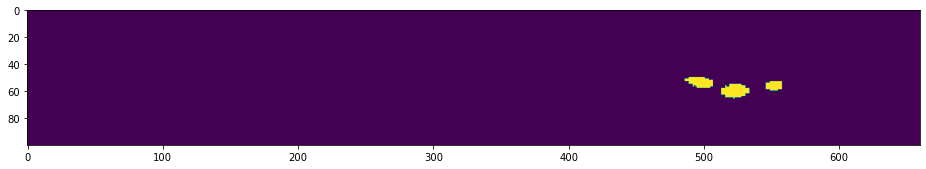

In [29]:
plt.imshow(frames[0].reshape(100,-1))

In [30]:
f_waves = np.array(f_waves)
sp_sum = np.array(sp_sum)
sp_port = np.array(sp_port)

In [31]:
bins10 = [50, 100]
labels = np.digitize(theta_percentile, bins10, right=True)

In [32]:
f_labels = f_waves > np.percentile(f_waves, 50)
sp_sum_labels = sp_sum > np.percentile(sp_sum, 50)
sp_port_labels = sp_port > np.percentile(sp_port, 50)

In [33]:
params = {'t_shift': [20], 'plex': [50]}

In [36]:
frames = np.nan_to_num(frames)

In [37]:
pca = sklearn.decomposition.PCA(n_components=5)
pca.fit(frames)

PCA(n_components=5)

In [38]:
np.sum(pca.explained_variance_ratio_)

0.5114469063210356

In [39]:
modes = pca.transform(frames).T

In [40]:
modes.shape

(5, 9300)

In [41]:
np.cumsum([0] + [s[1] - s[0] for s in segments_subset])

array([   0,  220,  414,  635,  828, 1043, 1251, 1462, 1654, 1858, 2069,
       2273, 2519, 2725, 2919, 3112, 3296, 3479, 3672, 3860, 4053, 4233,
       4420, 4596, 4784, 4982, 5164, 5369, 5551, 5742, 5914, 6094, 6276,
       6447, 6659, 6839, 7043, 7249, 7433, 7619, 7802, 7979, 8147, 8337,
       8505, 8676, 8857, 9037, 9300], dtype=int32)

In [42]:
X = craft_training_data(modes, segments_subset)
X_total = np.array(X)
#X_total = np.concatenate(X_total)

[   0  220  414  635  828 1043 1251 1462 1654 1858 2069 2273 2519 2725
 2919 3112 3296 3479 3672 3860 4053 4233 4420 4596 4784 4982 5164 5369
 5551 5742 5914 6094 6276 6447 6659 6839 7043 7249 7433 7619 7802 7979
 8147 8337 8505 8676 8857 9037 9300]
(5, 220)
1
(5, 194)
2
(5, 221)
3
(5, 193)
4
(5, 215)
5
(5, 208)
6
(5, 211)
7
(5, 192)
8
(5, 204)
9
(5, 211)
10
(5, 204)
11
(5, 246)
12
(5, 206)
13
(5, 194)
14
(5, 193)
15
(5, 184)
16
(5, 183)
17
(5, 193)
18
(5, 188)
19
(5, 193)
20
(5, 180)
21
(5, 187)
22
(5, 176)
23
(5, 188)
24
(5, 198)
25
(5, 182)
26
(5, 205)
27
(5, 182)
28
(5, 191)
29
(5, 172)
30
(5, 180)
31
(5, 182)
32
(5, 171)
33
(5, 212)
34
(5, 180)
35
(5, 204)
36
(5, 206)
37
(5, 184)
38
(5, 186)
39
(5, 183)
40
(5, 177)
41
(5, 168)
42
(5, 190)
43
(5, 168)
44
(5, 171)
45
(5, 181)
46
(5, 180)
47
(5, 263)
48
(5, 9300)
(5, 220)
1
(5, 194)
2
(5, 221)
3
(5, 193)
4
(5, 215)
5
(5, 208)
6
(5, 211)
7
(5, 192)
8
(5, 204)
9
(5, 211)
10
(5, 204)
11
(5, 246)
12
(5, 206)
13
(5, 194)
14
(5, 193)
15
(5

In [43]:
X_total.shape

(9300, 25)

In [44]:
norm_factor = np.sum(X_total, axis=1)
X_norm = X_total.T/norm_factor
X_norm = X_norm.T

In [45]:
def kl_dist(x, y):
    return np.sum(scipy.special.rel_entr(x, y))

In [46]:
X_norm.shape

(9300, 25)

In [47]:
X_embedded = TSNE(n_components=2, perplexity=200, verbose = 1, n_iter = 1000, n_jobs = -1, learning_rate=200, metric=kl_dist).fit_transform(X_norm)
X_embedded.shape

[t-SNE] Computing 601 nearest neighbors...
[t-SNE] Indexed 9300 samples in 0.368s...
[t-SNE] Computed neighbors for 9300 samples in 519.434s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9300
[t-SNE] Computed conditional probabilities for sample 2000 / 9300
[t-SNE] Computed conditional probabilities for sample 3000 / 9300
[t-SNE] Computed conditional probabilities for sample 4000 / 9300
[t-SNE] Computed conditional probabilities for sample 5000 / 9300
[t-SNE] Computed conditional probabilities for sample 6000 / 9300
[t-SNE] Computed conditional probabilities for sample 7000 / 9300
[t-SNE] Computed conditional probabilities for sample 8000 / 9300
[t-SNE] Computed conditional probabilities for sample 9000 / 9300
[t-SNE] Computed conditional probabilities for sample 9300 / 9300
[t-SNE] Mean sigma: 0.184858
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.795082
[t-SNE] KL divergence after 1000 iterations: 1.704058


(9300, 2)

In [717]:
X_embedded2 = TSNE(n_components=2, perplexity=200, verbose = 1, n_iter = 3000, n_jobs = -1, learning_rate=100, metric=kl_dist).fit_transform(X_norm)
X_embedded2.shape

[t-SNE] Computing 601 nearest neighbors...
[t-SNE] Indexed 9300 samples in 0.331s...
[t-SNE] Computed neighbors for 9300 samples in 479.036s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9300
[t-SNE] Computed conditional probabilities for sample 2000 / 9300
[t-SNE] Computed conditional probabilities for sample 3000 / 9300
[t-SNE] Computed conditional probabilities for sample 4000 / 9300
[t-SNE] Computed conditional probabilities for sample 5000 / 9300
[t-SNE] Computed conditional probabilities for sample 6000 / 9300
[t-SNE] Computed conditional probabilities for sample 7000 / 9300
[t-SNE] Computed conditional probabilities for sample 8000 / 9300
[t-SNE] Computed conditional probabilities for sample 9000 / 9300
[t-SNE] Computed conditional probabilities for sample 9300 / 9300
[t-SNE] Mean sigma: 0.164071
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.631264
[t-SNE] KL divergence after 3000 iterations: 1.697976


(9300, 2)

In [48]:
def filter_embedding(embedding, labels, target_label):
    y = (labels == target_label)*1
    class_embedding = embedding[y==1]
    
    assert np.sum(y) == len(class_embedding)
    
    
    # Embedding
    fig, axs = plt.subplots(1, 2, constrained_layout = True)
    axs[0].scatter(class_embedding[:, 0], class_embedding[:, 1], s = 10)
    axs[0].set_title('t-SNE Embedding of {}_{} Label Percentile'.format(target_label*50, target_label*50 + 50))
    
    # Kernel Density Estimation
    kde = KernelDensity(kernel='gaussian', bandwidth=2.5).fit(class_embedding)

    xmin = np.min(X_embedded[:,0])
    xmax = np.max(X_embedded[:,0])
    ymin = np.min(X_embedded[:,1])
    ymax = np.max(X_embedded[:,1])
    x = np.linspace(xmin, xmax, 100)
    y = np.linspace(ymin, ymax, 100)
    xx, yy  = np.meshgrid(x, y)

    grid = np.c_[np.ravel(xx), np.ravel(yy)]

    z = np.exp(kde.score_samples(grid))
    z = z.reshape(xx.shape)
    
    axs[1].contourf(xx, yy, z, cmap='magma')
    axs[1].set_title("Gaussian Kernel Density Estimation")
    
    #plt.savefig('data/results/week_9/class_embedding_{}_percentile.png'.format(target_label*10))
    plt.show()

In [49]:
trial_indices = np.cumsum([0] + [seg[1] - seg[0] for seg in segments_subset])
trial_indices

array([   0,  220,  414,  635,  828, 1043, 1251, 1462, 1654, 1858, 2069,
       2273, 2519, 2725, 2919, 3112, 3296, 3479, 3672, 3860, 4053, 4233,
       4420, 4596, 4784, 4982, 5164, 5369, 5551, 5742, 5914, 6094, 6276,
       6447, 6659, 6839, 7043, 7249, 7433, 7619, 7802, 7979, 8147, 8337,
       8505, 8676, 8857, 9037, 9300], dtype=int32)

In [50]:
segment_edges = []
edge_labels = []
for i in range(len(trial_indices)-1):
    s, e = trial_indices[i], trial_indices[i+1]
    a, b = trimmed_indices[i]
    
    segment_edges += list(X_embedded[s:s+a])
    edge_labels += list(labels[s:s+a])
    segment_edges += list(X_embedded[e+b:e])
    edge_labels += list(labels[e+b:e])
segment_edges = np.array(segment_edges)
edge_labels = np.array(edge_labels)

In [51]:
segment_edges.shape

(694, 2)

(-40.78391647338867, 45.091060638427734)

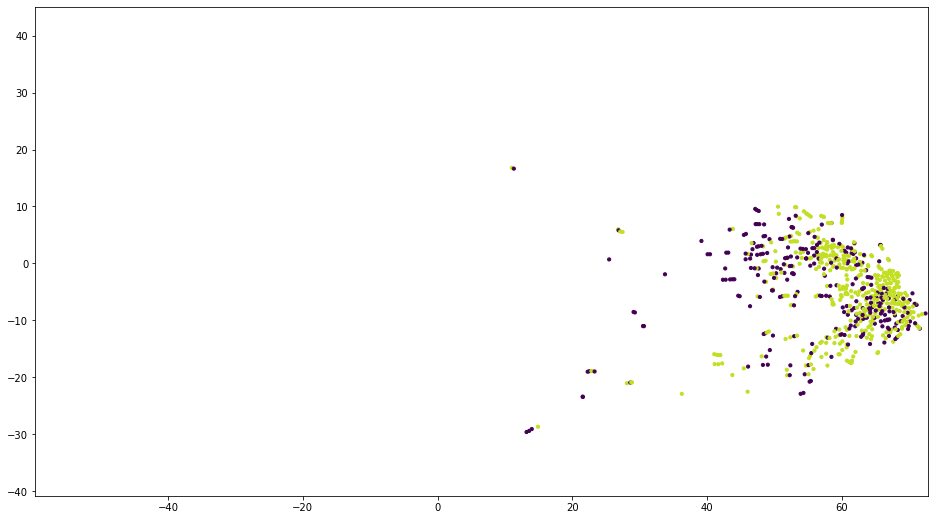

In [52]:
xmin = np.min(X_embedded[:,0])
xmax = np.max(X_embedded[:,0])
ymin = np.min(X_embedded[:,1])
ymax = np.max(X_embedded[:,1])

plt.scatter(segment_edges[:, 0], segment_edges[:, 1], s=10, color=cm.viridis(edge_labels/1.1))
plt.xlim(xmin, xmax)
plt.ylim(ymin, ymax)

In [53]:
edge_mask = np.zeros(len(X_embedded))
for i in range(len(X_embedded)):
    if(X_embedded[:, 0][i] in set(list(segment_edges[:, 0]))):
        edge_mask[i] = 1
edge_mask = edge_mask == 0

- Ratio of gde plots
- Use softmax outputs instead of class labels for plots
- Threshold the video so only LED are visible for DEG
- Important Parts of Code base
    - Alignment Stuff (Indices and stuff)
    - DeepEthogram

In [54]:
pred_cluster = []
for fr in frame_num:
    if(fr in set(predictive_cluster)):
        pred_cluster += [0.99]
    else:
        pred_cluster += [0.001]
        
pred_cluster += np.array(pred_cluster)

In [55]:
pred_cluster

array([0.002, 0.002, 0.002, ..., 0.002, 0.002, 0.002])

# Embedding Including Poke-in Poke-out

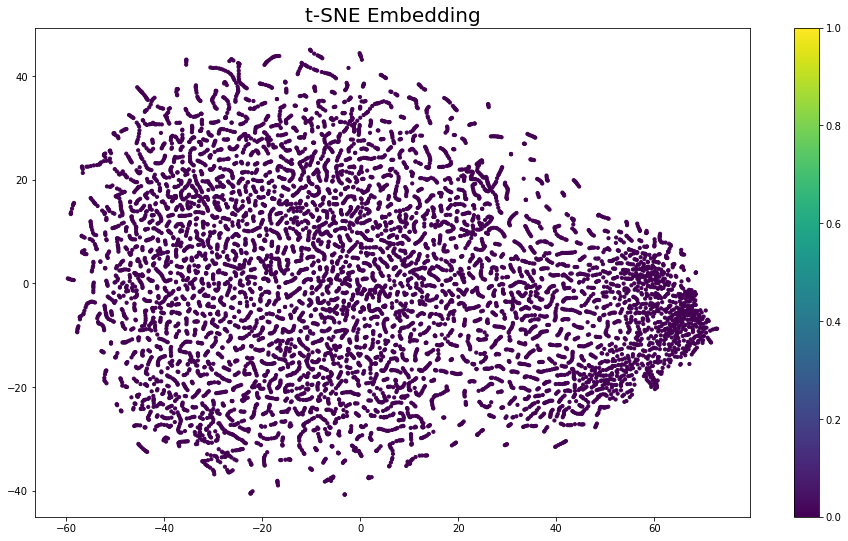

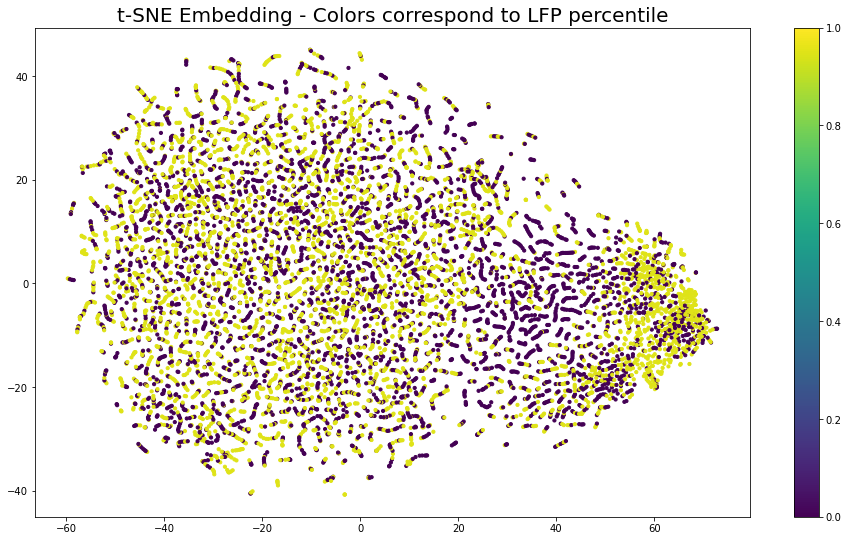

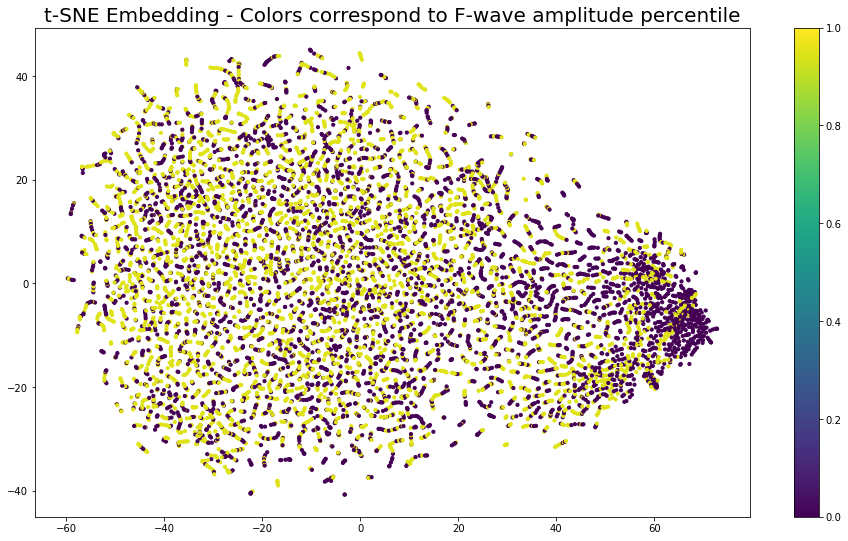

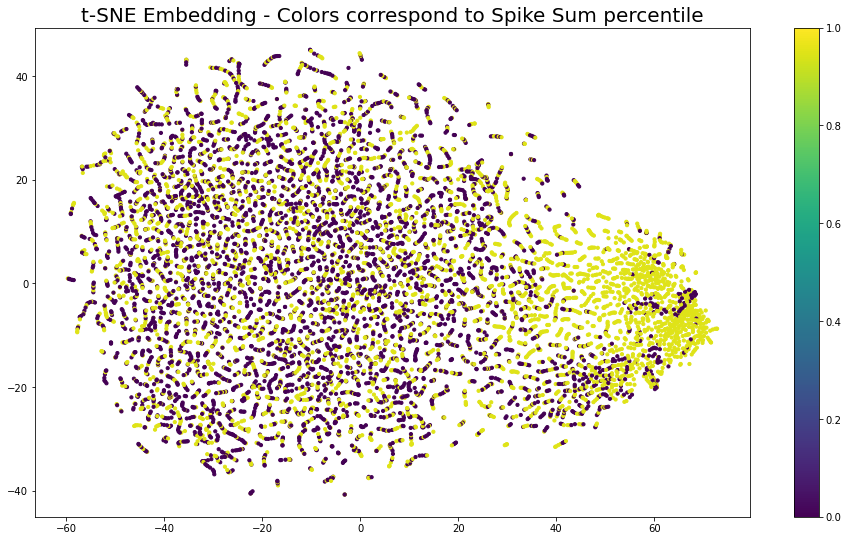

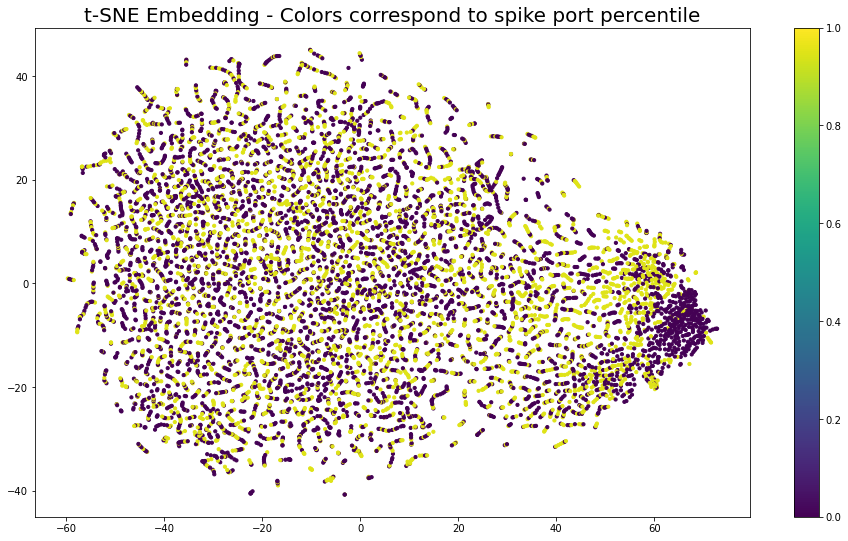

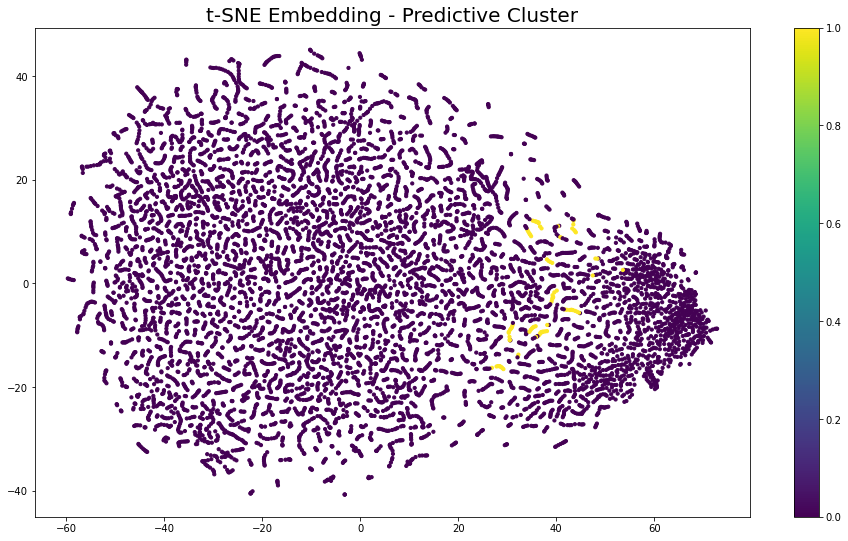

In [59]:
xmin = np.min(X_embedded[:,0])
xmax = np.max(X_embedded[:,0])
ymin = np.min(X_embedded[:,1])
ymax = np.max(X_embedded[:,1])

label_set = [np.zeros(labels.shape), labels, f_labels, sp_sum_labels, sp_port_labels, pred_cluster]

titles = [
    't-SNE Embedding',
    't-SNE Embedding - Colors correspond to LFP percentile',
    't-SNE Embedding - Colors correspond to F-wave amplitude percentile',
    't-SNE Embedding - Colors correspond to Spike Sum percentile',
    't-SNE Embedding - Colors correspond to spike port percentile',
    't-SNE Embedding - Predictive Cluster'
]

for i in range(6):
    plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 10, color = cm.viridis(label_set[i]/1.05))
    plt.title(titles[i], fontsize=20)
    plt.colorbar()
    plt.show()
    
    #for j in range(2):
    #    filter_embedding(X_embedded, label_set[i], j)
        
    print('\n')

# Embedding Trimmed

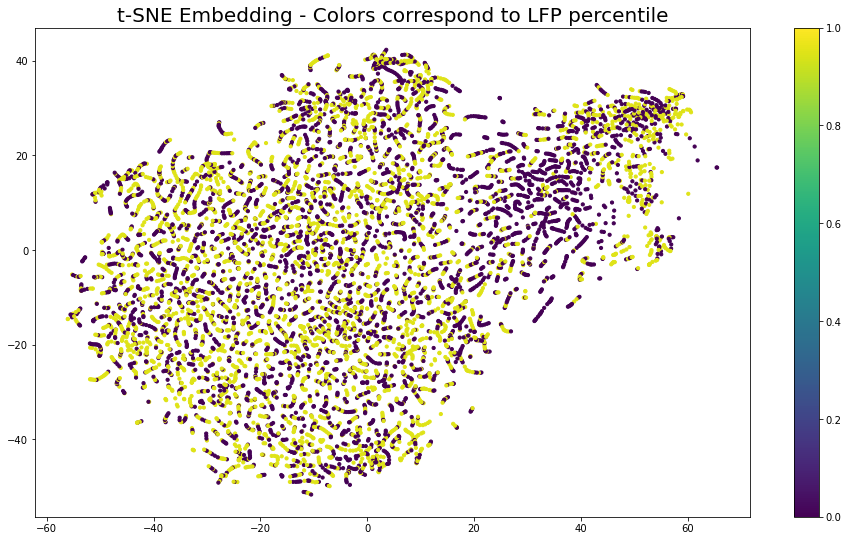

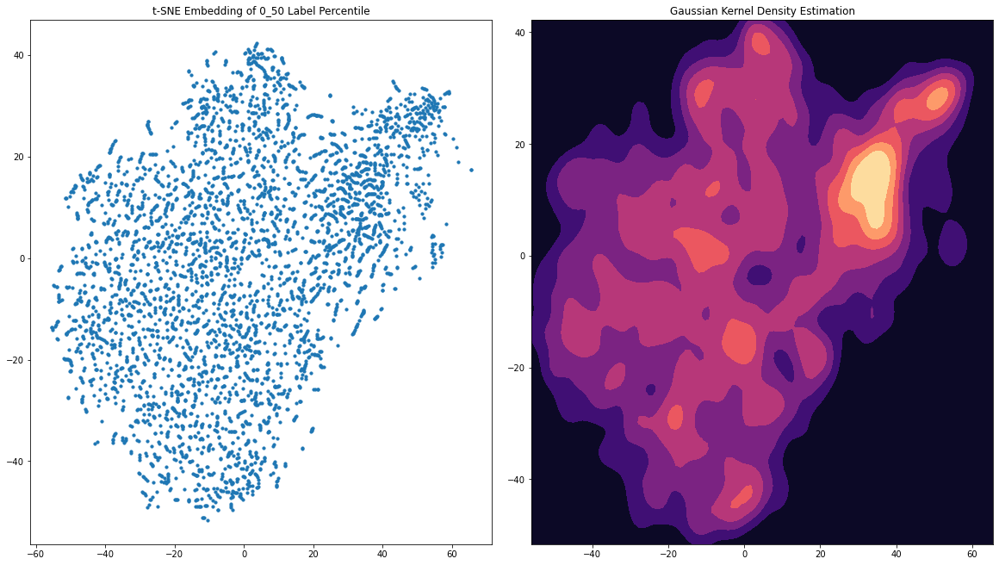

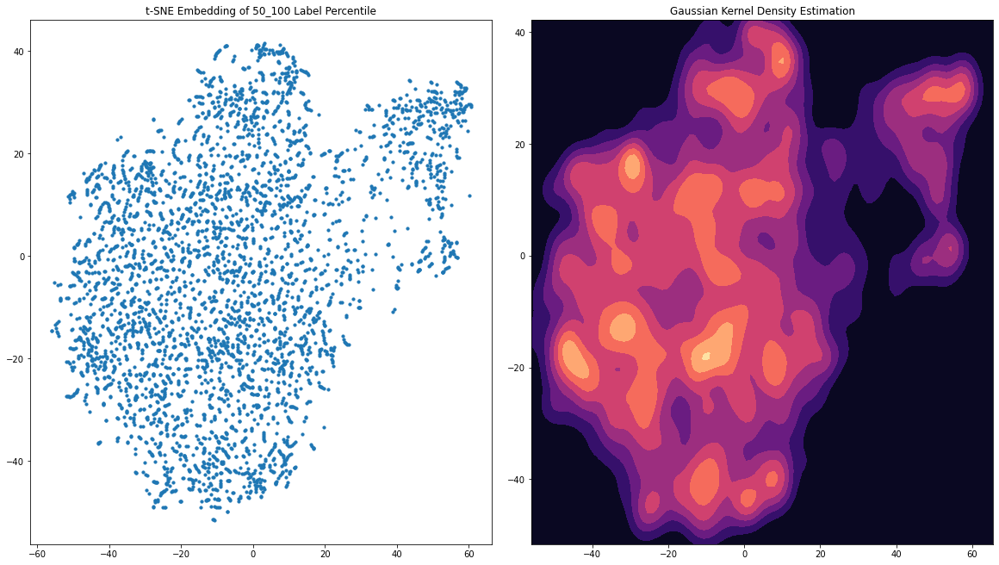

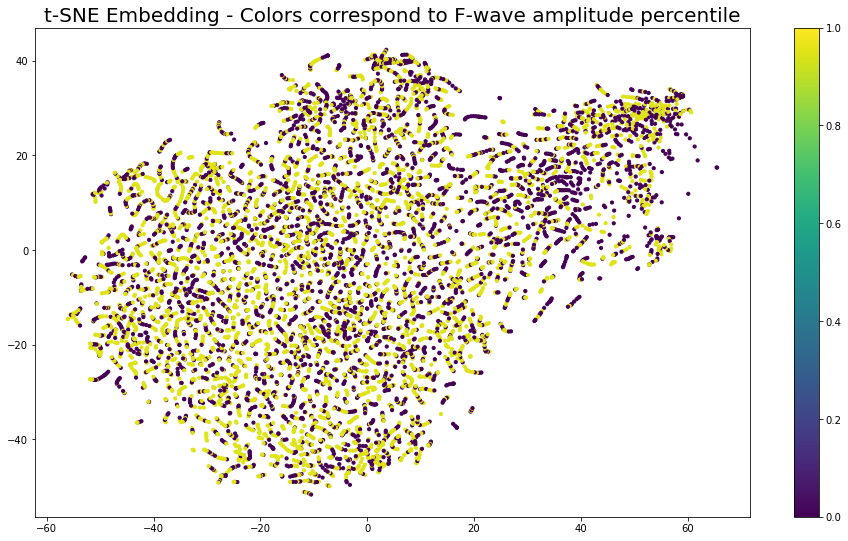

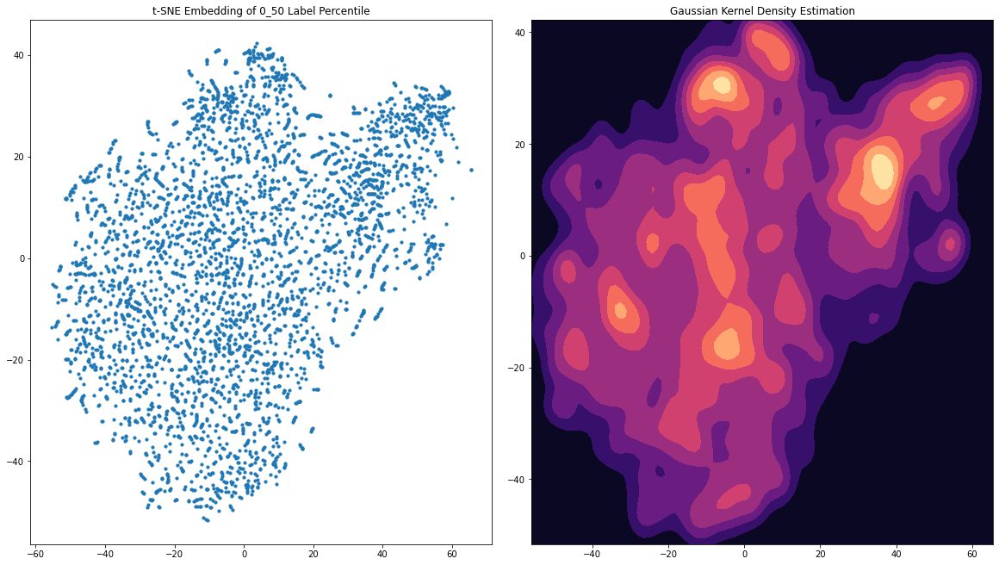

...

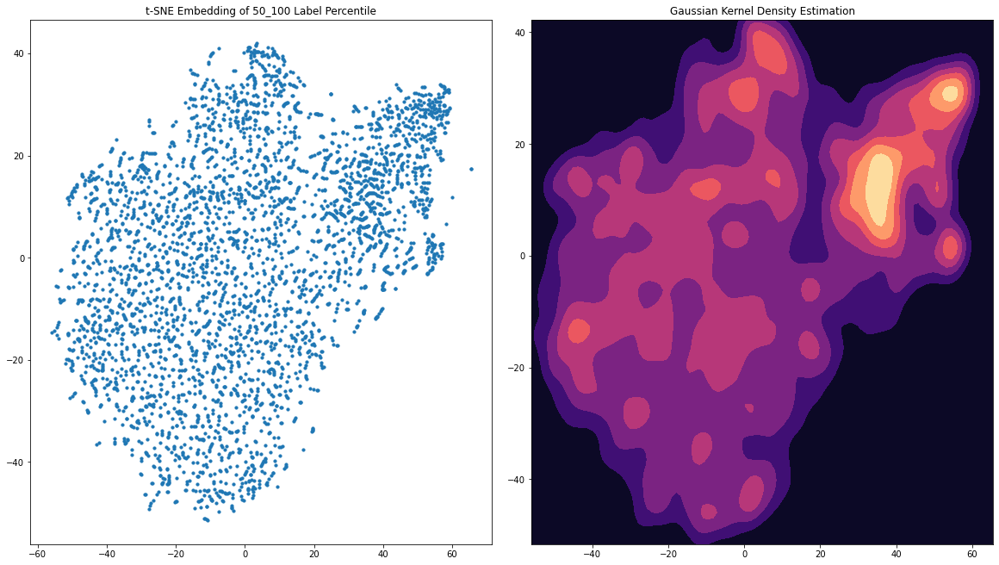

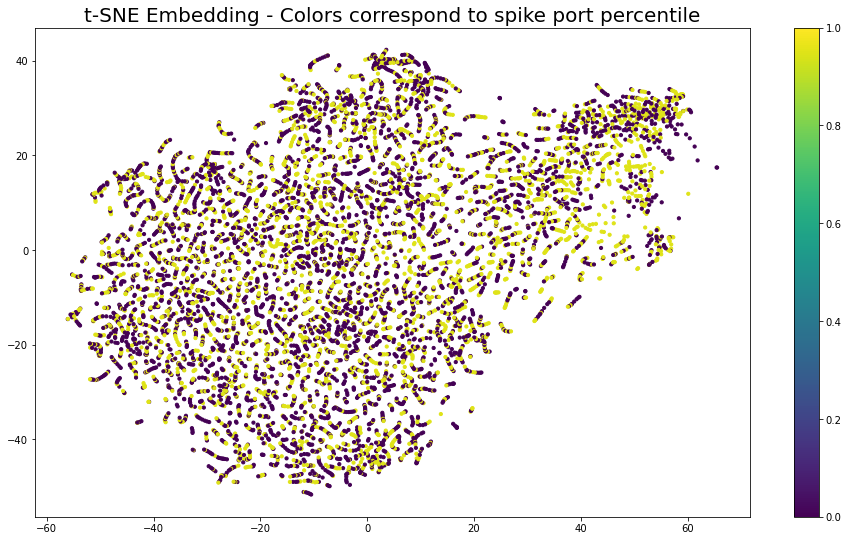

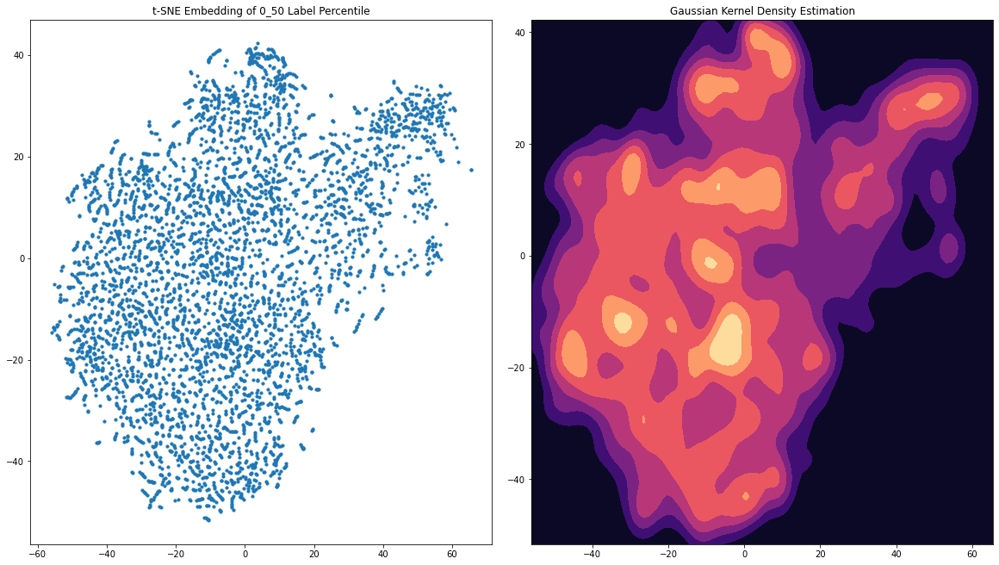

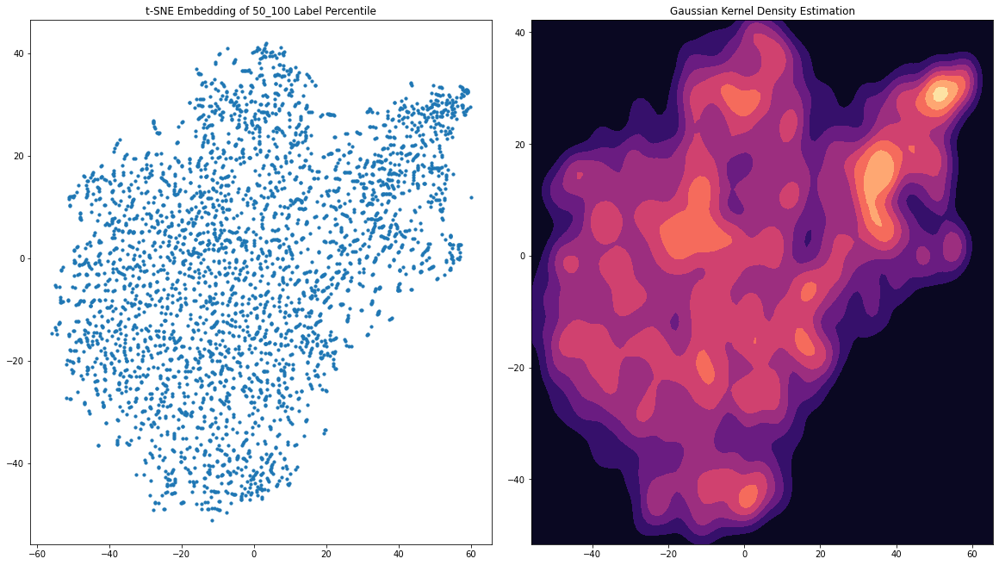

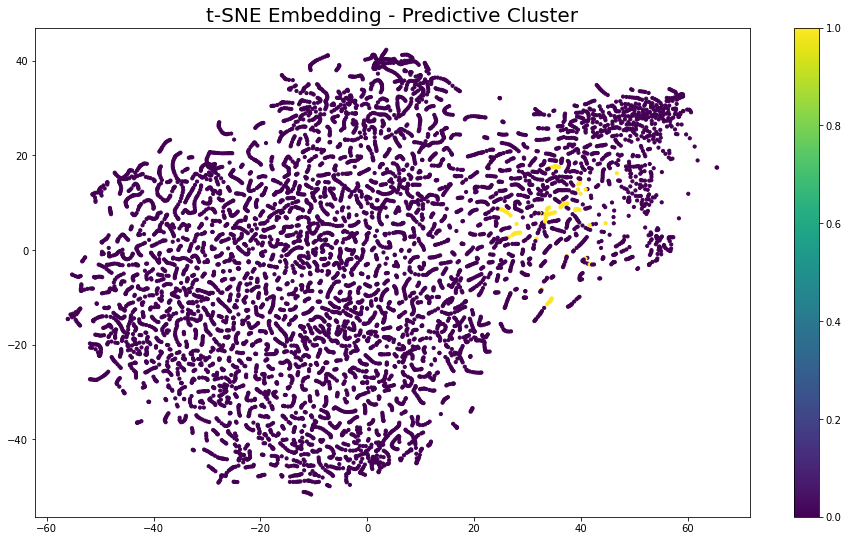

ValueError: Found array with 0 sample(s) (shape=(0, 2)) while a minimum of 1 is required.

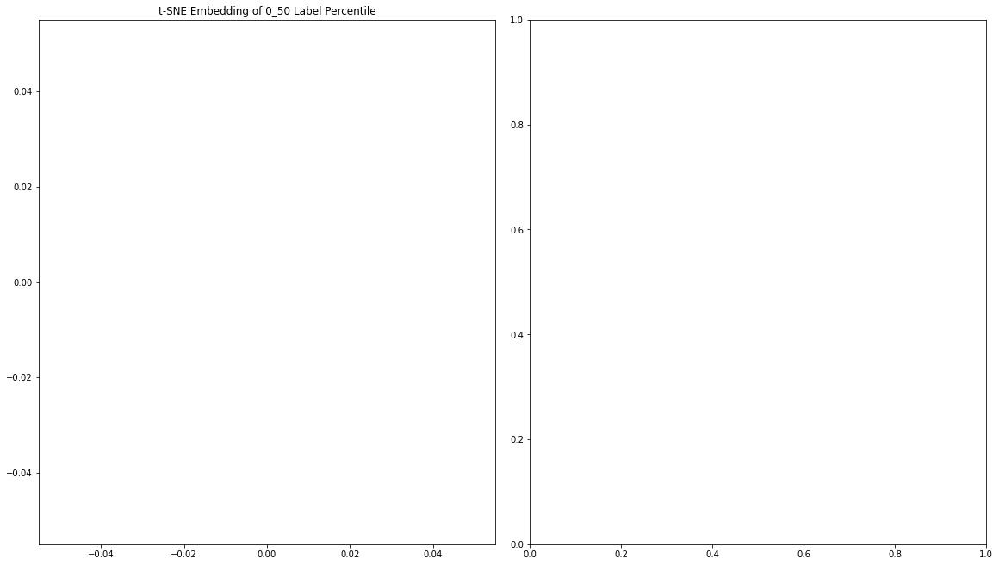

In [77]:
xmin = np.min(X_embedded[:,0])
xmax = np.max(X_embedded[:,0])
ymin = np.min(X_embedded[:,1])
ymax = np.max(X_embedded[:,1])

label_set = [labels, f_labels, sp_sum_labels, sp_port_labels, pred_cluster]

titles = [
    't-SNE Embedding - Colors correspond to LFP percentile',
    't-SNE Embedding - Colors correspond to F-wave amplitude percentile',
    't-SNE Embedding - Colors correspond to Spike Sum percentile',
    't-SNE Embedding - Colors correspond to spike port percentile',
    't-SNE Embedding - Predictive Cluster'
]

for i in range(5):
    plt.scatter(X_embedded[:, 0][edge_mask], X_embedded[:, 1][edge_mask], s= 10, color = cm.viridis(label_set[i][edge_mask]/1.05))
    plt.title(titles[i], fontsize=20)
    plt.colorbar()
    plt.show()
    
    for j in range(2):
        filter_embedding(X_embedded[edge_mask], label_set[i][edge_mask], j)
    print('\n')

# Embedding 2

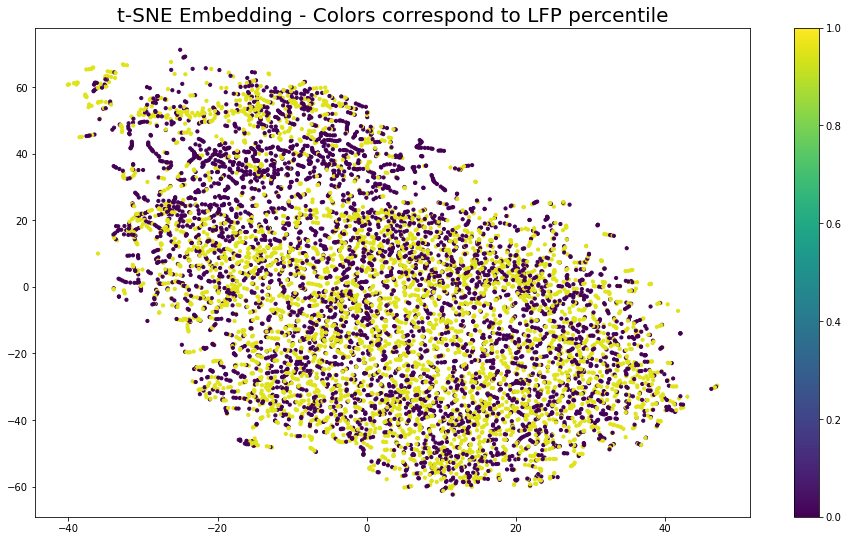

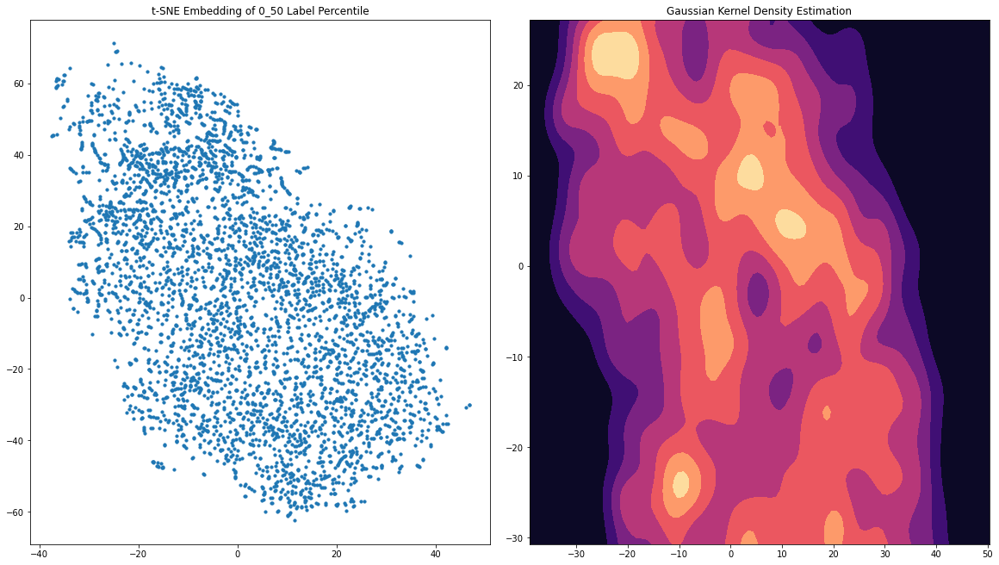

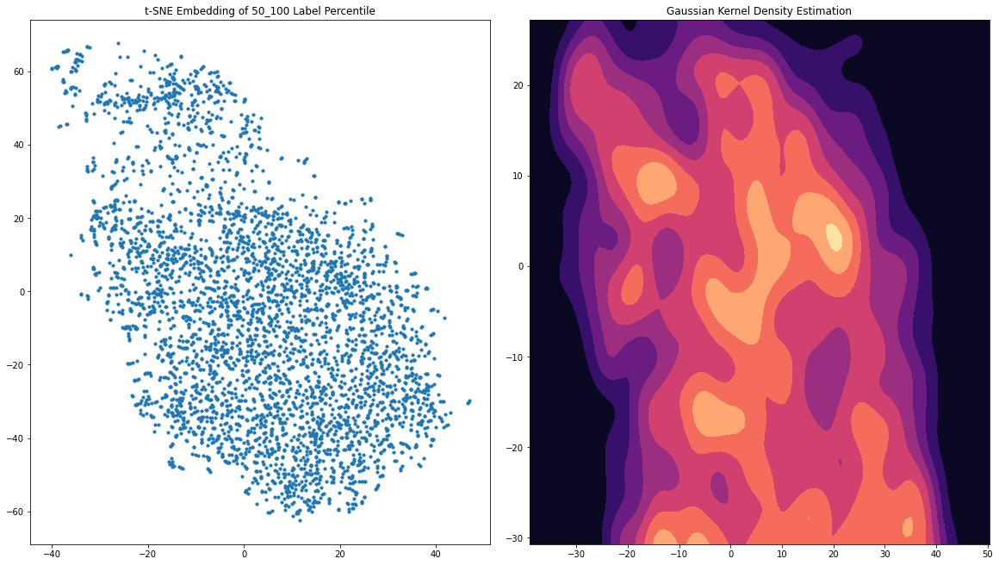

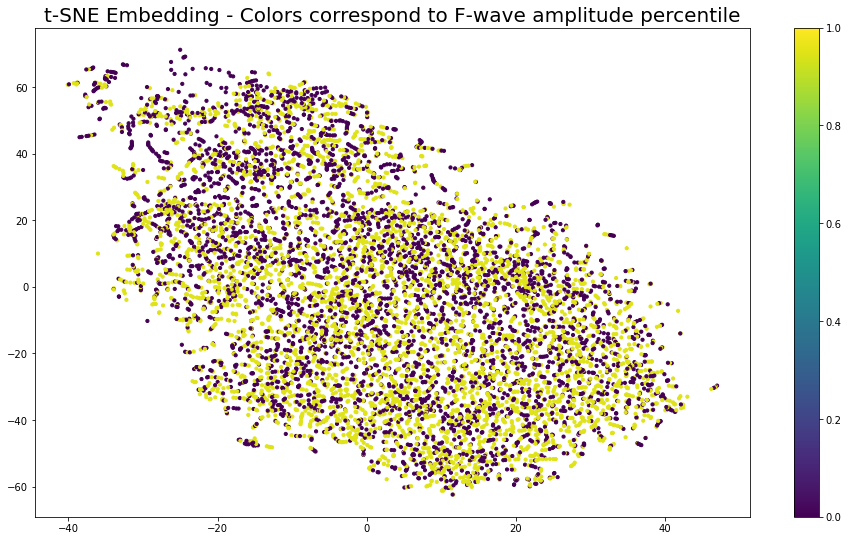

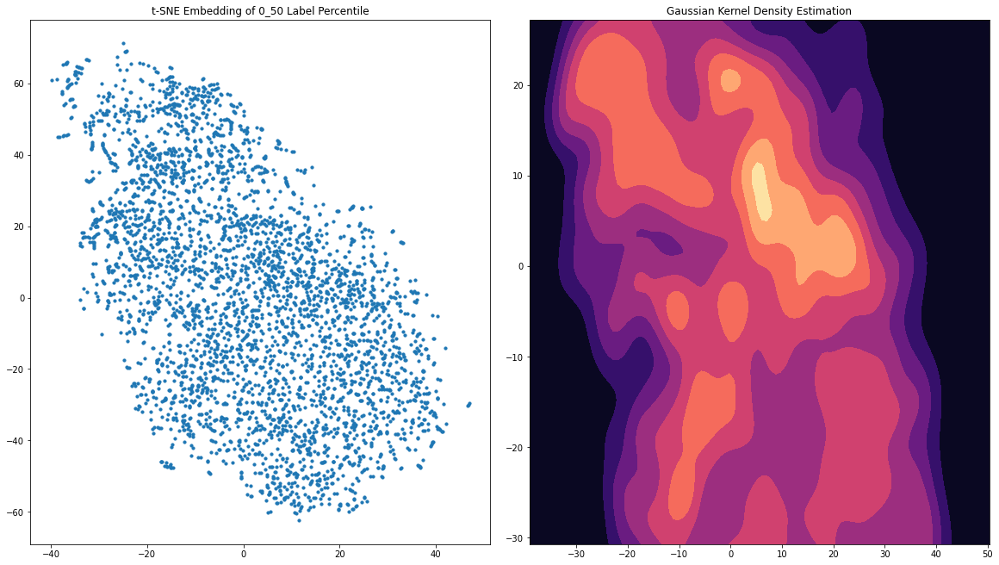

...

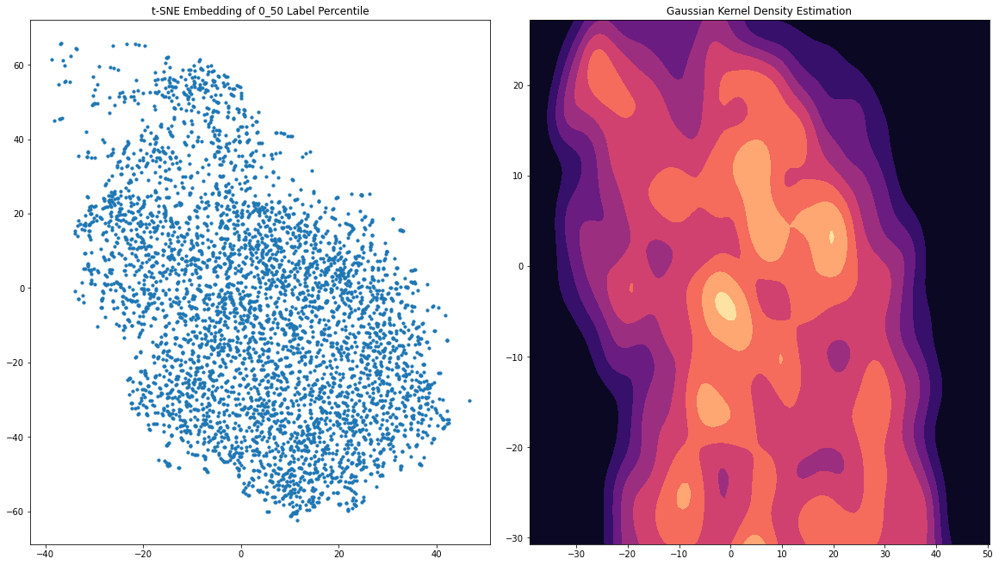

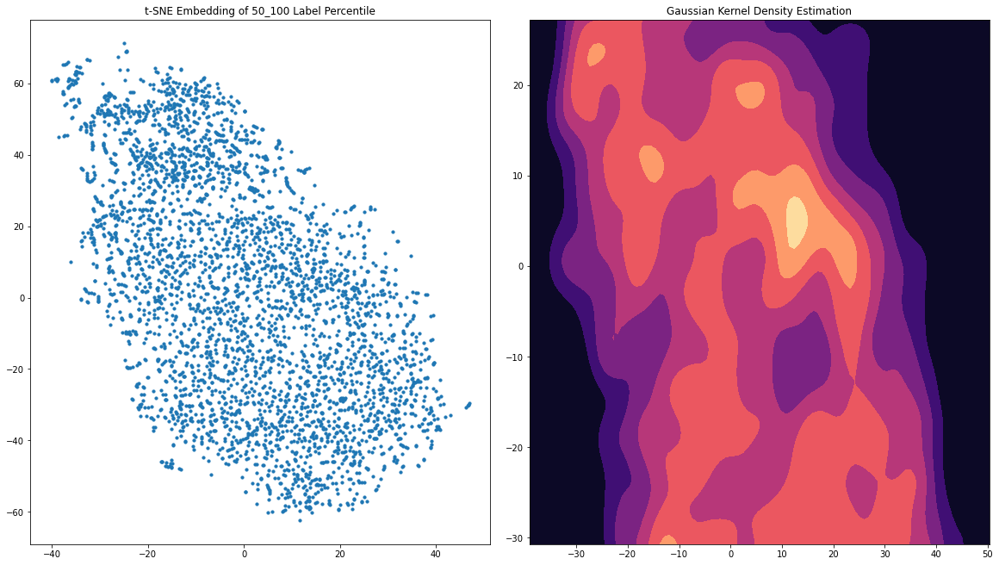

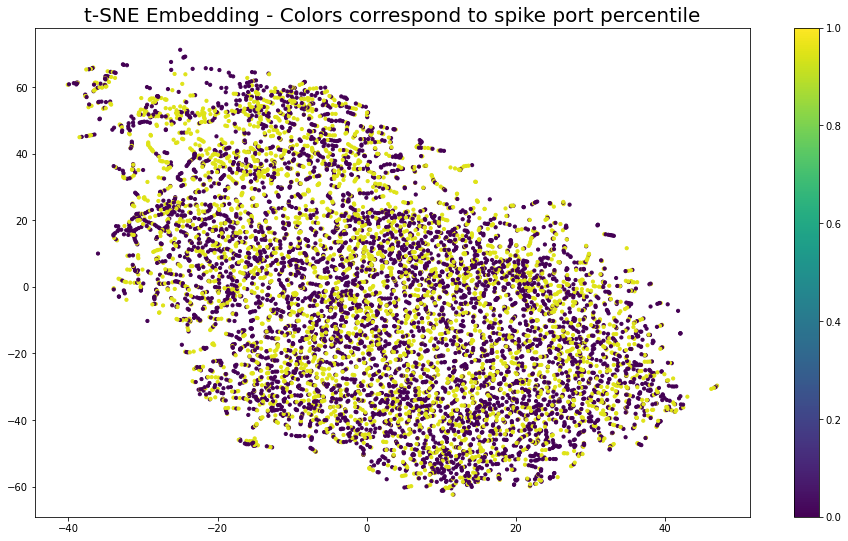

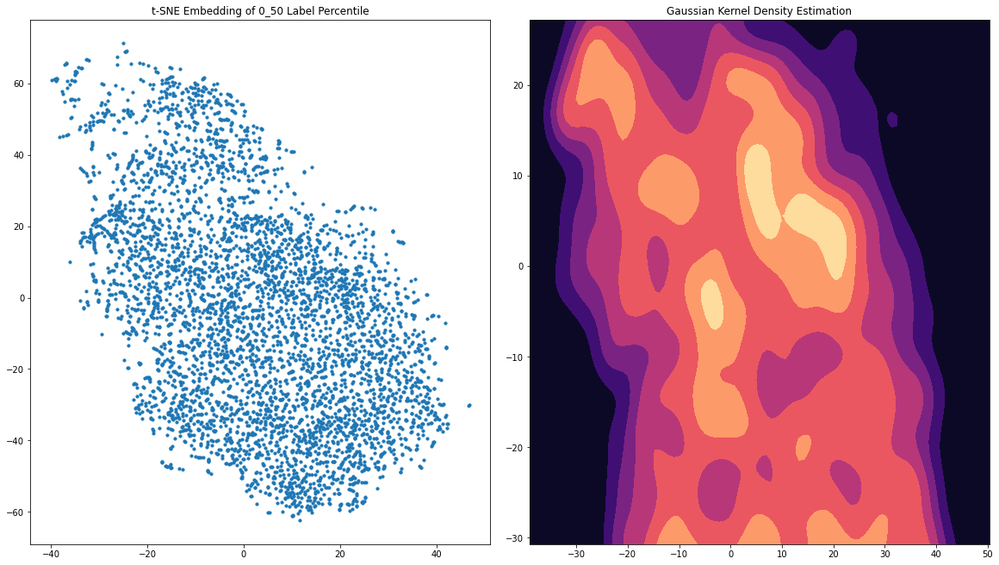

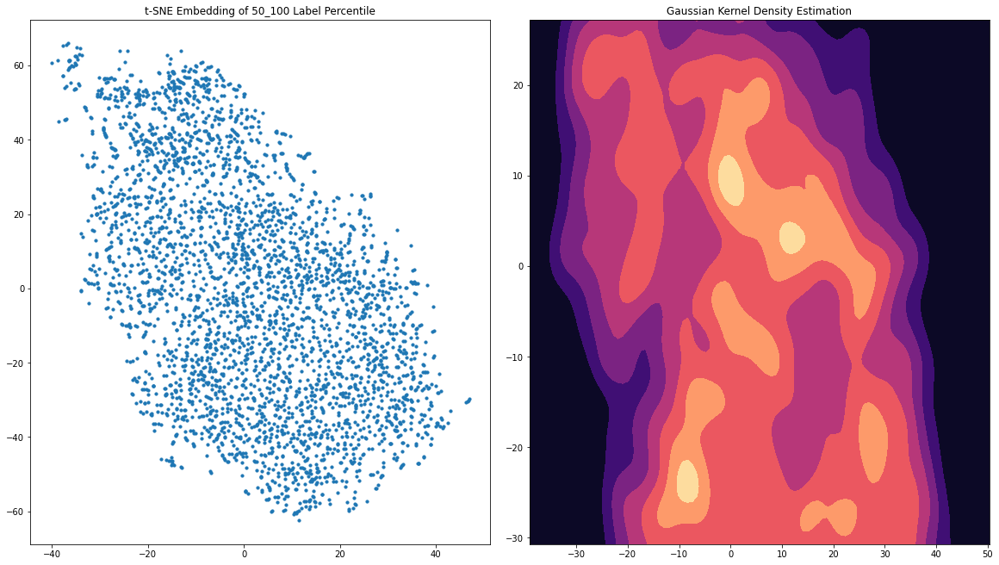

In [718]:
xmin = np.min(X_embedded2[:,0])
xmax = np.max(X_embedded2[:,0])
ymin = np.min(X_embedded2[:,1])
ymax = np.max(X_embedded2[:,1])

label_set = [labels, f_labels, sp_sum_labels, sp_port_labels]

titles = [
    't-SNE Embedding - Colors correspond to LFP percentile',
    't-SNE Embedding - Colors correspond to F-wave amplitude percentile',
    't-SNE Embedding - Colors correspond to Spike Sum percentile',
    't-SNE Embedding - Colors correspond to spike port percentile'
]

for i in range(4):
    plt.scatter(X_embedded2[:, 0][edge_mask], X_embedded2[:, 1][edge_mask], s= 10, color = cm.viridis(label_set[i][edge_mask]/1.05))
    plt.title(titles[i], fontsize=20)
    plt.colorbar()
    plt.show()
    
    for j in range(2):
        filter_embedding(X_embedded2[edge_mask], label_set[i][edge_mask], j)
    print('\n')

# Gaussian Kernel Density Estimation

In [208]:
xmin = np.min(X_embedded[:,0])
xmax = np.max(X_embedded[:,0])
ymin = np.min(X_embedded[:,1])
ymax = np.max(X_embedded[:,1])

In [209]:
xmin, xmax, ymin, ymax

(-50.859623, 62.910896, -29.263632, 27.908667)

In [210]:
X_embedded.shape

(9972, 2)

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:14: UserWarning: The following kwargs were not used by contour: 'aspect'
  


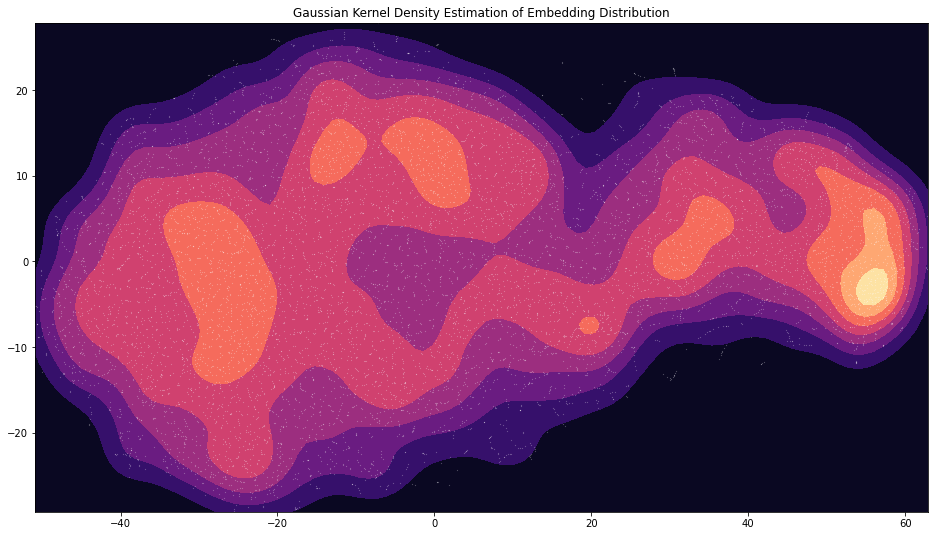

In [281]:
from sklearn.neighbors import KernelDensity

kde = KernelDensity(kernel='gaussian', bandwidth=2.5).fit(X_embedded)

x = np.linspace(xmin, xmax, 100)
y = np.linspace(ymin, ymax, 100)
xx, yy  = np.meshgrid(x, y)

grid = np.c_[np.ravel(xx), np.ravel(yy)]

z = np.exp(kde.score_samples(grid))
z = z.reshape(xx.shape)

plt.contourf(xx, yy, z, aspect='auto', cmap='magma')
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s=0.01, color='white')
plt.title("Gaussian Kernel Density Estimation of Embedding Distribution")
plt.show()

# Watershed

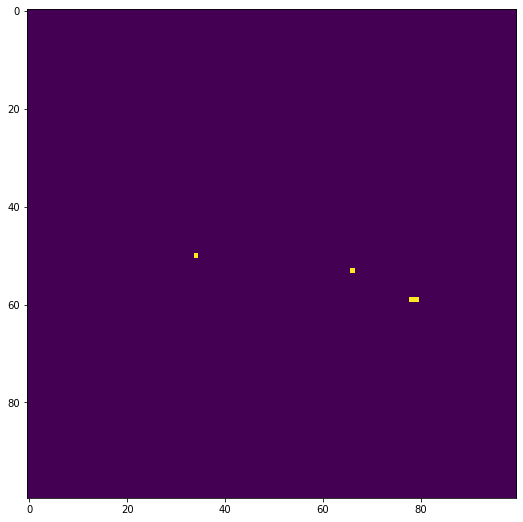

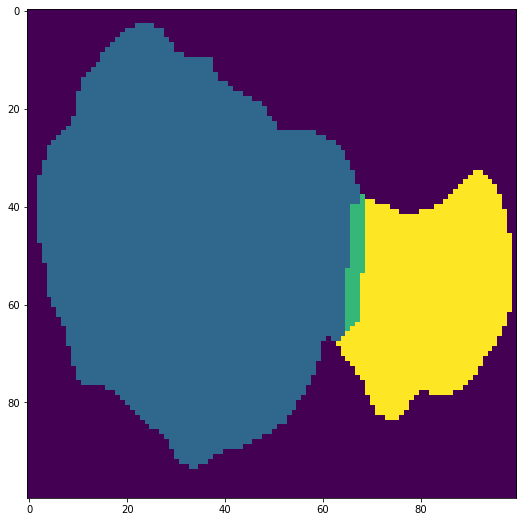

In [295]:
z_scaled = 255*z / np.max(z)
z_scaled = z_scaled.astype(np.uint8)

thresh = cv2.threshold(z_scaled, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

distance_map = scipy.ndimage.distance_transform_edt(thresh)

local_max = skimage.feature.peak_local_max(distance_map, indices=False, min_distance=2, labels=thresh)
plt.imshow(local_max)
plt.show()

markers = scipy.ndimage.label(local_max, structure=np.ones((3, 3)))[0]

from skimage.segmentation import watershed
regions = watershed(-distance_map, markers, mask=thresh)
plt.imshow(regions)
plt.show()

In [283]:
np.unique(regions)

array([0, 1, 2, 3])

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:1: UserWarning: The following kwargs were not used by contour: 'aspect'
  """Entry point for launching an IPython kernel.


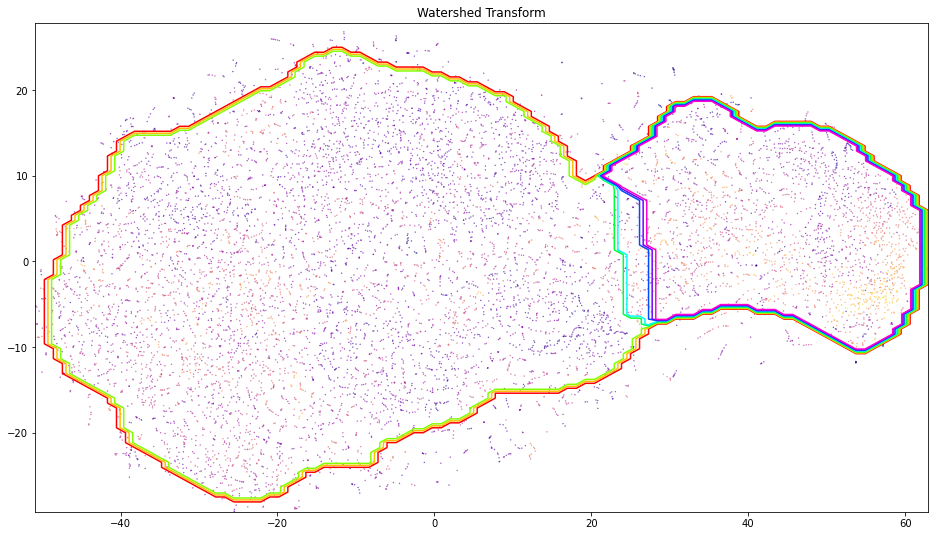

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:5: UserWarning: The following kwargs were not used by contour: 'aspect'
  """


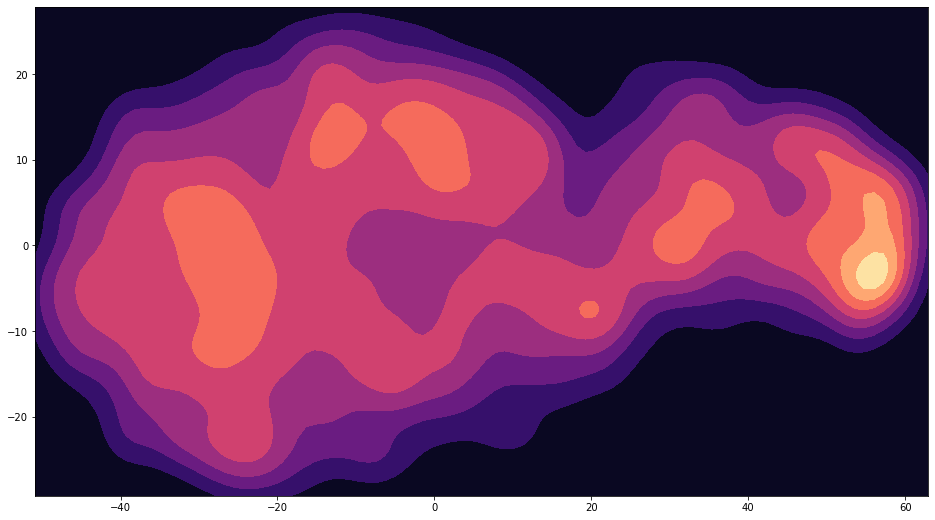

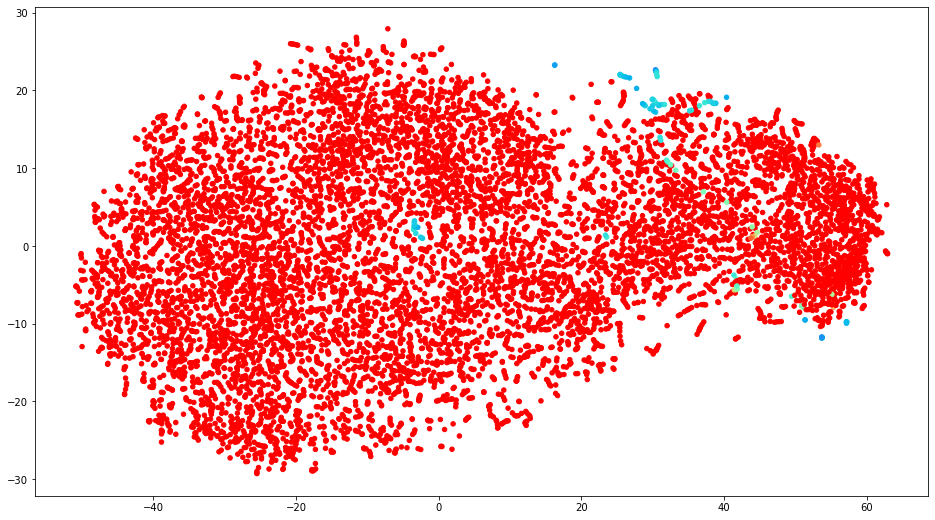

In [296]:
plt.contour(xx, yy, regions, aspect='auto', cmap = 'hsv')
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s=0.1, color = cm.plasma(norm_factor/np.max(norm_factor)))
plt.title("Watershed Transform")
plt.show()
plt.contourf(xx, yy, z, aspect='auto', cmap='magma')
plt.show()
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s=20, color = cm.rainbow(norm_factor))
plt.show()

In [299]:
labels

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [391]:
from matplotlib.backends.backend_agg import FigureCanvasAgg

trial_indices = np.cumsum([0] + [seg[1] - seg[0] for seg in segments])
i = 1
s, e = trial_indices[i], trial_indices[i+1]
print(segments[i])
print(s, e)

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('data/results/week_9/sample.avi',fourcc, 3, (2640, 2800))

for j in range(e-s):
    fig = plt.Figure(figsize=(16, 9), dpi=200)
    canvas = FigureCanvasAgg(fig)
    
    ax = fig.gca()
    
    #print(X_embedded[s:e, 0][j])
    im = ax.scatter(X_embedded[s:e, 0][j], X_embedded[s:e, 1][j], s= 100, color = cm.viridis(labels[s:e][j]/10))
    #ax.colorbar()
    ax.contour(xx, yy, regions, aspect='auto', cmap = 'hsv')
    ax.scatter([40]*80, np.arange(-40, 40),s=0.1, marker='o')
    ax.set_title('t-SNE Embedding of Single Trial - Colors correspond to theta percentile')
    fig.colorbar(im, ax=fig.get_axes())
    
    canvas.draw()
    string, (width, height) = canvas.print_to_buffer()
    
    plot_img = np.fromstring(string, dtype='uint8').reshape(height, width, 4)
    plot_img = cv2.cvtColor(plot_img, cv2.COLOR_BGRA2BGR)
    plot_img = plot_img[100:-100,180:-380,:] # trim empty space
    
    
    #plt.show()
    
    vid_folder = '{}_{}_{}'.format(*segments[i])
    vid_path = 'data/datasets/stationary_rat/videos/{}/{}/{}.jpg'.format(vid_folder, vid_folder, segments[i][0] + j)
    #print(vid_path)
    
    frame = cv2.imread(vid_path)
    frame = cv2.resize(frame, (220*12, 100*12))
    #print(plot_img.shape)
    #print(frame.shape)
    
    
    #plt.imshow(frame)
    #plt.show()
    #plt.imshow(plot_img)
    #plt.show()
    
    stacked = np.vstack([frame,plot_img])
    out.write(stacked)
    #plt.imshow(stacked)
    #plt.show()
    
out.release()
cv2.destroyAllWindows()

[1940 2160    9]
36 256


C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:21: UserWarning: The following kwargs were not used by contour: 'aspect'
C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


In [403]:
for i in range(len(segments)):
    print(i, segments[i])

0 [662 698   9]
1 [1940 2160    9]
2 [2604 2664    9]
3 [3378 3572    9]
4 [4382 4603    9]
5 [5131 5324    9]
6 [6030 6245    9]
7 [6593 6617    9]
8 [7583 7791    9]
9 [8598 8809    9]
10 [9371 9563    9]
11 [10369 10573     9]
12 [11386 11597     9]
13 [12445 12649     9]
14 [13195 13441     9]
15 [14106 14312     9]
16 [14827 15021     9]
17 [15745 15938     9]
18 [16526 16710     9]
19 [17606 17789     9]
20 [17875 17917     9]
21 [18830 19023     9]
22 [19705 19893     9]
23 [20678 20871     9]
24 [21698 21878     9]
25 [22414 22601     9]
26 [23467 23643     9]
27 [23653 23665     9]
28 [24282 24470     9]
29 [25259 25457     9]
30 [27014 27052     9]
31 [28531 28713     9]
32 [30095 30300     9]
33 [30851 30881     9]
34 [31828 32010     9]
35 [32066 32096     9]
36 [32693 32729     9]
37 [33452 33643     9]
38 [34208 34380     9]
39 [35103 35283     9]
40 [35937 36119     9]
41 [36810 36981     9]
42 [37506 37718     9]
43 [38348 38528     9]
44 [39393 39597     9]
45 [40065 4

In [404]:
from matplotlib.backends.backend_agg import FigureCanvasAgg

trial_indices = np.cumsum([0] + [seg[1] - seg[0] for seg in segments])
i = 59
s, e = trial_indices[i], trial_indices[i+1]
print(segments[i])
print(s, e)

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('data/results/week_9/stacked_{}_{}_{}.avi'.format(*segments[i]),fourcc, 3, (2640, 2800))

for j in range(e-s):
    fig = plt.Figure(figsize=(16, 9), dpi=200)
    canvas = FigureCanvasAgg(fig)
    
    ax = fig.gca()
    
    #print(X_embedded[s:e, 0][j])
    im = ax.scatter(X_embedded[s:e, 0][j], X_embedded[s:e, 1][j], s= 100, color = cm.viridis(labels[s:e][j]/10))
    #ax.colorbar()
    ax.contour(xx, yy, regions, aspect='auto', cmap = 'hsv')
    ax.scatter([40]*80, np.arange(-40, 40),s=0.1, marker='o')
    ax.set_title('t-SNE Embedding of Single Trial - Colors correspond to theta percentile')
    fig.colorbar(im, ax=fig.get_axes())
    
    canvas.draw()
    string, (width, height) = canvas.print_to_buffer()
    
    plot_img = np.fromstring(string, dtype='uint8').reshape(height, width, 4)
    plot_img = cv2.cvtColor(plot_img, cv2.COLOR_BGRA2BGR)
    plot_img = plot_img[100:-100,180:-380,:] # trim empty space
    
    
    #plt.show()
    
    vid_folder = '{}_{}_{}'.format(*segments[i])
    vid_path = 'data/datasets/stationary_rat/videos/{}/{}/{}.jpg'.format(vid_folder, vid_folder, segments[i][0] + j)
    #print(vid_path)
    
    frame = cv2.imread(vid_path)
    frame = cv2.resize(frame, (220*12, 100*12))
    #print(plot_img.shape)
    #print(frame.shape)
    
    
    #plt.imshow(frame)
    #plt.show()
    #plt.imshow(plot_img)
    #plt.show()
    
    stacked = np.vstack([frame,plot_img])
    out.write(stacked)
    #plt.imshow(stacked)
    #plt.show()
    
out.release()
cv2.destroyAllWindows()

[54680 54708     9]
9667 9695


C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:21: UserWarning: The following kwargs were not used by contour: 'aspect'
C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


In [314]:
trial_indices = np.cumsum([seg[1] - seg[0] for seg in trimmed_segments])
for i in range(len(trial_indices)-1)[:10]:
    print(segments[i+1])
    s, e = trial_indices[i], trial_indices[i+1]
    print(s, e)
    plt.scatter(X_embedded[s:e, 0], X_embedded[s:e, 1], s= 10, color = cm.cividis(np.linspace(0, 1, e-s)))
    plt.colorbar()
    plt.contour(xx, yy, labels, aspect='auto', cmap = 'hsv')
    plt.title('t-SNE Embedding of Single Trial - Colors correspond to time')
    plt.show()
    break

[1940 2160    9]
20 228


IndexError: index 208 is out of bounds for axis 0 with size 208

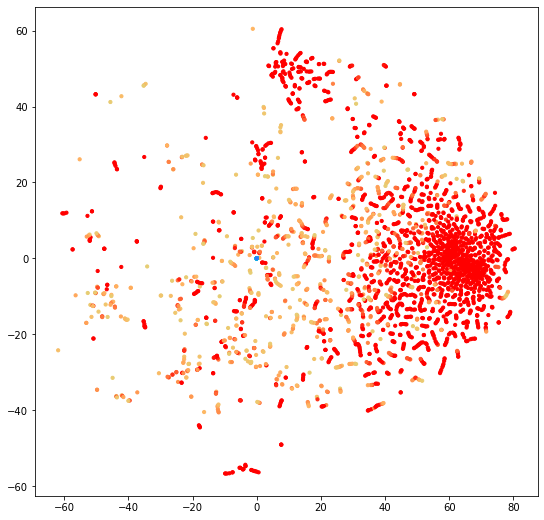

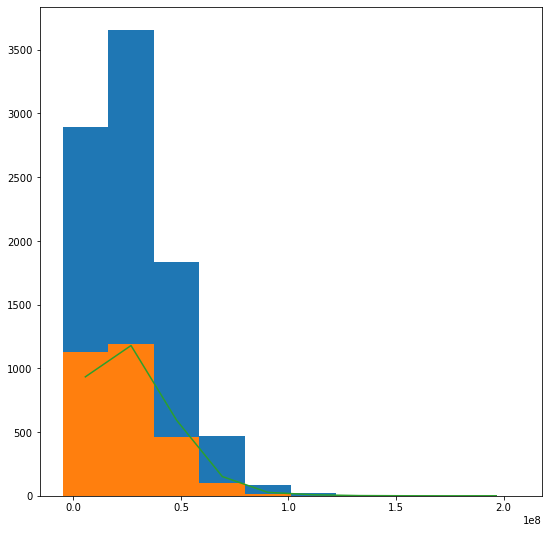

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


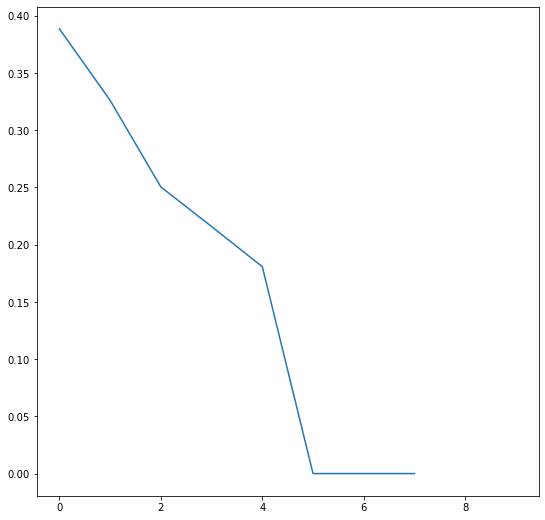

In [221]:
selection = np.array(norm_factor > 0.7)*1 # Select rows where norm_factor is larger than threshold
plt.scatter(selection *X_embedded[:, 0], selection *X_embedded[:, 1], s=10, color = cm.rainbow(norm_factor))
plt.show()

hist = plt.hist(theta_power)
bins = hist[1]
selected_labels = selection*theta_power
cluster_hist = plt.hist(selected_labels[selected_labels > 0], bins=bins)
plt.plot(bins[:-1] + (bins[1]-bins[0])/2, hist[0] * len(selected_labels[selected_labels > 0])/len(norm_factor))
plt.show()

plt.plot(cluster_hist[0]/hist[0])
plt.show()

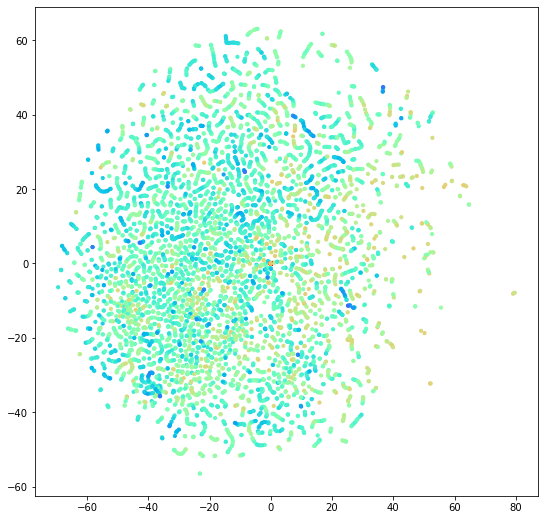

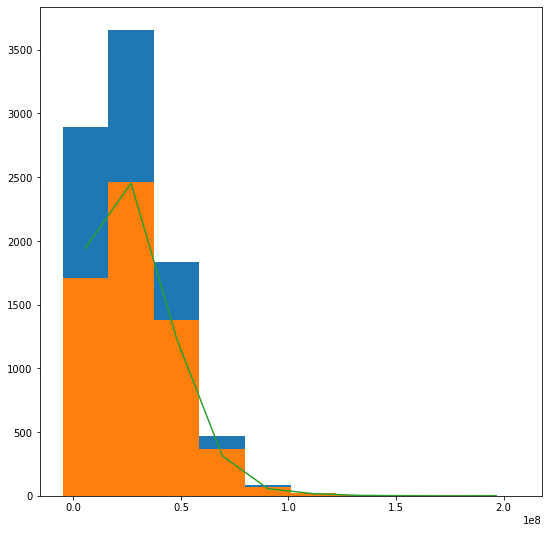

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


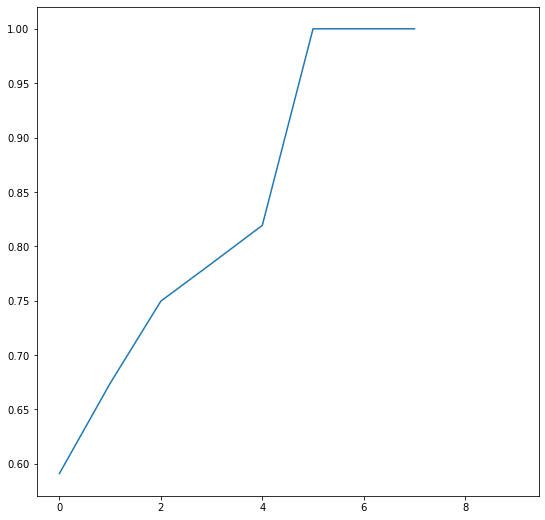

In [222]:
selection = np.array(norm_factor < 0.7)*1 # Select rows where norm_factor is larger than threshold
plt.scatter(selection *X_embedded[:, 0], selection *X_embedded[:, 1], s=10, color = cm.rainbow(norm_factor))
plt.show()

hist = plt.hist(theta_power)
bins = hist[1]
selected_labels = selection*theta_power
cluster_hist = plt.hist(selected_labels[selected_labels > 0], bins=bins)
plt.plot(bins[:-1] + (bins[1]-bins[0])/2, hist[0] * len(selected_labels[selected_labels > 0])/len(norm_factor))
plt.show()

plt.plot(cluster_hist[0]/hist[0])
plt.show()

# Head Oscillations

In [406]:
yMM = np.load(yMM_file)
v_y = np.diff(yMM)/(1526/152.7)

In [445]:
yMM_percentile = to_percentile(yMM, segments)

(0.7258054466684843, 0.0)

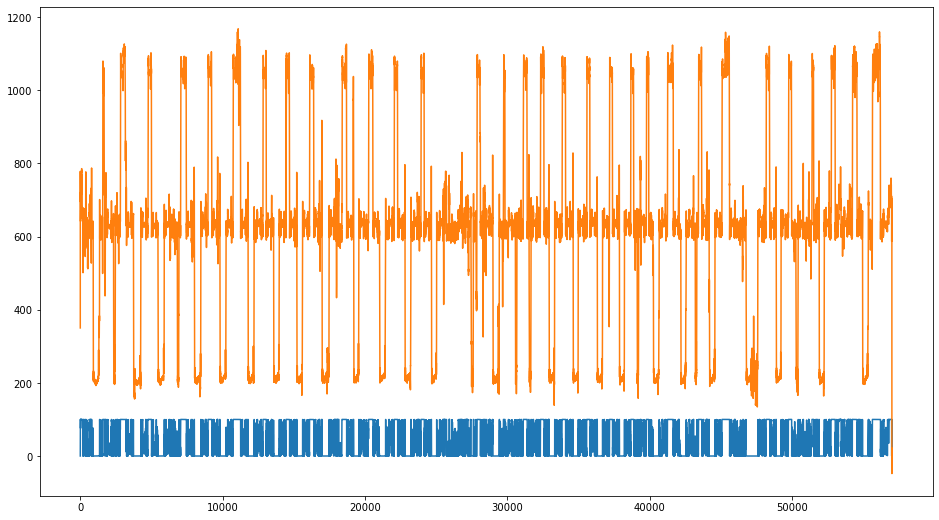

In [450]:
plt.plot(yMM_percentile)
plt.plot(yMM)
scipy.stats.pearsonr(yMM_percentile, yMM)

1940 2160
Correlation SpearmanrResult(correlation=0.10297412907870239, pvalue=0.14078294137069272)


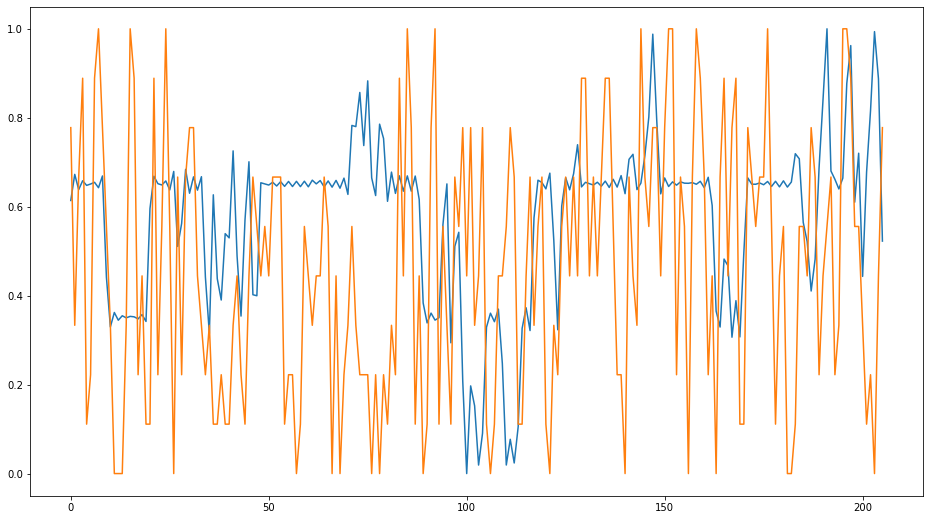

In [423]:
s, e, sect = segments[1]
print(s, e)

head_pos = yMM[s:e][9:-5]
head_pos = (head_pos - np.min(head_pos))/(np.max(head_pos) - np.min(head_pos))
theta_snippet = labels[s:e][9:-5]
theta_snippet = (theta_snippet - np.min(theta_snippet))/(np.max(theta_snippet) - np.min(theta_snippet))

plt.plot(head_pos)
plt.plot(theta_snippet)

print("Correlation", scipy.stats.spearmanr(head_pos, theta_snippet))

In [593]:
np.mean(scipy.stats.zscore(head_pos_total))

3.893384853480001e-17

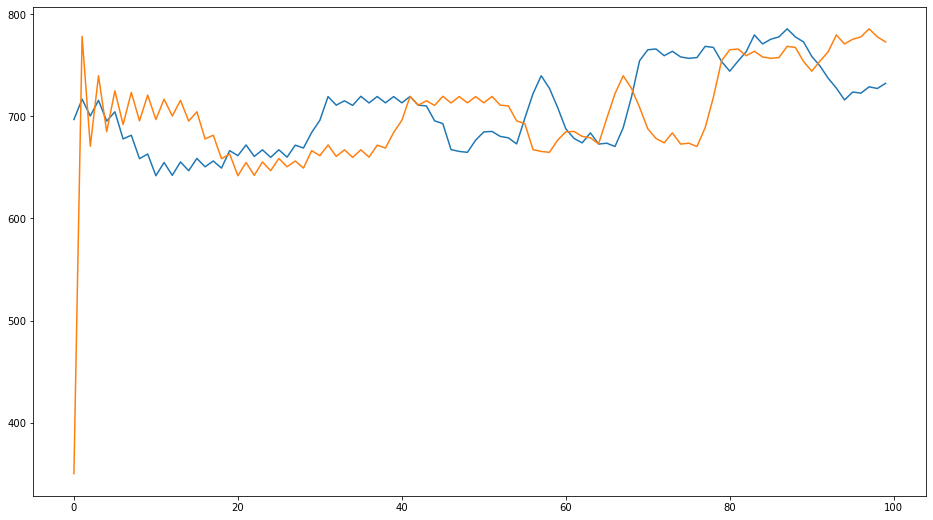

-288


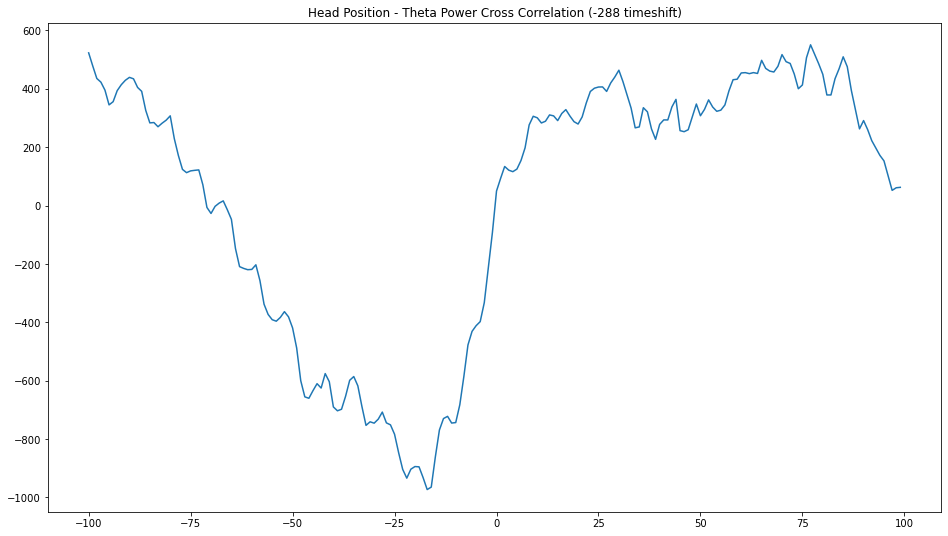

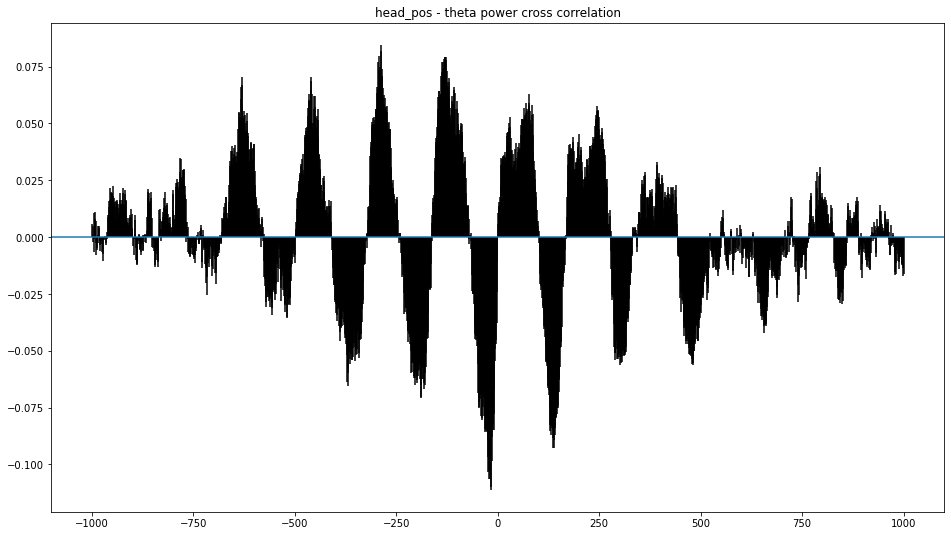

Text(0.5, 1.0, 'head_pos - head pos auto correlation')

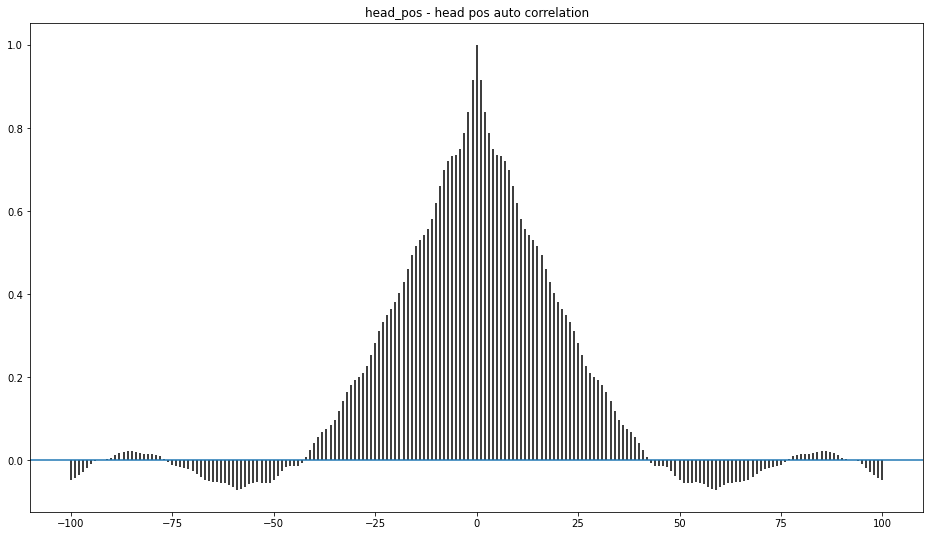

In [596]:
plt.plot(yMM[10:110])
plt.plot(yMM[:100])
plt.show()


x_correlation = scipy.signal.correlate(scipy.stats.zscore(head_pos_total), scipy.stats.zscore(theta_power_total), mode='same')
half_len = len(x_correlation)//2
radius = 100
plt.plot(range(-half_len, half_len)[half_len-radius:half_len+radius], x_correlation[half_len-radius:half_len+radius])

time_shift_x = range(-len(x_correlation)//2, len(x_correlation)//2)[np.argmax(x_correlation)]
print(time_shift_x)

plt.title("Head Position - Theta Power Cross Correlation ({} timeshift)".format(time_shift_x))
plt.show()

plt.xcorr(scipy.stats.zscore(head_pos_total), scipy.stats.zscore(theta_power_total), maxlags=1000)
plt.title('head_pos - theta power cross correlation')
plt.show()

plt.acorr(scipy.stats.zscore(head_pos_total), maxlags=100)
plt.title('head_pos - head pos auto correlation')

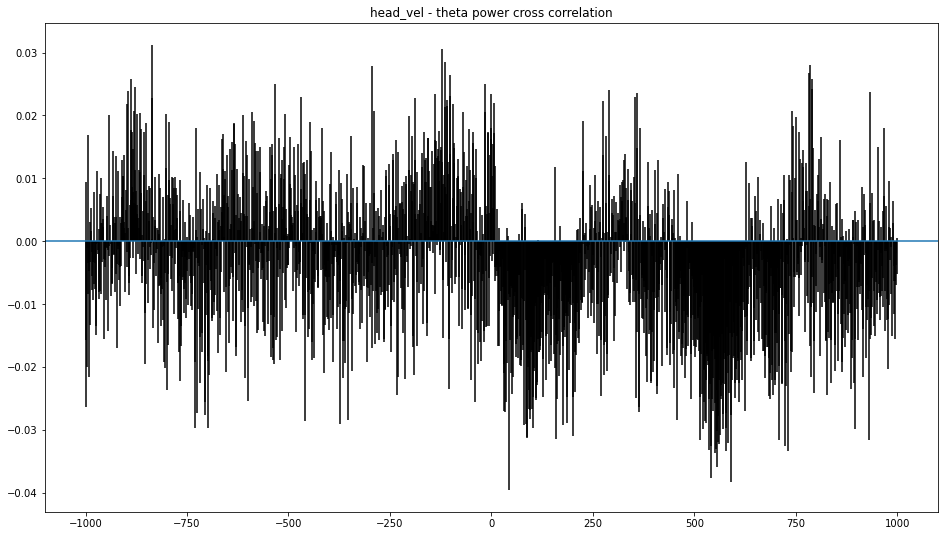

Text(0.5, 1.0, 'head_vel - head pos auto correlation')

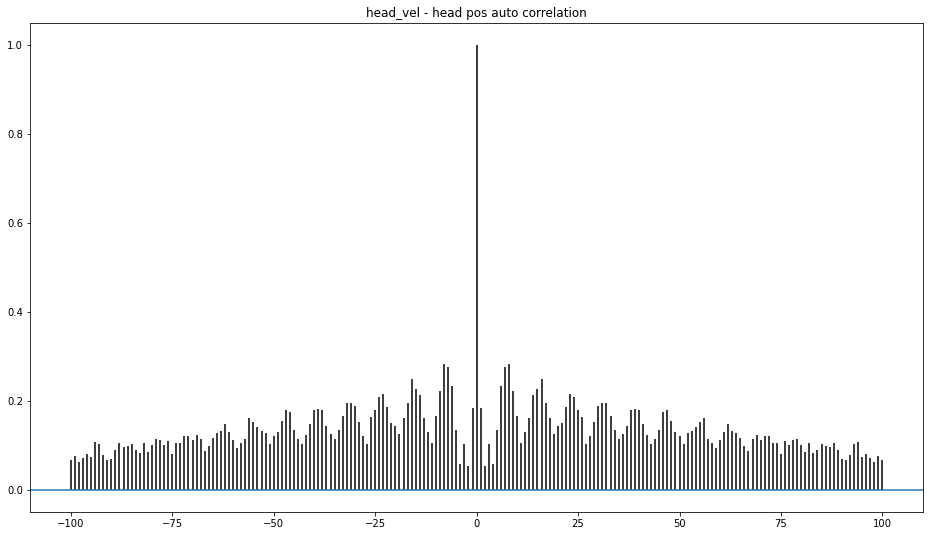

In [598]:
plt.xcorr(scipy.stats.zscore(head_vel_total), scipy.stats.zscore(theta_power_total), maxlags=1000)
plt.title('head_vel - theta power cross correlation')
plt.show()

plt.acorr(scipy.stats.zscore(head_vel_total), maxlags=100)
plt.title('head_vel - head pos auto correlation')

(array([ 167.,  304.,  677., 1055., 1966., 2277., 1413.,  537.,  213.,
         151.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

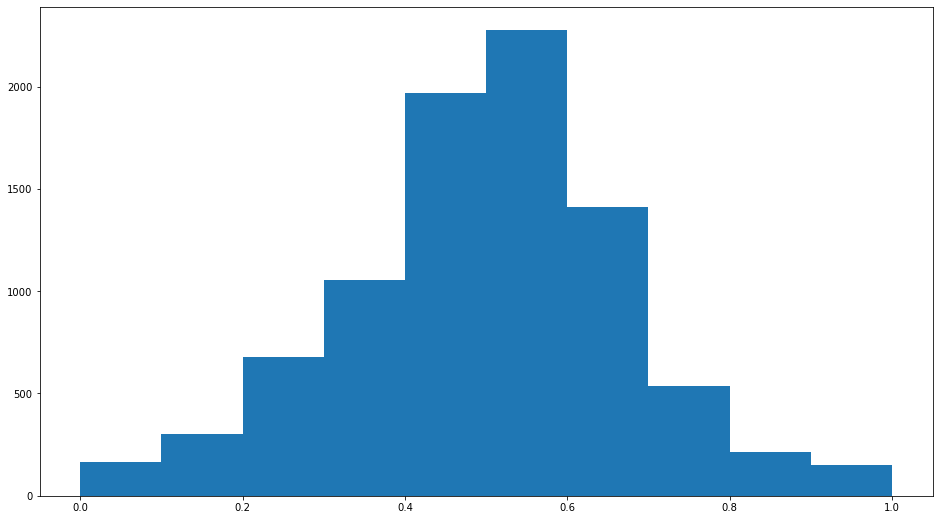

In [600]:
plt.hist(head_vel_total)

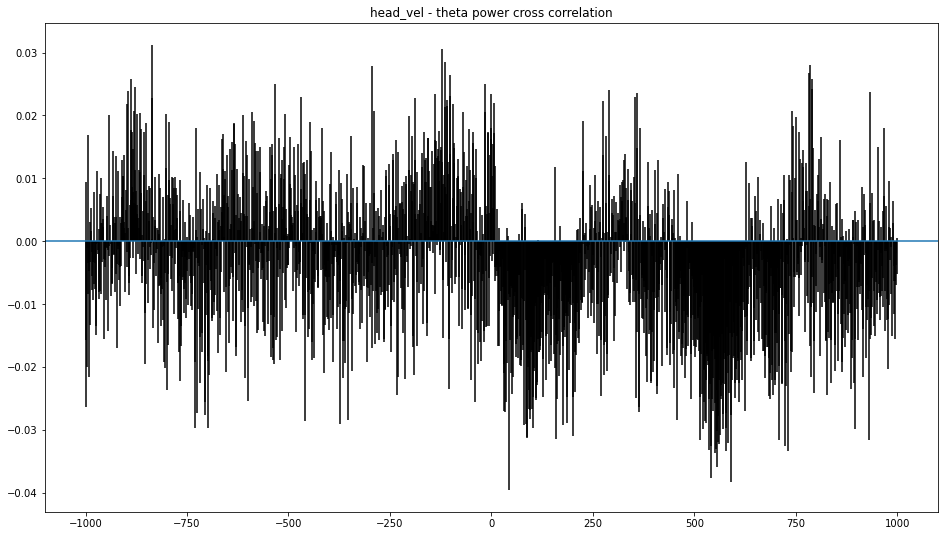

Text(0.5, 1.0, 'head_vel - head pos auto correlation')

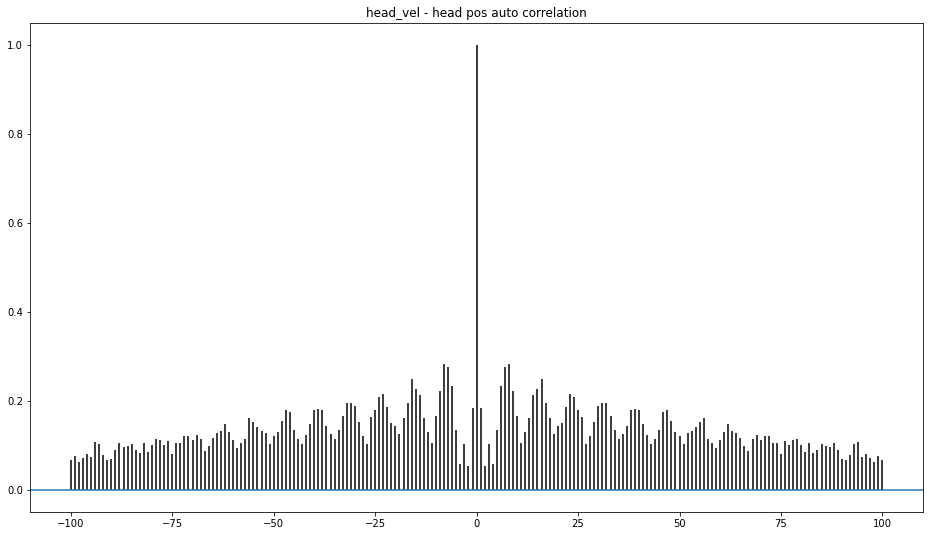

In [599]:
plt.xcorr(scipy.stats.zscore(np.abs(head_vel_total)), scipy.stats.zscore(theta_power_total), maxlags=1000)
plt.title('head_vel - theta power cross correlation')
plt.show()

plt.acorr(scipy.stats.zscore(head_vel_total), maxlags=100)
plt.title('head_vel - head pos auto correlation')

In [588]:
np.corrcoef(head_pos_total, theta_power_total)

array([[1.        , 0.00569388],
       [0.00569388, 1.        ]])

In [592]:
np.corrcoef(head_pos_total[:-20], head_pos_total[20:])

array([[1.        , 0.38352291],
       [0.38352291, 1.        ]])

662 698
1940 2160
2604 2664
3378 3572
4382 4603
5131 5324
6030 6245
6593 6617
7583 7791
8598 8809
9371 9563
10369 10573
11386 11597
12445 12649
13195 13441
14106 14312
14827 15021
15745 15938
16526 16710
17606 17789
17875 17917
18830 19023
19705 19893
20678 20871
21698 21878
22414 22601
23467 23643
24282 24470
25259 25457
27014 27052
28531 28713
30095 30300
30851 30881
31828 32010
32066 32096
32693 32729
33452 33643
34208 34380
35103 35283
35937 36119
36810 36981
37506 37718
38348 38528
39393 39597
40065 40087
40889 41095
41779 41963
42787 42973
43769 43952
44702 44879
45727 45895
47716 47906
48541 48709
49348 49519
50552 50733
51637 51674
52382 52562
53673 53936
54680 54708
56433 56710


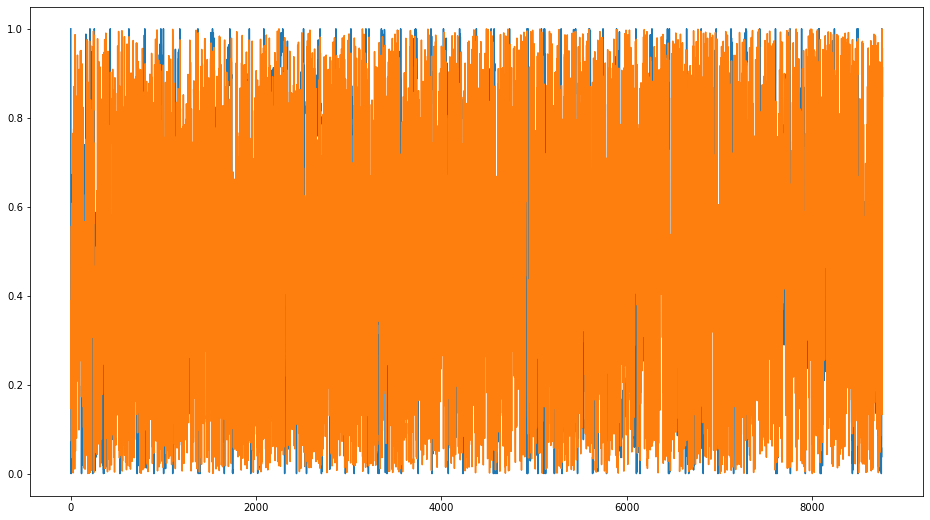

In [503]:
head_pos_total = []
head_vel_total = []
theta_power_total = []

for i in range(len(segments)):
    s, e, sect = segments[i]
    if(s != 23653):
        print(s, e)

        trim_s, trim_e = 10, -10

        head_pos = yMM[s:e][trim_s:trim_e]
        head_pos = head_pos - np.median(head_pos)
        head_pos = (head_pos - np.min(head_pos))/(np.max(head_pos) - np.min(head_pos))

        head_vel = v_y[s:e][trim_s:trim_e]
        head_vel -= np.mean(head_vel)
        head_vel = (head_vel - np.min(head_vel))/(np.max(head_vel) - np.min(head_vel))

        theta_snippet = data_percentile[s:e][trim_s:trim_e]
        theta_snippet = np.array(theta_snippet)/100
        
        assert len(theta_snippet) == len(head_pos)

        head_pos_total += list(head_pos)
        head_vel_total += list(head_vel)
        theta_power_total += list(theta_snippet)
        
        x_correlation = scipy.signal.correlate(head_pos_total, theta_power_total, mode='same')
        plt.xcorr(scipy.stats.zscore(np.abs(head_vel_total)), scipy.stats.zscore(theta_power_total), maxlags=1000)

    half_len = len(x_correlation)//2
    plt.plot(range(-half_len, half_len), x_correlation)

    time_shift_x = range(-len(x_correlation)//2, len(x_correlation)//2)[np.argmax(x_correlation)]
    print(time_shift_x)

    plt.title("Head Position - Theta Power Cross Correlation ({} timeshift)".format(time_shift_x))
    plt.show()
    
plt.plot(head_pos_total)
plt.plot(theta_power_total)

662 698
1940 2160
Correlation (nan, nan)
Correlation (-0.10864036463684709, 0.1256921875360071)
2604 2664
3378 3572
Correlation (-0.08758096079170645, 0.25049211063512805)
Correlation (0.08468088030026111, 0.26658423714968477)
4382 4603
Correlation (-0.014737353474938354, 0.8355052094752311)
Correlation (0.027180807538603316, 0.7017035486044586)
5131 5324
Correlation (-0.212816097859367, 0.004936594223183267)
Correlation (0.06528250050265062, 0.39346907100282286)
6030 6245
Correlation (-0.06790799304643061, 0.34553966078976744)
Correlation (0.07906958231760458, 0.27186881733657764)
6593 6617
7583 7791
Correlation (-0.22554334161914139, 0.0018578118363937423)
Correlation (0.14624616796741463, 0.04521666667754829)
8598 8809
Correlation (0.1745882062497276, 0.015709293124270017)
Correlation (-0.14635132050871275, 0.04335961242355215)
9371 9563
Correlation (0.07067228624730834, 0.3569186855690224)
Correlation (0.04916450771737531, 0.5218656189222806)
10369 10573
Correlation (-0.09752465363

ValueError: maxlags must be None or strictly positive < 148

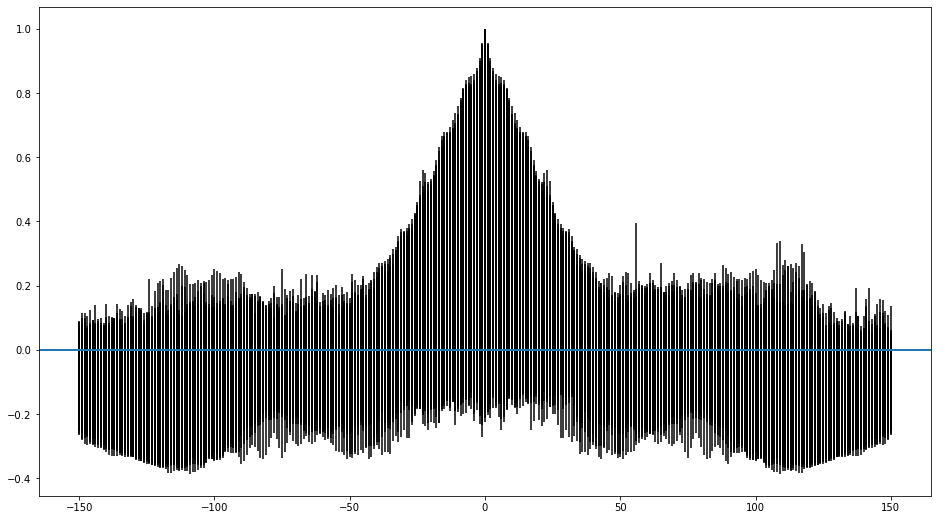

In [635]:
pos_theta_corr = []
vel_theta_corr = []
pos_pos_corr = []
abs_vel_theta_corr = []

for i in range(len(segments)):
    s, e, sect = segments[i]
    print(s, e)
    if(e-s > 150):
        trim_s, trim_e = 10, -10

        head_pos = yMM[s:e][trim_s:trim_e]
        #head_pos = head_pos - np.median(head_pos)
        head_pos = scipy.stats.zscore(head_pos)
        #head_pos = (head_pos - np.min(head_pos))/(np.max(head_pos) - np.min(head_pos))

        head_vel = v_y[s:e][trim_s:trim_e]
        #head_vel -= np.mean(head_vel)
        #head_vel = (head_vel - np.min(head_vel))/(np.max(head_vel) - np.min(head_vel))
        head_vel = scipy.stats.zscore(head_vel)
        theta_snippet = theta_sub10hz[s:e][trim_s:trim_e]
        theta_snippet = scipy.stats.zscore(theta_snippet)
        #theta_snippet = np.array(theta_snippet)/100
        #theta_snippet = (theta_snippet - np.min(theta_snippet))/(np.max(theta_snippet) - np.min(theta_snippet))

        print("Correlation", scipy.stats.pearsonr(head_pos, theta_snippet))
        print("Correlation", scipy.stats.pearsonr(head_vel, theta_snippet))
        
        if(False):
            fig, axs = plt.subplots(6, 1, constrained_layout = True)
            axs[0].plot(head_pos, label='head_pos')
            axs[0].plot(theta_snippet, label='theta_power_percentile')
            axs[0].set_title("Head Pos (relative to mean head position) vs Theta Power Percentile")
            axs[0].legend()

            axs[1].plot(head_vel, label='head velocity')
            axs[1].plot(theta_snippet, label='theta_power_percentile')
            axs[1].set_title("Head Velocity (relative to mean head vel) vs Theta Power Percentile")
            axs[1].legend()

            axs[2].xcorr(head_pos, head_pos, maxlags=len(head_pos)-1)
            axs[2].set_title('Auto-correlation Head Position')
            axs[2].set_ylim(0,1)

            axs[3].xcorr(head_pos, theta_snippet, maxlags=len(head_pos)-1)
            axs[3].set_title('Cross-correlation Head Position and Theta Snippet')
            axs[3].set_ylim(0,1)

            axs[4].xcorr(head_vel, head_vel, maxlags=len(head_vel)-1)
            axs[4].set_title('Auto-correlation Head Velocity')
            axs[4].set_ylim(0,1)

            axs[5].xcorr(head_vel, theta_snippet, maxlags=len(head_vel)-1)
            axs[5].set_title('Cross-correlation Head Velocity and Theta Snippet')
            axs[5].set_ylim(0,1)


            plt.show()

        lags, c, line, b = plt.xcorr(scipy.stats.zscore(np.abs(v_y[s:e][trim_s:trim_e])), theta_snippet, maxlags=150)
        abs_vel_theta_corr.append(c)

        lags, c, line, b = plt.xcorr(head_vel, theta_snippet, maxlags=150)
        vel_theta_corr.append(c)

        lags, c, line, b = plt.xcorr(head_pos, theta_snippet, maxlags=150)
        pos_theta_corr.append(c)

        lags, c, line, b = plt.xcorr(head_pos, head_pos, maxlags=150)
        pos_pos_corr.append(c)

In [639]:
np.array(c).shape

(41, 301)

(301,)


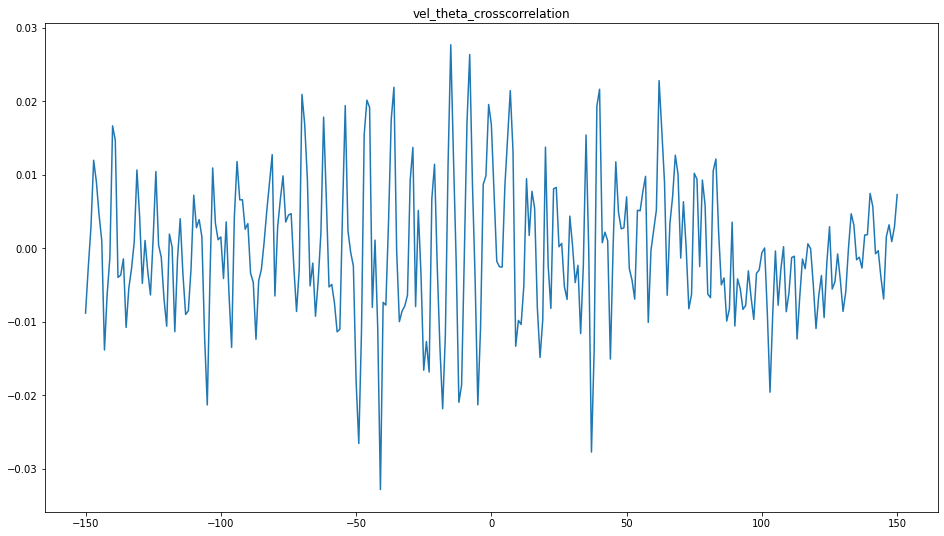

(301,)


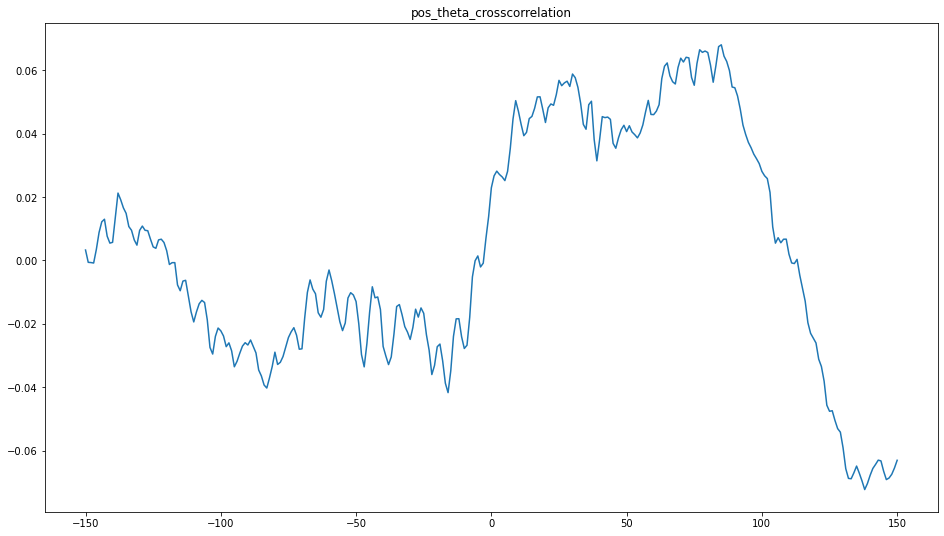

(301,)


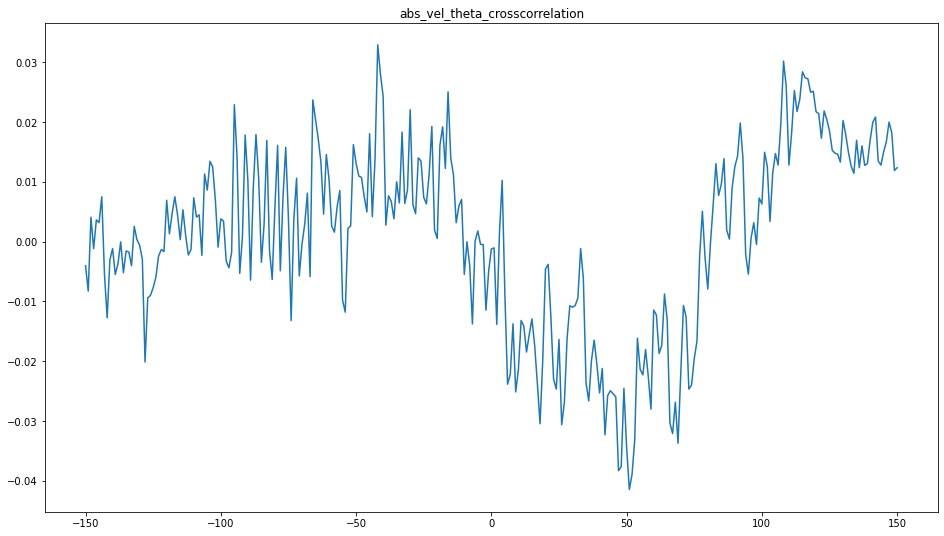

(301,)


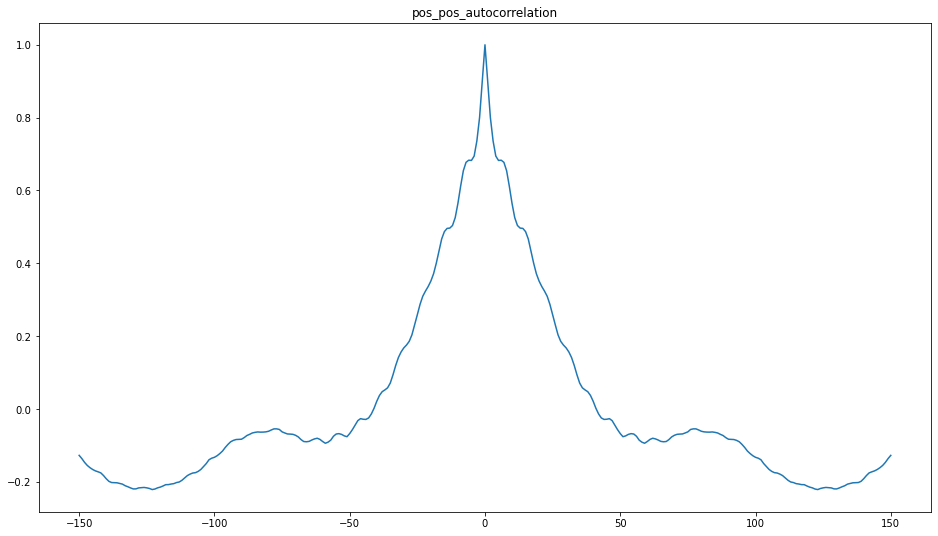

In [640]:
c = vel_theta_corr
print(np.mean(np.array(c),axis=0).shape)
plt.title('vel_theta_crosscorrelation')
plt.plot(np.arange(-150,151), np.mean(np.array(c),axis=0))
plt.show()

c = pos_theta_corr
print(np.mean(np.array(c),axis=0).shape)
plt.title('pos_theta_crosscorrelation')
plt.plot(np.arange(-150,151), np.mean(np.array(c),axis=0))
plt.show()

c = abs_vel_theta_corr
print(np.mean(np.array(c),axis=0).shape)
plt.title('abs_vel_theta_crosscorrelation')
plt.plot(np.arange(-150,151), np.mean(np.array(c),axis=0))
plt.show()

c = pos_pos_corr
print(np.mean(np.array(c),axis=0).shape)
plt.title('pos_pos_autocorrelation')
plt.plot(np.arange(-150,151), np.mean(np.array(c),axis=0))
plt.show()

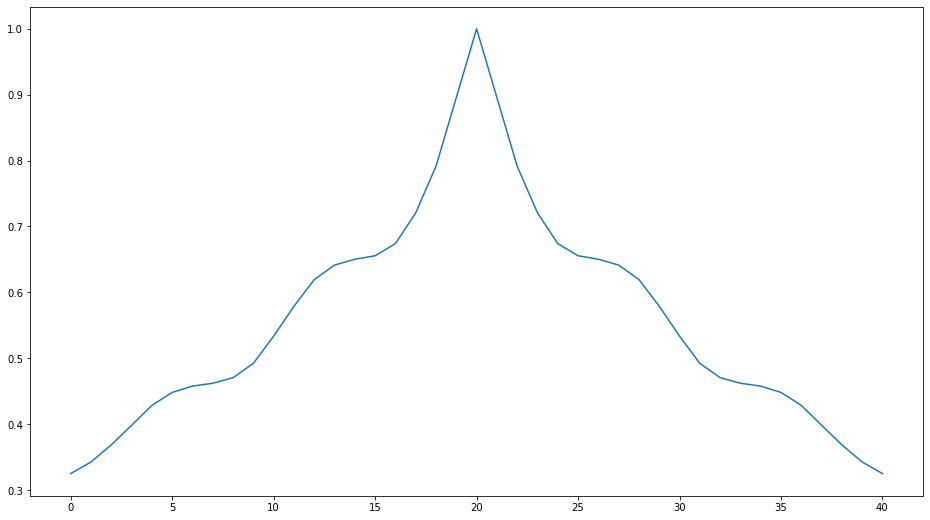

662 698
Correlation SpearmanrResult(correlation=-0.007322852814278949, pvalue=0.976993817231541)


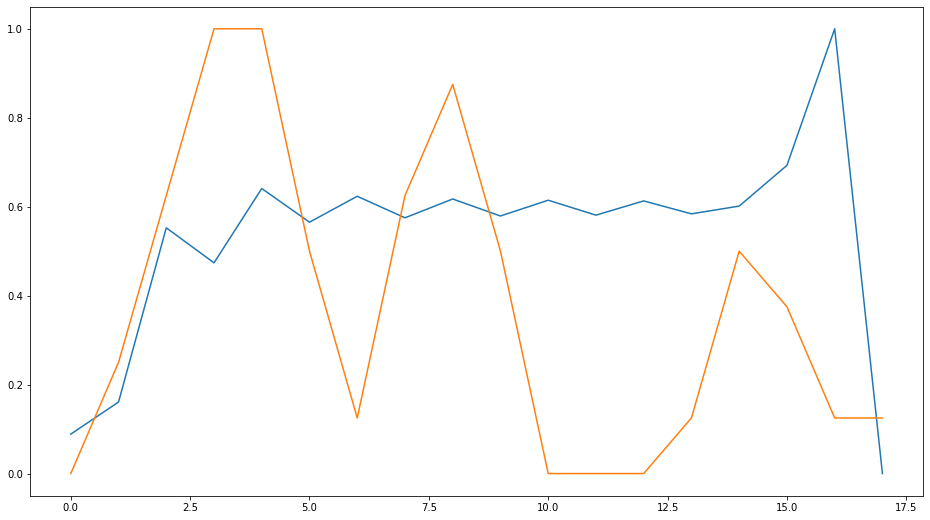

1940 2160
Correlation SpearmanrResult(correlation=0.06376114927879245, pvalue=0.3673171546416456)


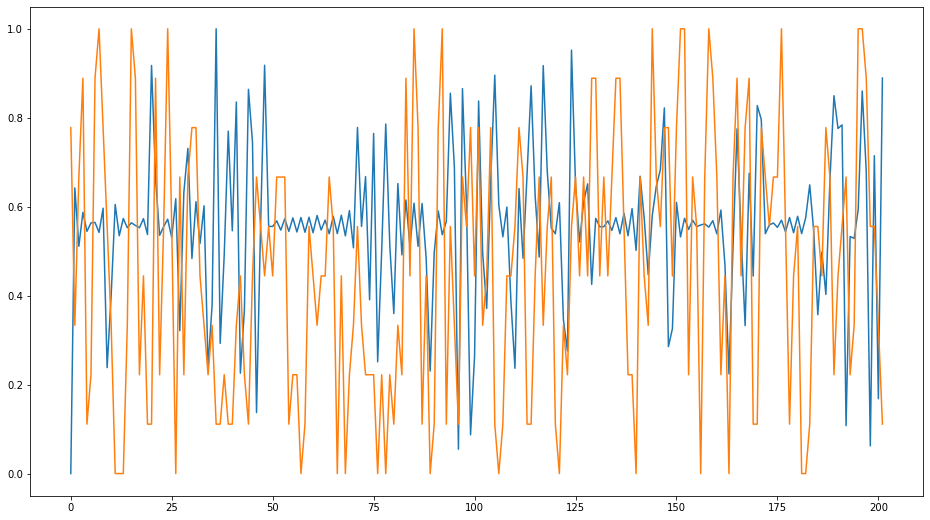

2604 2664
Correlation SpearmanrResult(correlation=-0.18629197425191185, pvalue=0.23750341002294528)


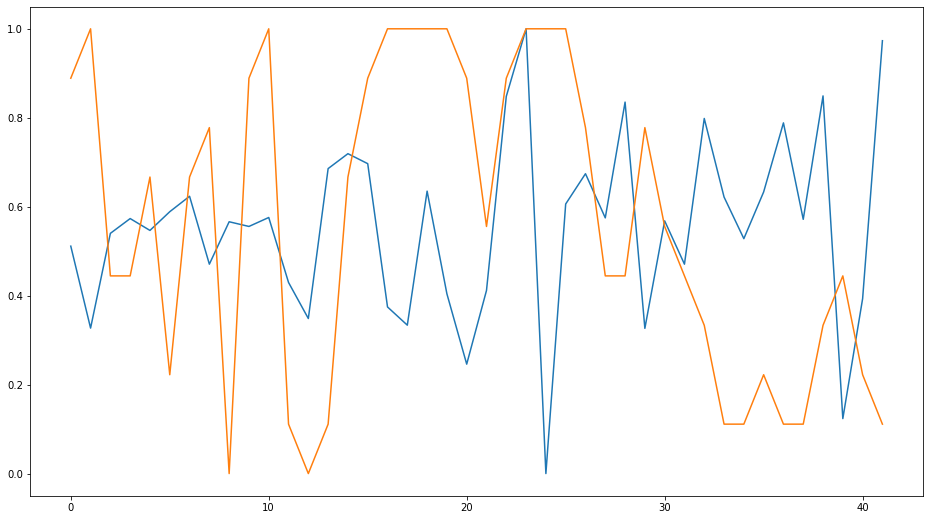

3378 3572
Correlation SpearmanrResult(correlation=-0.07405702027370999, pvalue=0.32865888539020005)


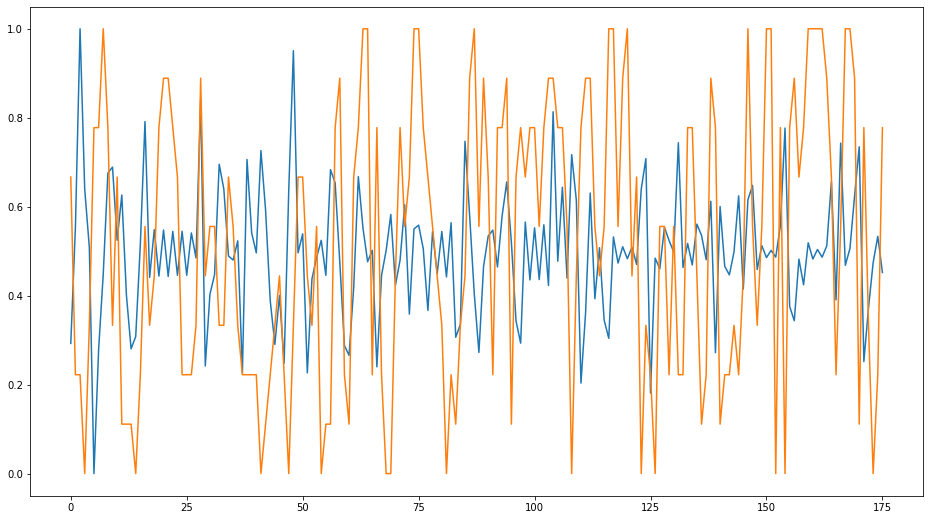

4382 4603
Correlation SpearmanrResult(correlation=0.05413778695162565, pvalue=0.4429956834464467)


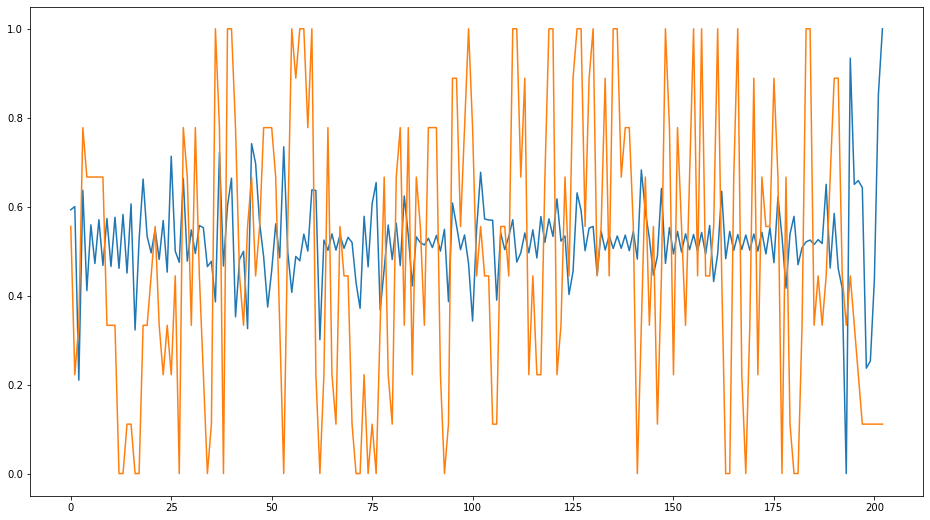

5131 5324
Correlation SpearmanrResult(correlation=0.04007802308739088, pvalue=0.5984751856841444)


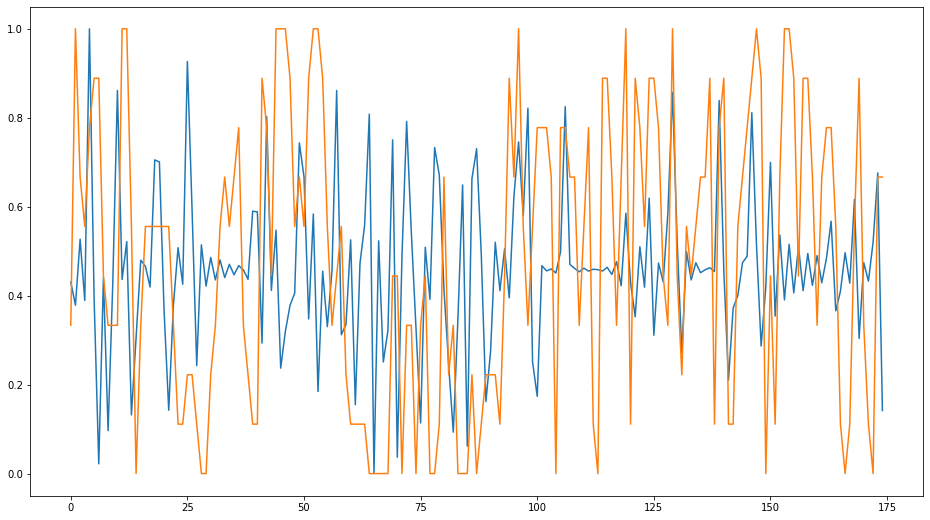

6030 6245
Correlation SpearmanrResult(correlation=-0.04638943297783828, pvalue=0.5174301480184624)


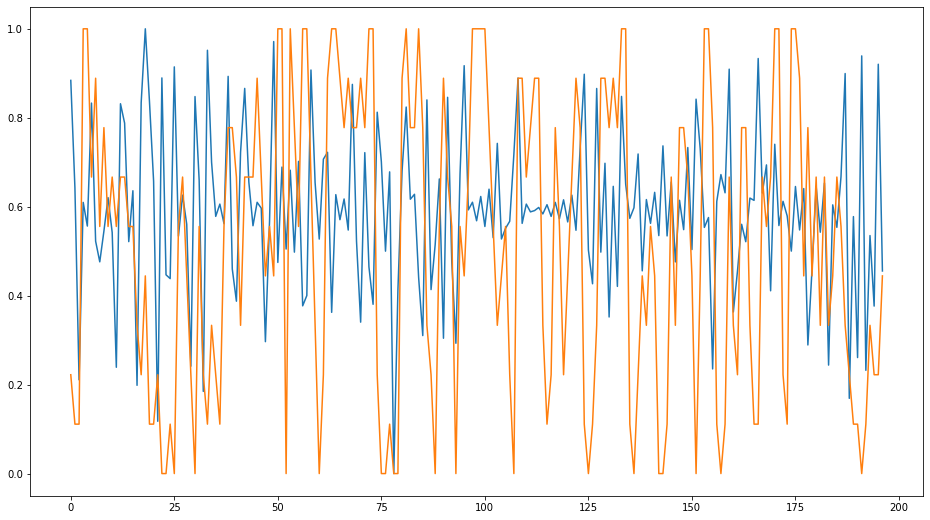

6593 6617
Correlation SpearmanrResult(correlation=0.0, pvalue=1.0)


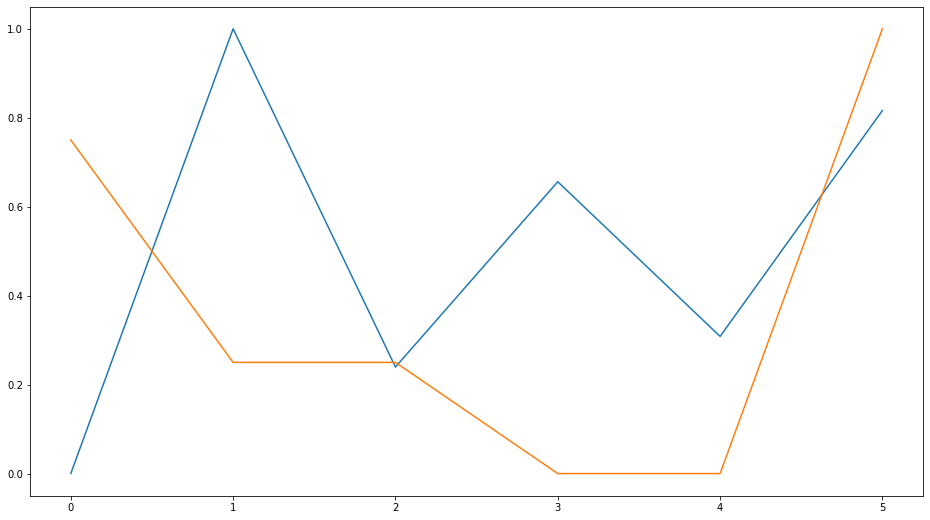

7583 7791
Correlation SpearmanrResult(correlation=0.12443118616976369, pvalue=0.08717321404940581)


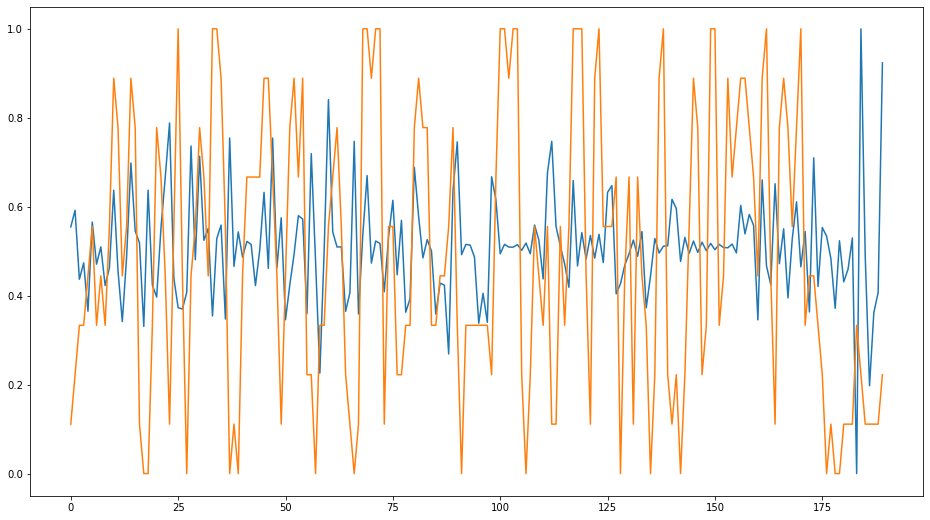

8598 8809
Correlation SpearmanrResult(correlation=0.1417875245353231, pvalue=0.04919151243513337)


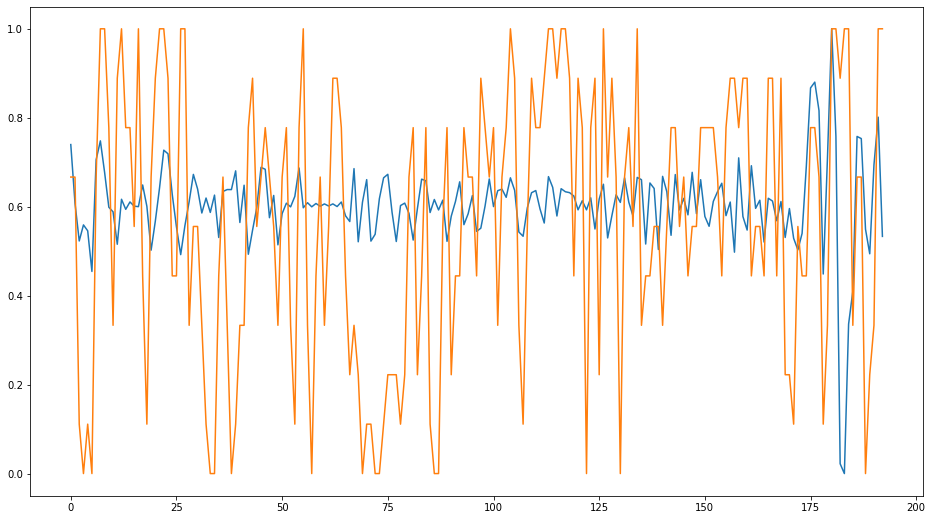

9371 9563
Correlation SpearmanrResult(correlation=-0.0026274874082619433, pvalue=0.9725508597359613)


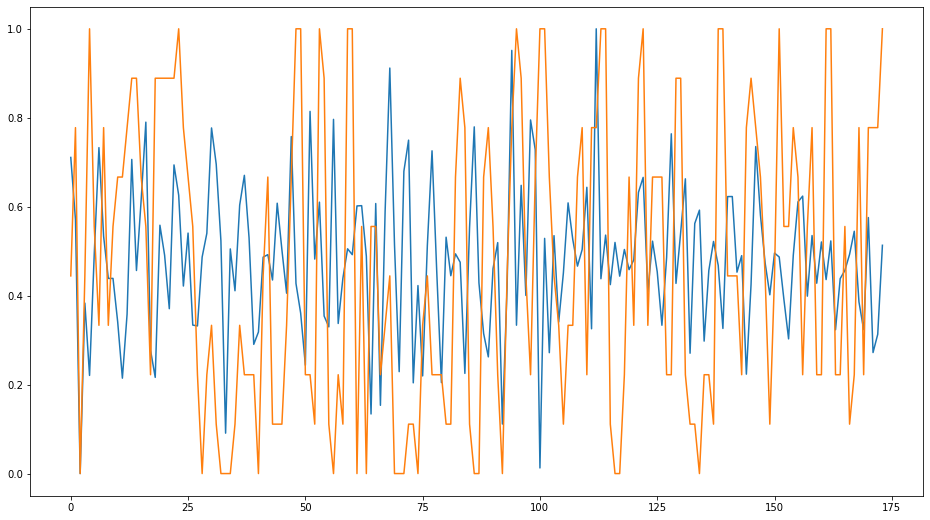

10369 10573


ValueError: zero-size array to reduction operation minimum which has no identity

In [454]:
for i in range(len(segments)):
    s, e, sect = segments[i]
    print(s, e)
    
    trim_s, trim_e = 9, -9
    
    
    theta_snippet = labels[s:e][trim_s:trim_e]
    theta_snippet = theta_snippet/10
    #theta_snippet = (theta_snippet - np.min(theta_snippet))/(np.max(theta_snippet) - np.min(theta_snippet))
    
    
    
    plt.plot(head_vel, label='head velocity')
    plt.plot(theta_snippet, label='theta_power_percentile')
    plt.title("Head Velocity (relative to mean head vel) vs Theta Power Percentile")
    plt.show()

    